In [ ]:
import os
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf

KEYWORDS_DIR = Path("keywords_augmented")
UNKNOWN_DIR = Path("unknown_balanced")
KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
SAMPLE_RATE = 16000

records = []

def load_wav(path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)
    if x.ndim > 1:
        x = x.mean(axis=1)
    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")
    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1/fs)
    return freqs, mag


# Kurtosis 

# Crest Factor 

# Variance

# Std. Deviation


def rms_energy(x):
    return float(np.sqrt(np.mean(x**2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs)-1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

# argmin frequency 

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag**2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

# keywords
for label in KEYWORD_LABELS:
    for wav_path in sorted((KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)

        record = {
            "rms": rms_energy(x),
            "zcr": zero_crossing_rate(x),
            "centroid": spectral_centroid(x, SAMPLE_RATE),
            "rolloff": spectral_rolloff(x, SAMPLE_RATE),
            "dominant_freq": dominant_frequency(x, SAMPLE_RATE),
            "band_0_500": band_energy(x, SAMPLE_RATE, 0, 500),
            "band_500_1500": band_energy(x, SAMPLE_RATE, 500, 1500),
            "band_1500_3000": band_energy(x, SAMPLE_RATE, 1500, 3000),
            "band_3000_6000": band_energy(x, SAMPLE_RATE, 3000, 6000),
            "activity": label,
            "filename": wav_path.name,
        }
        records.append(record)

# unknown
for wav_path in sorted(UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)

    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, SAMPLE_RATE),
        "rolloff": spectral_rolloff(x, SAMPLE_RATE),
        "dominant_freq": dominant_frequency(x, SAMPLE_RATE),
        "band_0_500": band_energy(x, SAMPLE_RATE, 0, 500),
        "band_500_1500": band_energy(x, SAMPLE_RATE, 500, 1500),
        "band_1500_3000": band_energy(x, SAMPLE_RATE, 1500, 3000),
        "band_3000_6000": band_energy(x, SAMPLE_RATE, 3000, 6000),
        "activity": "unknown",
        "filename": wav_path.name,
    }
    records.append(record)

feature_df = pd.DataFrame(records)
print(feature_df.head())
print(feature_df.shape)

feature_df.to_csv("audio_features.csv", index=False)

        rms       zcr    centroid  rolloff  dominant_freq    band_0_500  \
0  0.046730  0.111694  844.742391    904.0          553.0  43652.267402   
1  0.043391  0.125195  848.781509    935.0          554.0  42304.566381   
2  0.040324  0.109319  859.475721    945.0          551.0  37954.436568   
3  0.044332  0.123008  866.310597    923.0          504.0  52814.558962   
4  0.044016  0.114757  839.892363    867.0          553.0  43095.621496   

   band_500_1500  band_1500_3000  band_3000_6000 activity  \
0   69244.062676       91.217396       43.277801      får   
1   55146.355701      102.063563       45.665800      får   
2   47725.918785       81.931404       44.021804      får   
3   69525.458320      190.439781       98.449010      får   
4   59873.059995      130.096260       43.916107      får   

                          filename  
0  får_A_0.75m_nygaard_001_s01.wav  
1  får_A_0.75m_nygaard_001_s02.wav  
2  får_A_0.75m_nygaard_001_s03.wav  
3  får_A_0.75m_nygaard_001_s04.wav

Accuracy: 0.9481481481481482
              precision    recall  f1-score   support

         får       0.96      0.94      0.95        54
         ged       0.84      0.94      0.89        54
        hest       0.98      0.94      0.96        54
        laks       0.95      0.96      0.95        54
         ulv       0.98      0.94      0.96        54
     unknown       0.96      0.95      0.95       270

    accuracy                           0.95       540
   macro avg       0.94      0.95      0.95       540
weighted avg       0.95      0.95      0.95       540



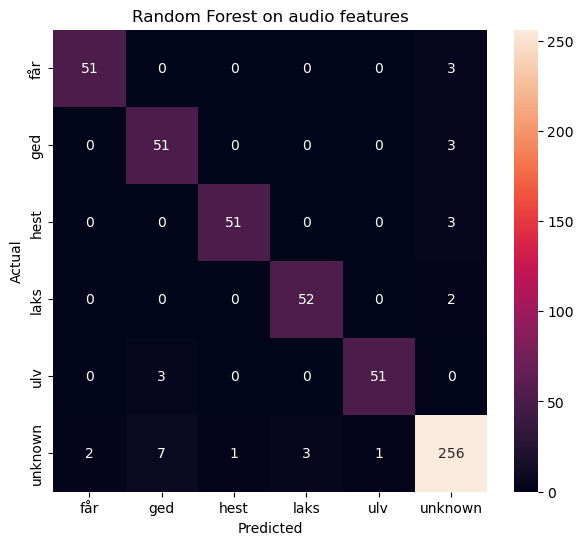

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

X = feature_df.drop(columns=["activity", "filename"])
y = feature_df["activity"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=np.unique(y))
plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest on audio features")
plt.show()

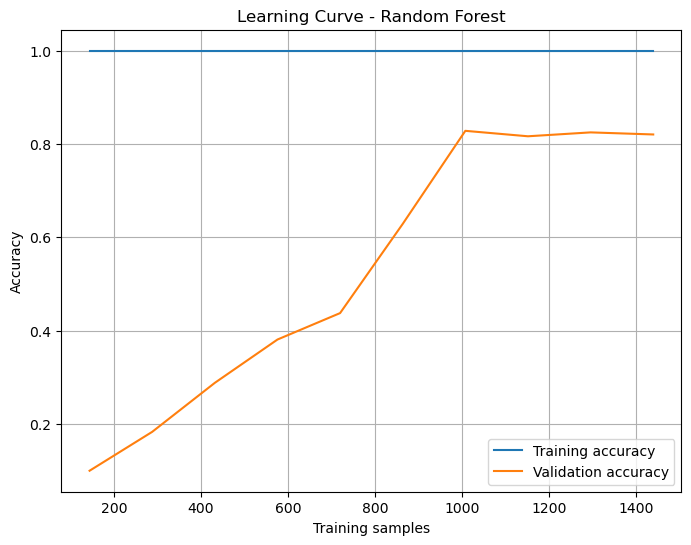

In [ ]:
from sklearn.model_selection import learning_curve
import numpy as np
import matplotlib.pyplot as plt

train_sizes, train_scores, val_scores = learning_curve(
    clf,
    X,
    y,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_mean = train_scores.mean(axis=1)
val_mean = val_scores.mean(axis=1)

plt.figure(figsize=(8,6))

plt.plot(train_sizes, train_mean, label="Training accuracy")
plt.plot(train_sizes, val_mean, label="Validation accuracy")

plt.xlabel("Training samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Random Forest")
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
import pandas as pd

importances = clf.feature_importances_

feat_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": importances
}).sort_values("importance", ascending=False)

print(feat_importance)

          feature  importance
2        centroid    0.163211
3         rolloff    0.162955
1             zcr    0.145497
6   band_500_1500    0.117354
4   dominant_freq    0.101639
5      band_0_500    0.084047
8  band_3000_6000    0.081161
7  band_1500_3000    0.080338
0             rms    0.063798


ALT OVENOVER ER FEATURE BEREGNING UDEN MFCC. HER FÅR VI EN LIDT LAVERE ACCURACY SCORE END HVIS MFCC VAR MED, MEN DET ER STADIGVÆK EN RET STOR SCORE UDEN MFCC, HVILKET UMIDDELBART ER GODT. 

Nedenunder viser feature beregning med MFCC.

        rms       zcr    centroid  rolloff  dominant_freq    band_0_500  \
0  0.046730  0.111694  844.742391    904.0          553.0  43652.267402   
1  0.043391  0.125195  848.781509    935.0          554.0  42304.566381   
2  0.040324  0.109319  859.475721    945.0          551.0  37954.436568   
3  0.044332  0.123008  866.310597    923.0          504.0  52814.558962   
4  0.044016  0.114757  839.892363    867.0          553.0  43095.621496   

   band_500_1500  band_1500_3000  band_3000_6000      mfcc_1  ...     mfcc_6  \
0   69244.062676       91.217396       43.277801 -408.173126  ...  -8.247363   
1   55146.355701      102.063563       45.665800 -416.748413  ...  -9.552252   
2   47725.918785       81.931404       44.021804 -399.915405  ... -15.425940   
3   69525.458320      190.439781       98.449010 -411.326050  ...  -6.978643   
4   59873.059995      130.096260       43.916107 -402.940247  ... -12.452536   

     mfcc_7    mfcc_8    mfcc_9   mfcc_10   mfcc_11   mfcc_12   mfcc

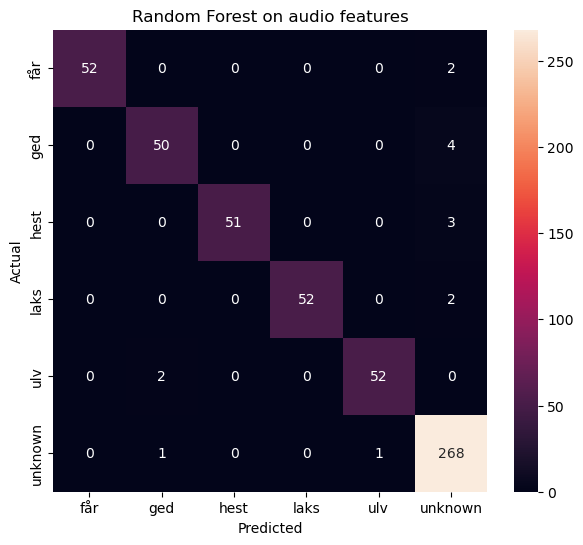

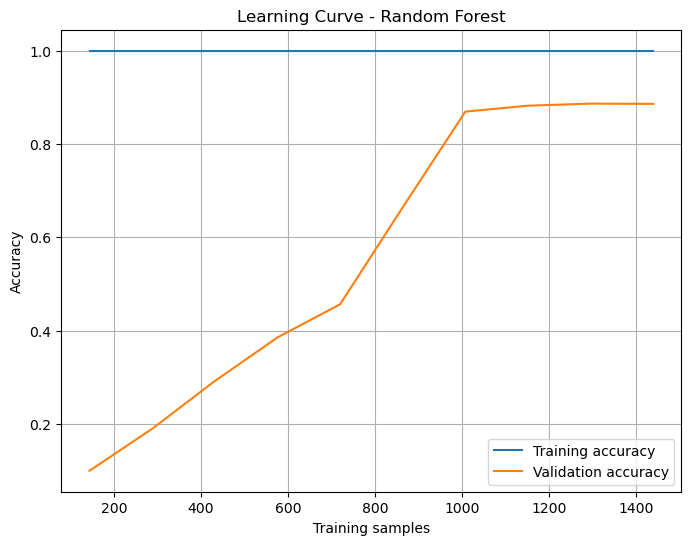

           feature  importance
3          rolloff    0.105438
2         centroid    0.100713
1              zcr    0.082528
15          mfcc_7    0.065902
4    dominant_freq    0.059375
6    band_500_1500    0.053166
8   band_3000_6000    0.052446
12          mfcc_4    0.049298
7   band_1500_3000    0.044936
10          mfcc_2    0.044120
5       band_0_500    0.042832
9           mfcc_1    0.042234
17          mfcc_9    0.037229
11          mfcc_3    0.035201
13          mfcc_5    0.031343
20         mfcc_12    0.028070
0              rms    0.027929
14          mfcc_6    0.026673
18         mfcc_10    0.020352
21         mfcc_13    0.017349
16          mfcc_8    0.017042
19         mfcc_11    0.015824


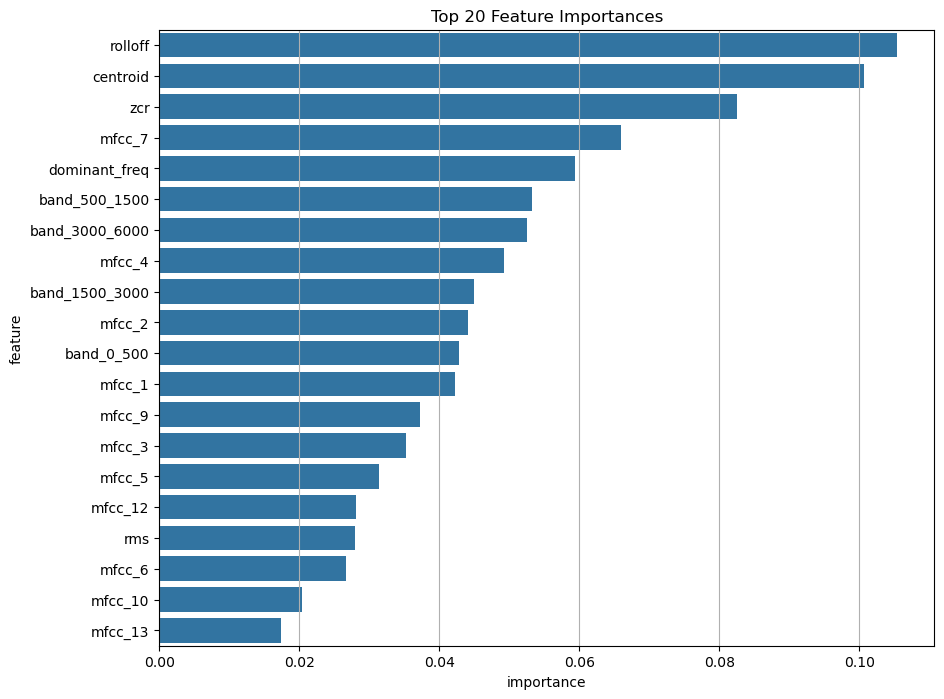

In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, learning_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# =========================
# SETTINGS
# =========================
KEYWORDS_DIR = Path("keywords_augmented")
UNKNOWN_DIR = Path("unknown_balanced")
KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD FEATURE DATAFRAME
# =========================
records = []

# keywords
for label in KEYWORD_LABELS:
    for wav_path in sorted((KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        records.append(record)

# unknown
for wav_path in sorted(UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    record["filename"] = wav_path.name
    records.append(record)

feature_df = pd.DataFrame(records)

print(feature_df.head())
print(feature_df.shape)

feature_df.to_csv("audio_features_with_mfcc.csv", index=False)

# =========================
# FEATURE SETS
# =========================
simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]

mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]

all_features = simple_features + mfcc_feature_cols

# Vælg hvilket sæt du vil teste:
feature_cols = all_features
# feature_cols = simple_features
# feature_cols = mfcc_feature_cols

# =========================
# TRAIN / TEST
# =========================
X = feature_df[feature_cols]
y = feature_df["activity"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# =========================
# CONFUSION MATRIX
# =========================
labels_sorted = np.unique(y)
cm = confusion_matrix(y_test, y_pred, labels=labels_sorted)

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=labels_sorted,
    yticklabels=labels_sorted
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest on audio features")
plt.show()

# =========================
# LEARNING CURVE
# =========================
train_sizes, train_scores, val_scores = learning_curve(
    clf,
    X,
    y,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_mean = train_scores.mean(axis=1)
val_mean = val_scores.mean(axis=1)

plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label="Training accuracy")
plt.plot(train_sizes, val_mean, label="Validation accuracy")
plt.xlabel("Training samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Random Forest")
plt.legend()
plt.grid(True)
plt.show()

# =========================
# FEATURE IMPORTANCE
# =========================
importances = clf.feature_importances_

feat_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": importances
}).sort_values("importance", ascending=False)

print(feat_importance)

# Optional plot
plt.figure(figsize=(10, 8))
sns.barplot(data=feat_importance.head(20), x="importance", y="feature")
plt.title("Top 20 Feature Importances")
plt.grid(True, axis="x")
plt.show()

Her får vi denne konklusion:

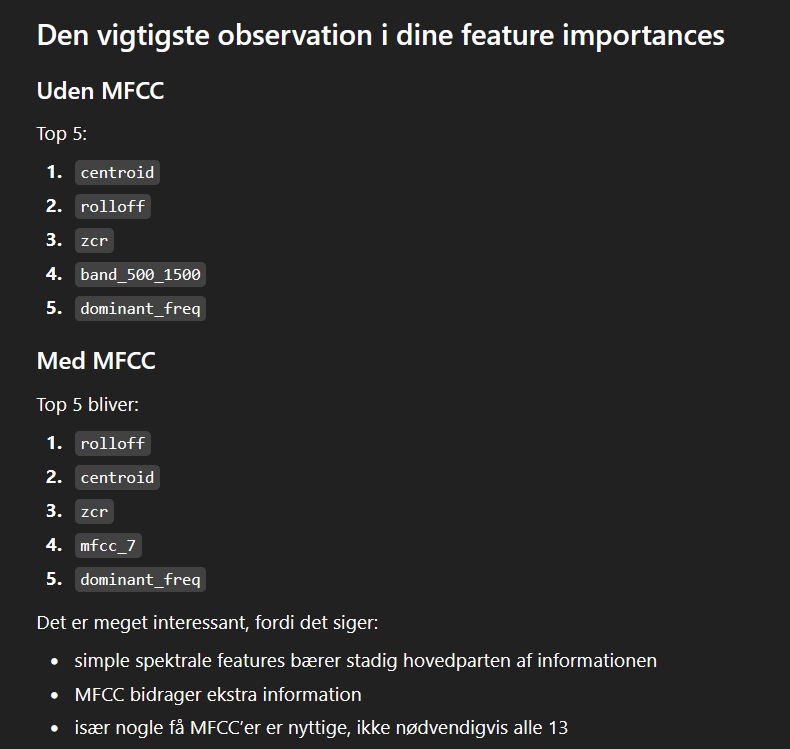

Hertil kan vi lave en sammenligning af accuracy scores med simple features og MFCC only features og dem sammen kombineret: 
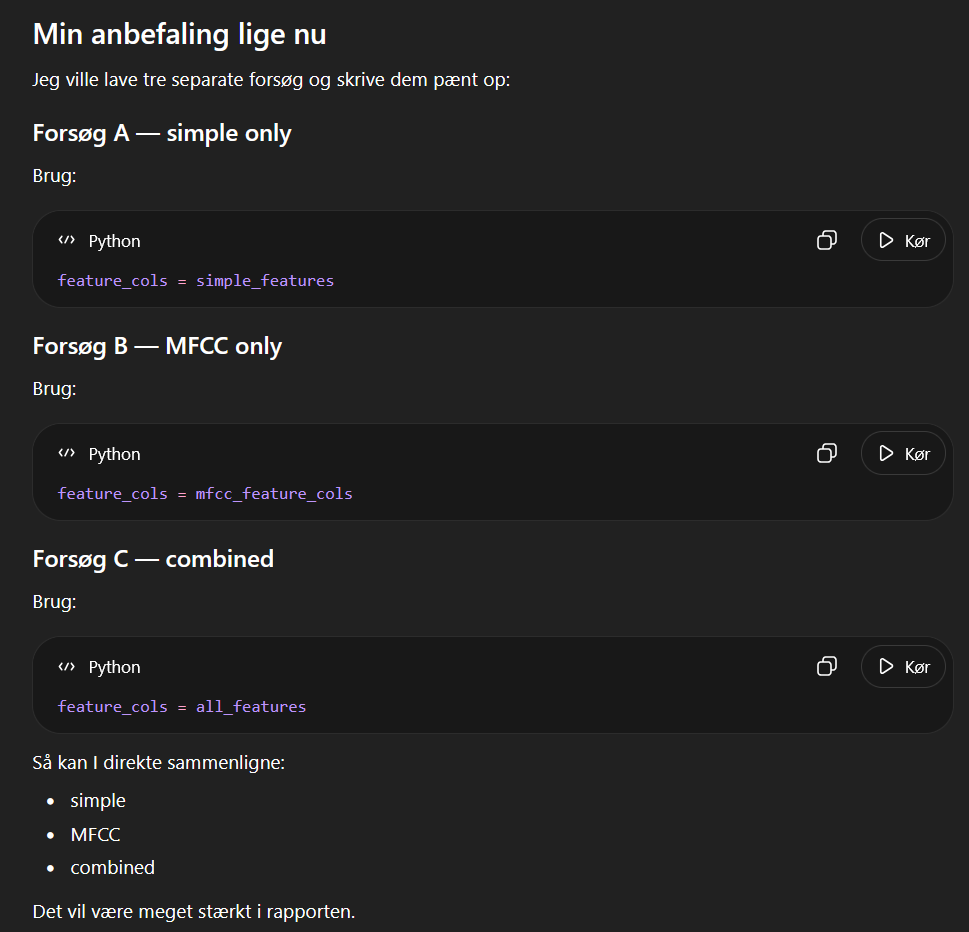

Derudover kan vi lave hvor vi extracter de 5 bedste features. En metode til det er at ved at aflæse feature importances (SPØRG MORTEN OM DETTE ER OK ELLER MAN BØR VÆRE MERE KONSEKVENT), og se hvor meget accuracy scoren så falder:

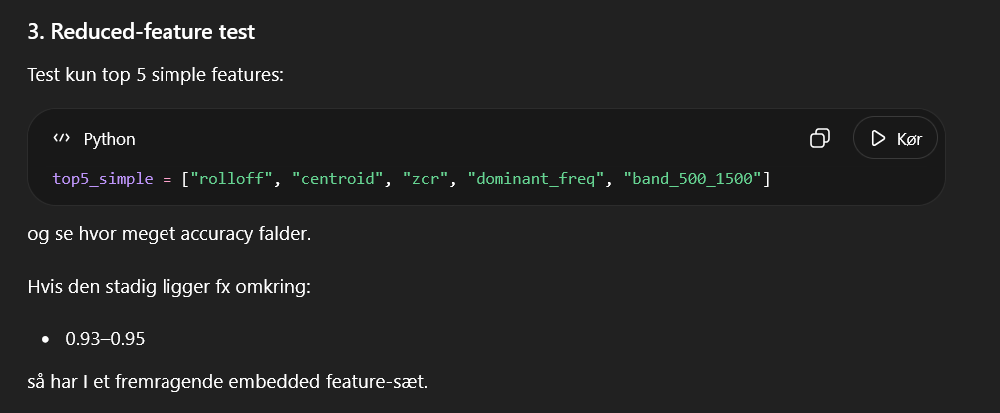



# Dog viser modellen en lille tegn for overfitting ud fra vores accuracy curve

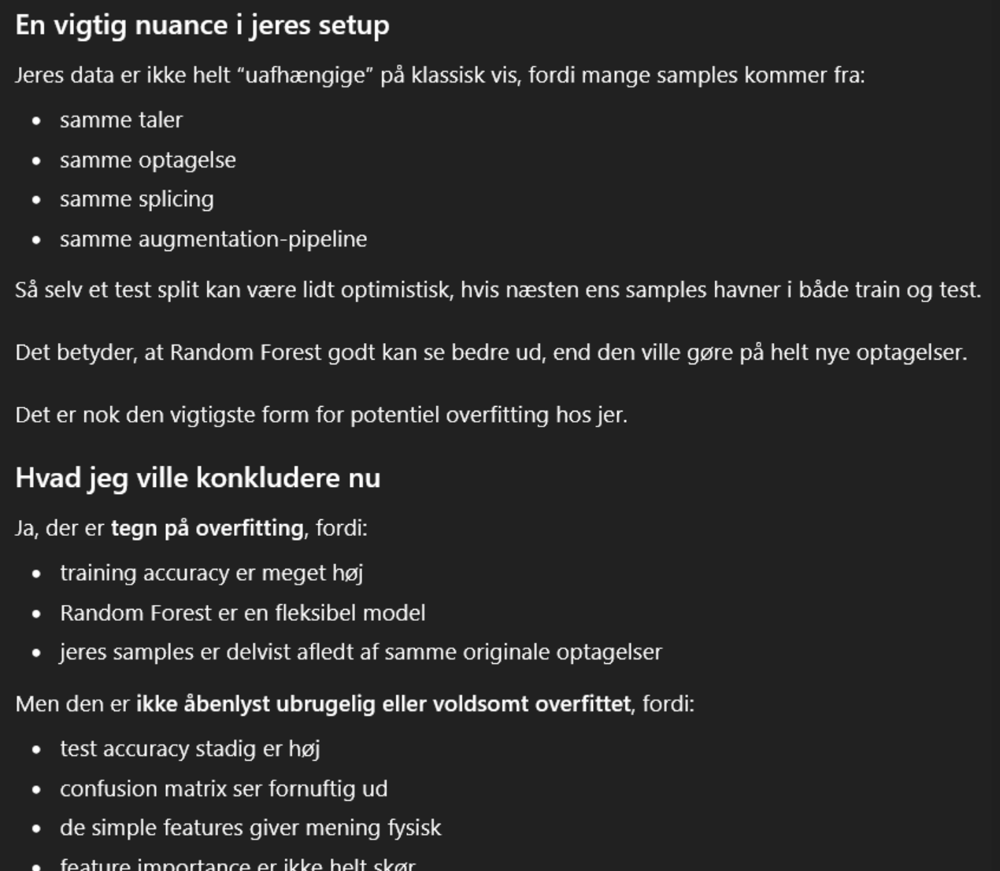

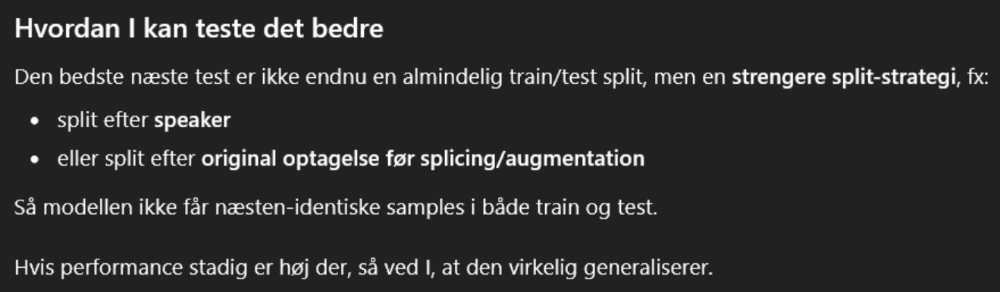

Så der ligger noget analyse i om at vælge en god classifier. Et godt udgangspunkt vil være at følge:
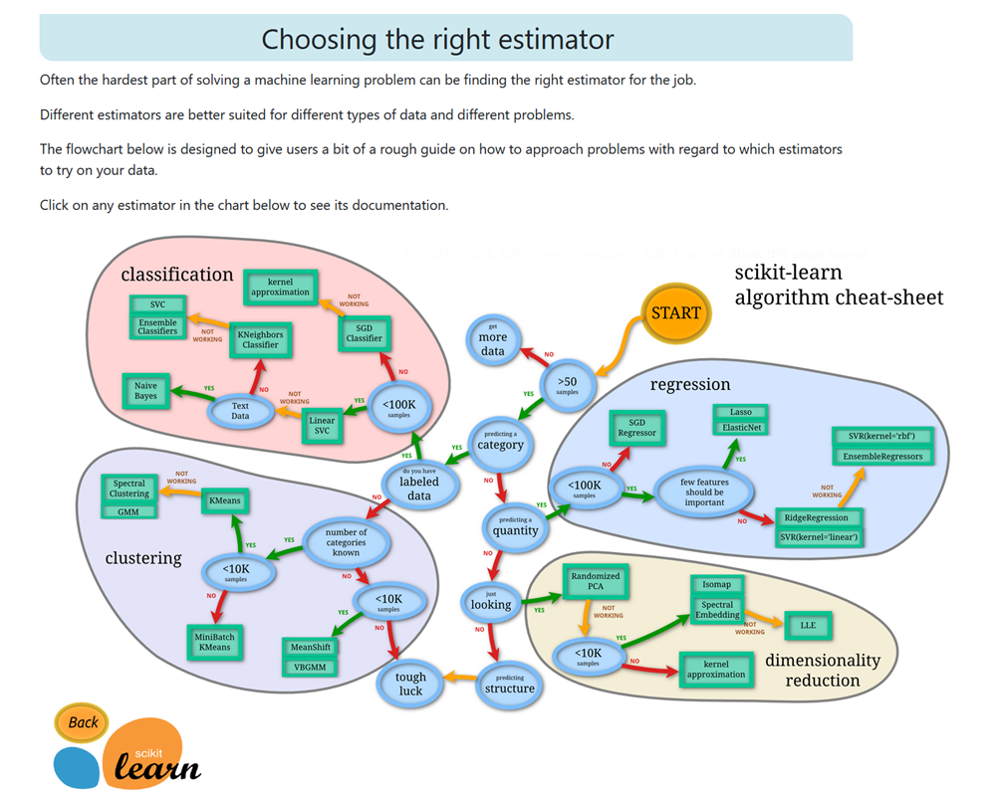

Hvor at vores randomforrest hører under ensemble classifiers. 
Problemet er at ved øjekast ligner det at Random Forrest modellen godt kan overfitte en smule, pga. at generaliserings gap'et mellem training og validation er lige ved at vippe væk fra hinanden. Derfor vil det også være interressant at sammenligne andre modeller som der har mindre kapacitet end Random Forest, men for at se om man kan slippe afsted med mindre kapacitet, SAMT SE OM HVORDAN DET PÅVIRKER ACCURACY SCOREN. 
DET VIL ESSENTIELT SIGE AT VI SKAL KOMBINERE TESTEN MELLEM FORSKELLIGE MODELLER, SAMT TESTE DE ENKELTE MODELLER MED SIMPLE FEATURES ONLY, MFCC ONLY OG KOMBINATION AF SIMPLE OG MFCC FEATURES:

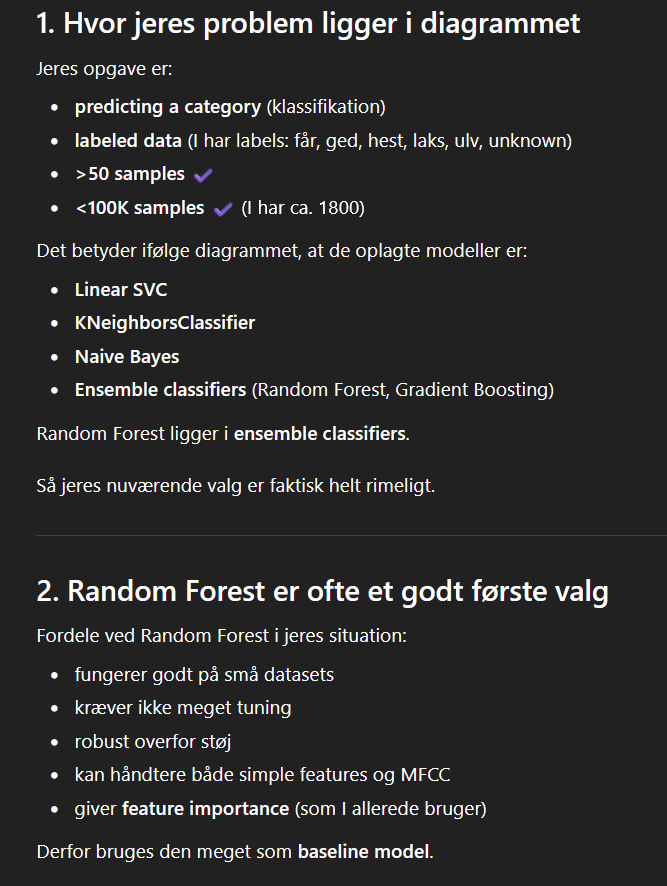

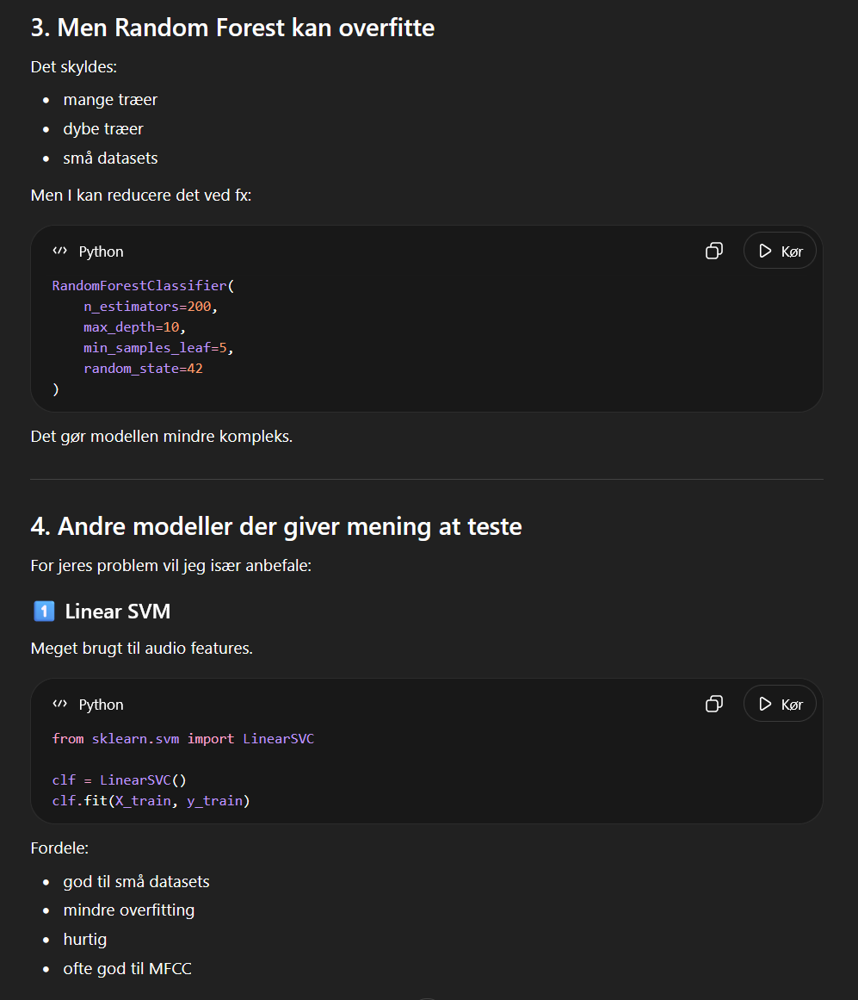

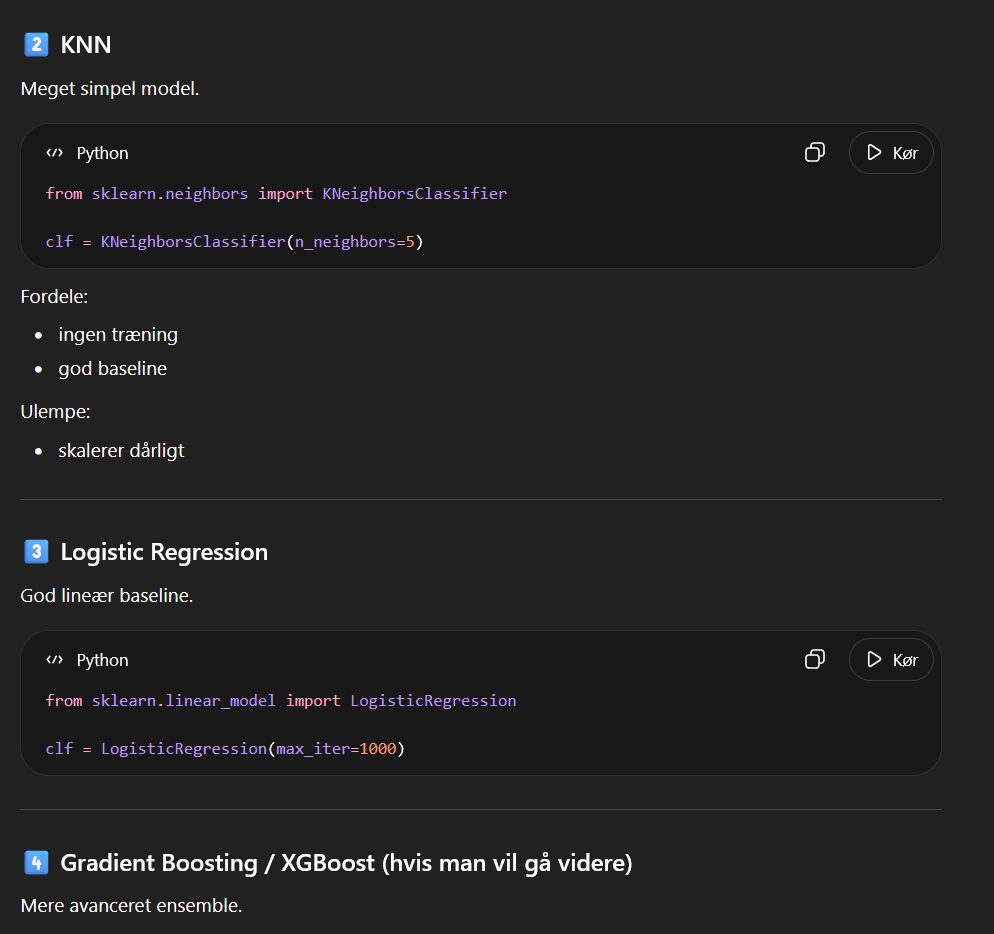

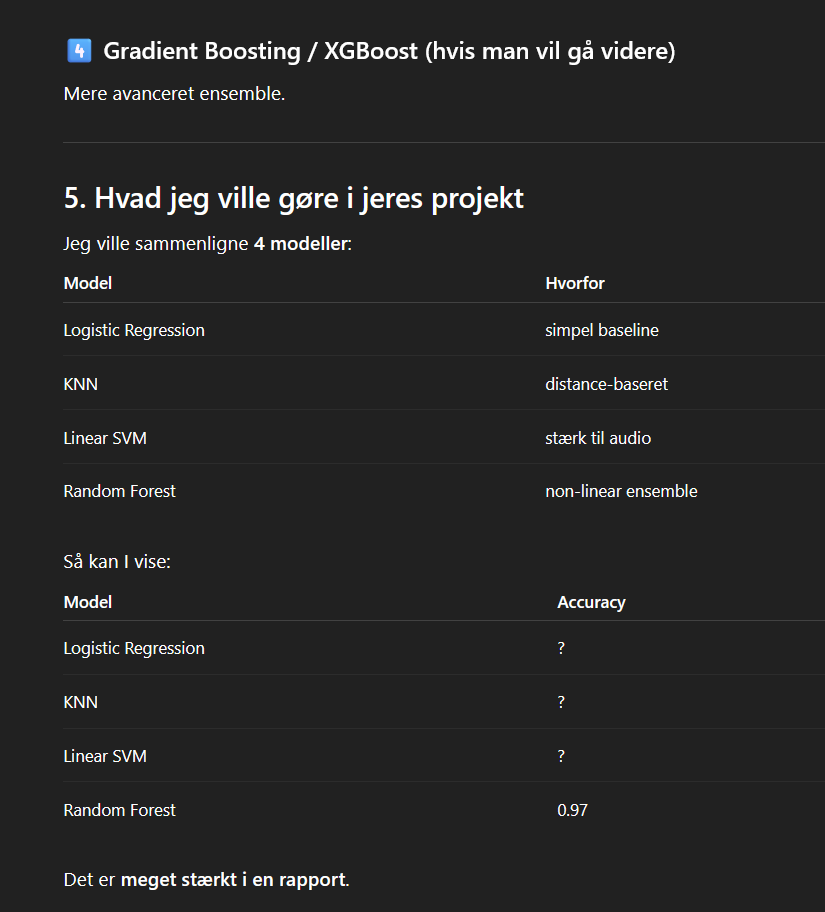

# Endnu en test; Forskellige SNR niveauer af baggrundsstøj (styres mellem 0 og 1 i curation scriptet)

Vi bør også holde øje med om vores model overfitter, pga. manglende preprocessing og scaling. Derfor bør vi have det i overvejelserne, når vi tester forskellige modeller. Samt kan vi opstille pipelines, når vi skal lave scaling

Nedenstående screenshot beskriver faktisk at vi bør lave scaling, fordi at flere af vores features har forskellige størrelsesordener: 
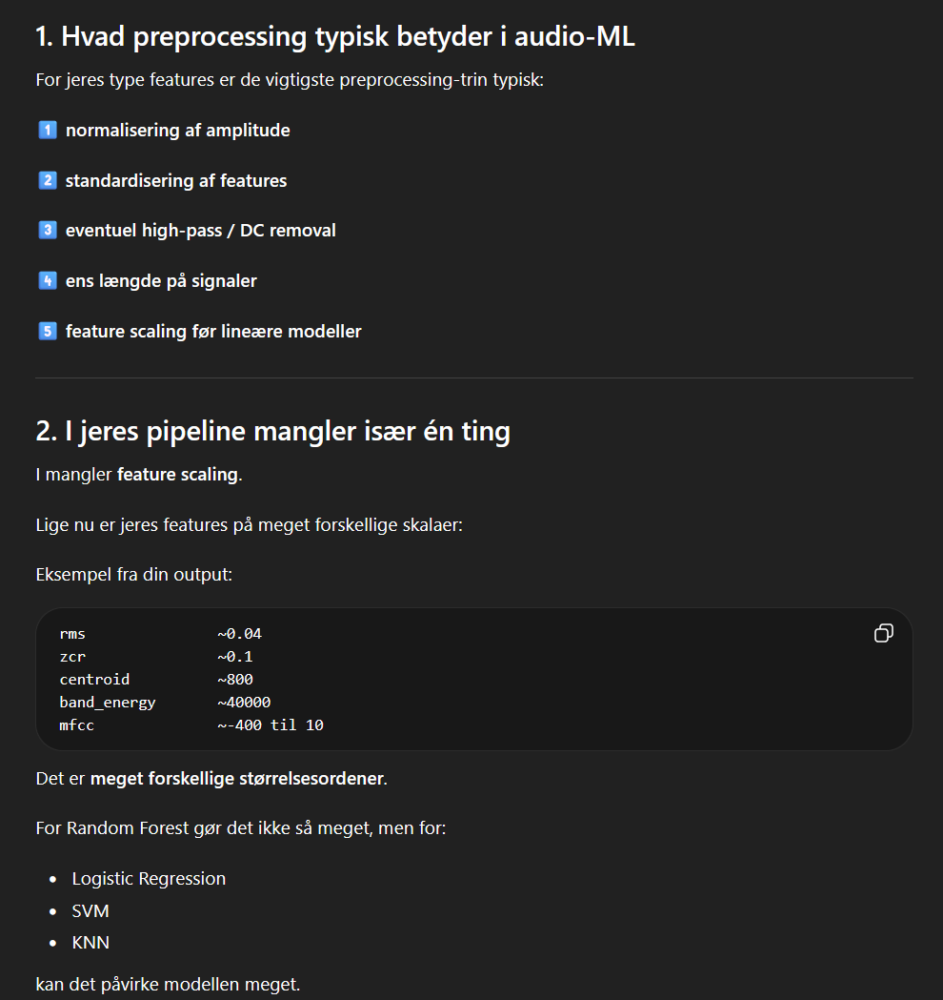

Hertil kan vi bruge Pipelines som vi har lært om i MAL, sammen med vores classifiers, som vi vil teste

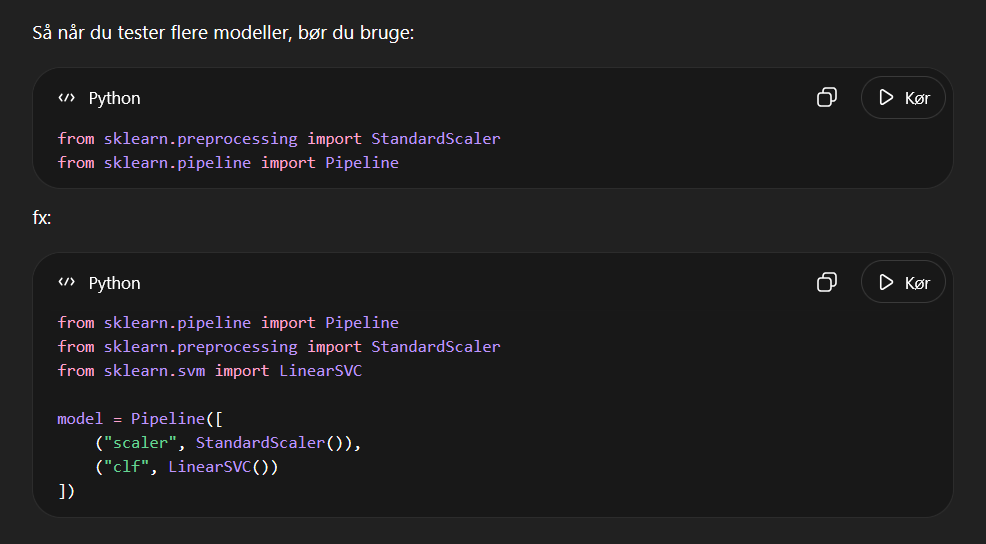

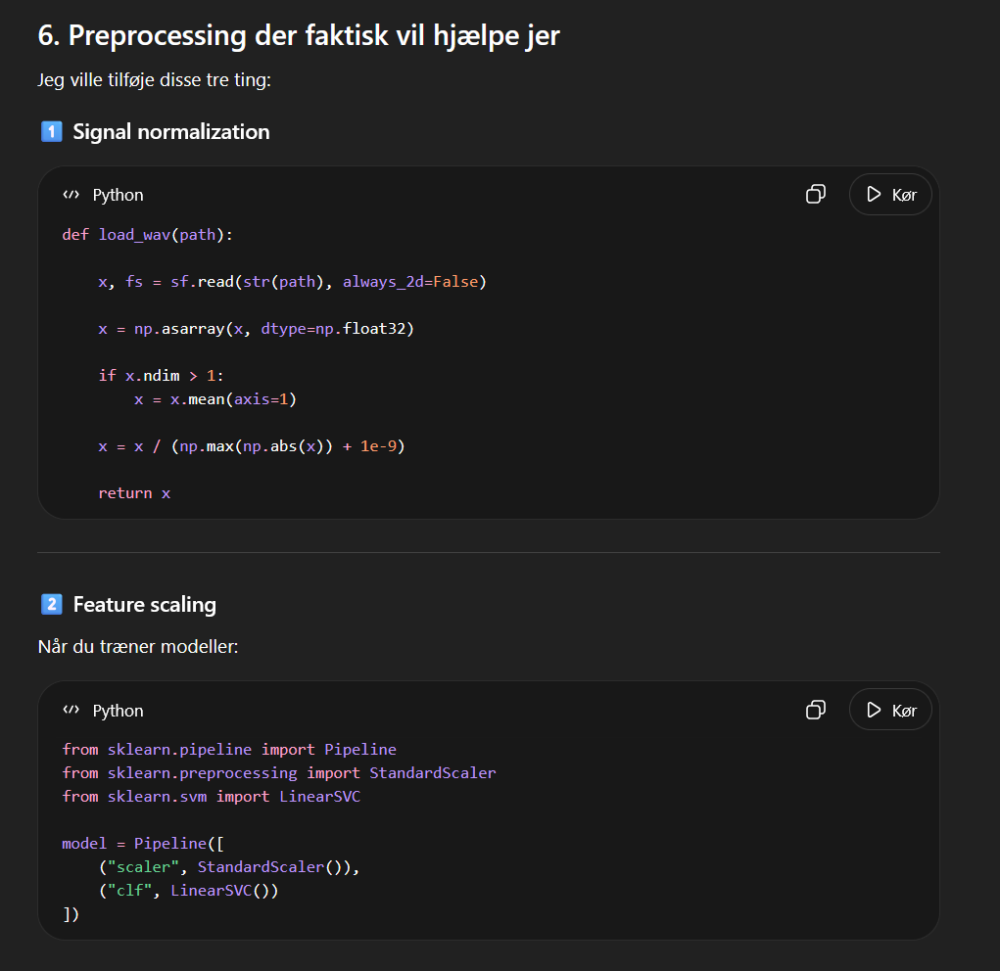

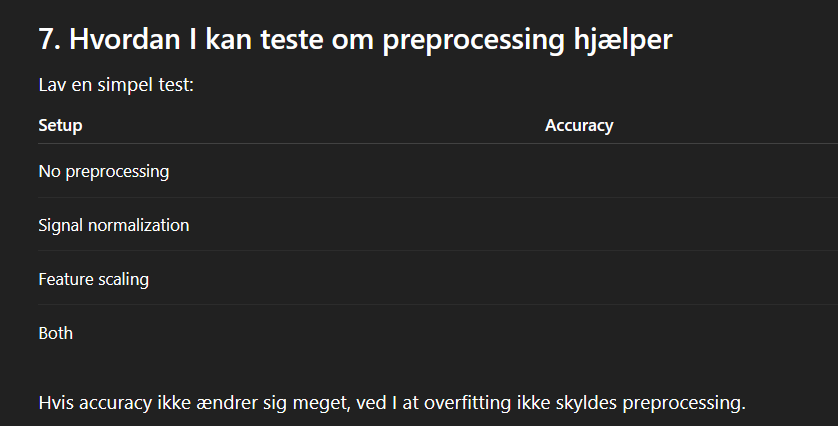

# Som endelig test-split; 

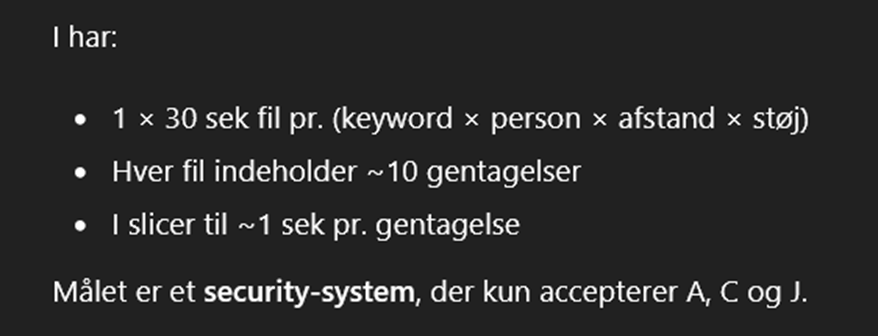

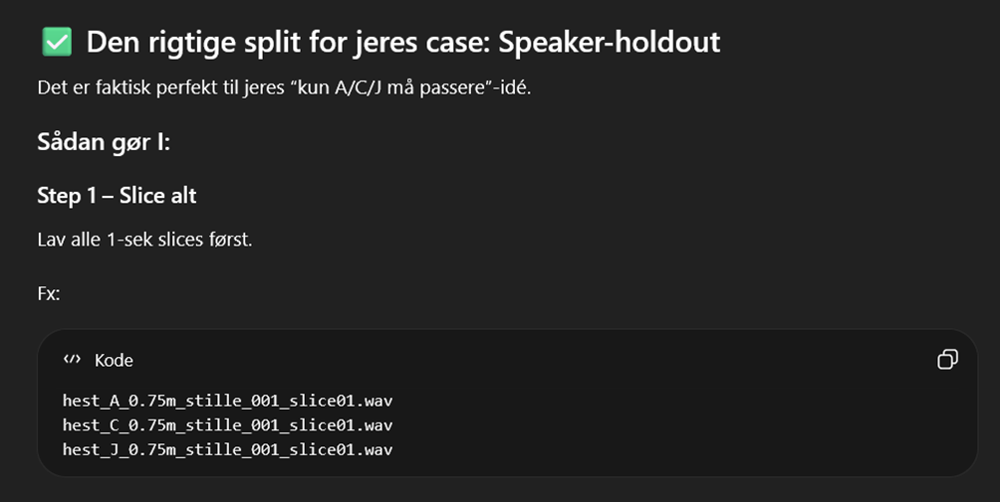

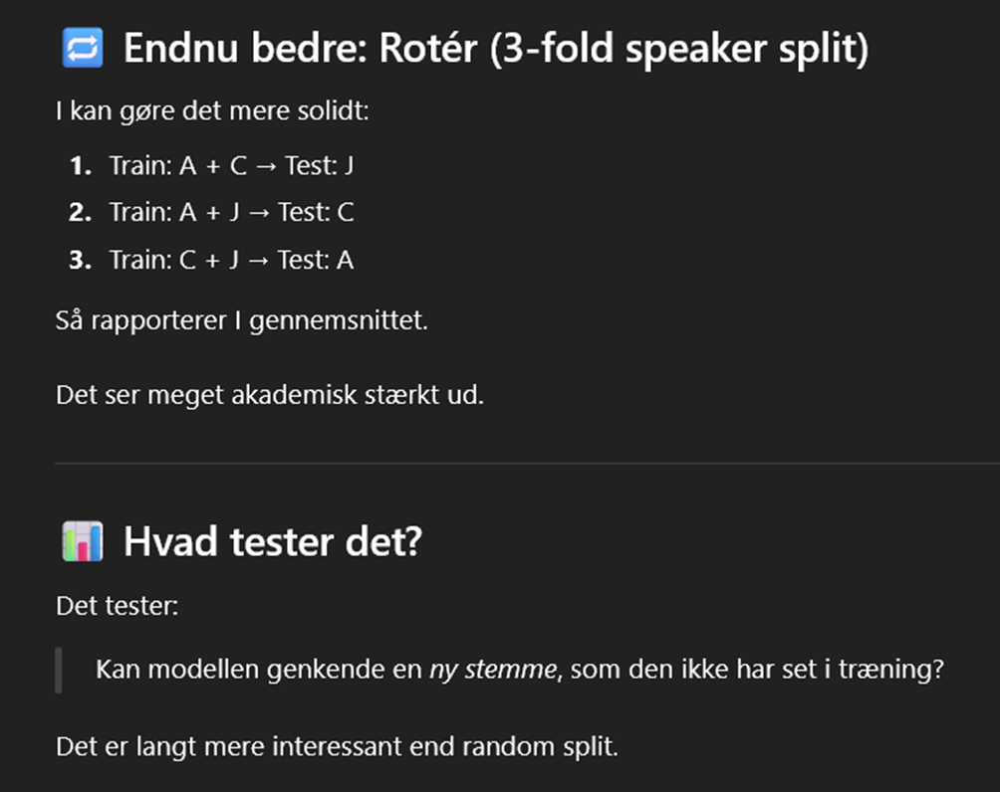

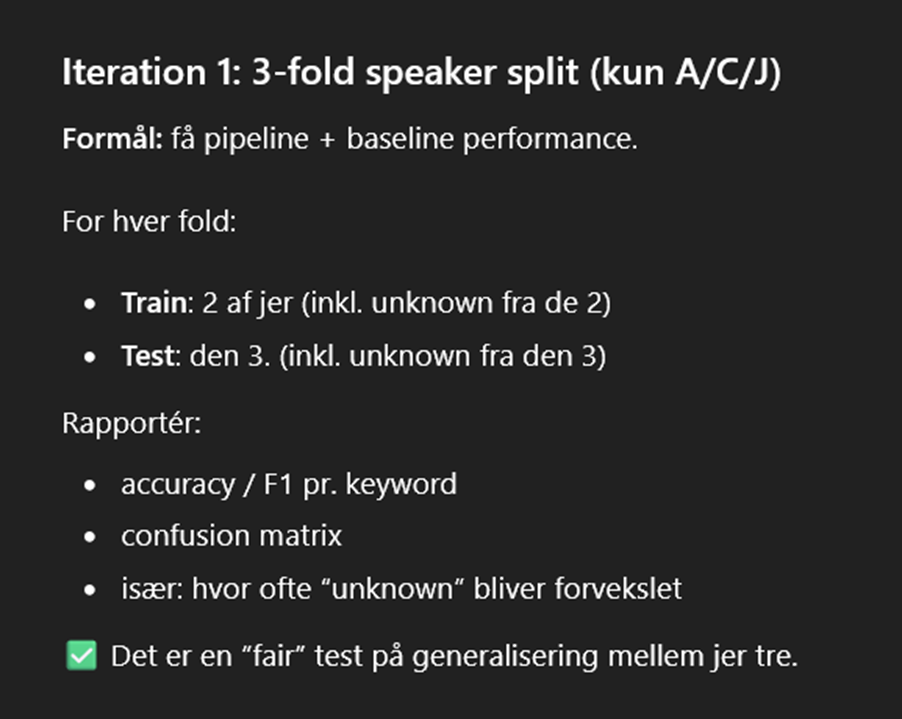

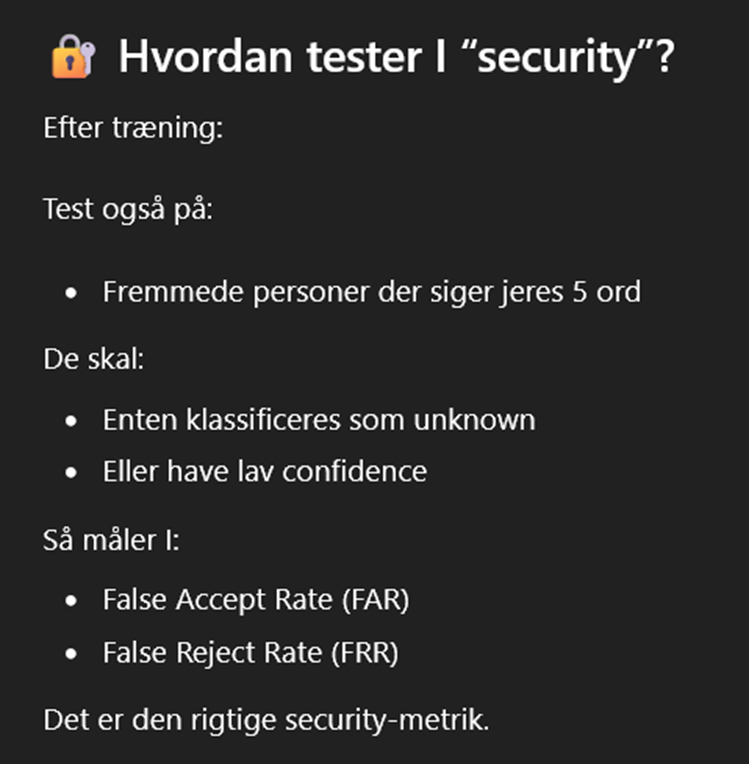

ELLER MÅSKE I STEDET MED EN ANDEN ACCENT I STEDET FOR ANDRE PERSONER, FORDI DET KAN VÆRE FOR BESVÆRLIGT. 

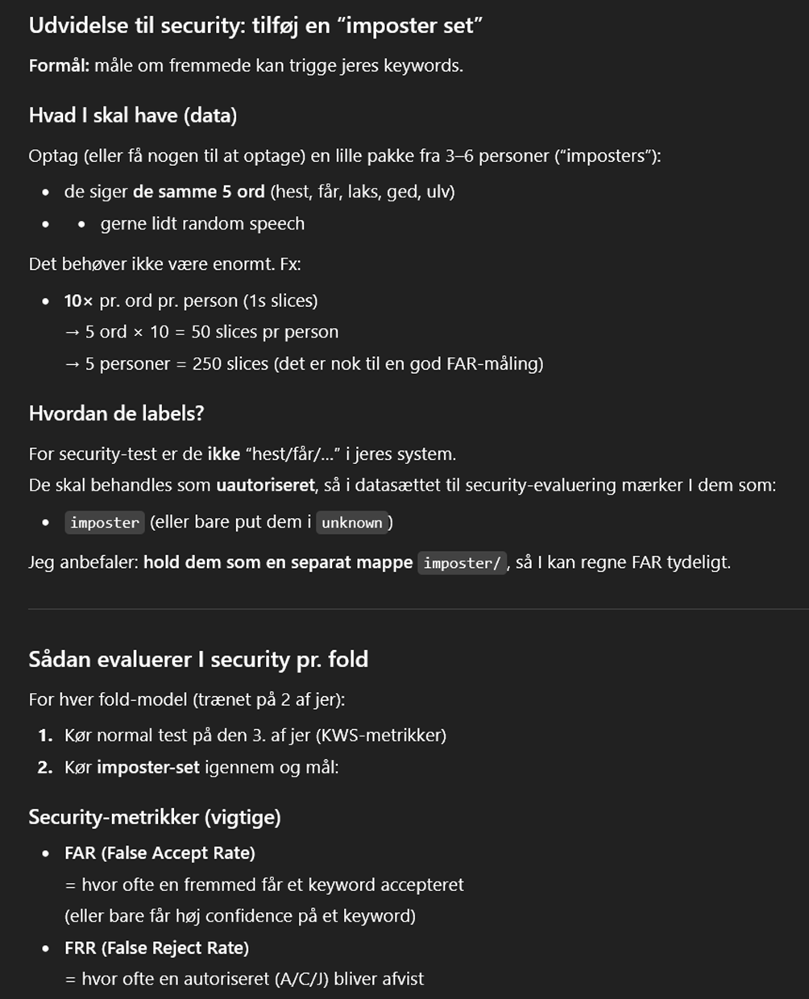


DERUDOVER HAR VI OGSÅ ANDRE TEST-SPLITS VI KAN LAVE: 
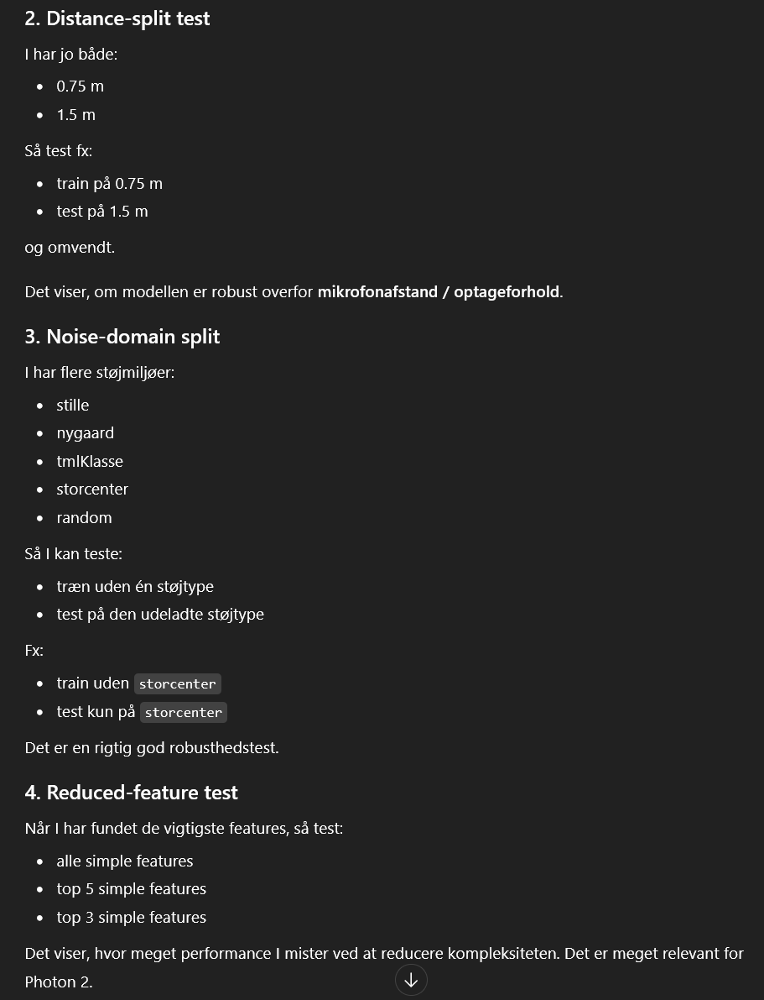

Train shape: (1800, 24)
Test shape: (126, 24)
Test-on-new-recordings accuracy: 0.5238095238095238
              precision    recall  f1-score   support

         får       1.00      0.25      0.40        20
         ged       0.00      0.00      0.00         7
        hest       0.00      0.00      0.00        11
        laks       1.00      0.06      0.12        16
         ulv       0.00      0.00      0.00        12
     unknown       0.50      1.00      0.67        60

    accuracy                           0.52       126
   macro avg       0.42      0.22      0.20       126
weighted avg       0.52      0.52      0.40       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


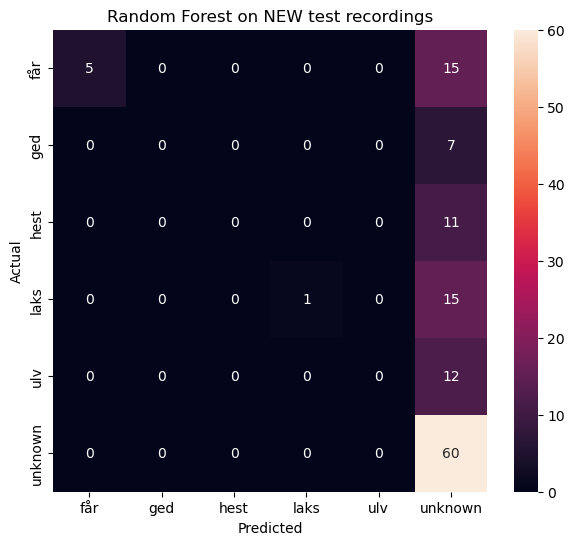

In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("keywords_augmented")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")

TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# FEATURE SETS
# =========================
simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]

mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]
all_features = simple_features + mfcc_feature_cols

# vælg features her
feature_cols = all_features
# feature_cols = simple_features
# feature_cols = mfcc_feature_cols

# =========================
# BUILD TRAIN FEATURE DATAFRAME
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    record["filename"] = wav_path.name
    train_records.append(record)

train_df = pd.DataFrame(train_records)

# =========================
# BUILD TEST FEATURE DATAFRAME
# =========================
test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        test_records.append(record)

test_df = pd.DataFrame(test_records)

print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)

# =========================
# TRAIN ON TRAIN SET
# =========================
X_train = train_df[feature_cols]
y_train = train_df["activity"]

X_test = test_df[feature_cols]
y_test = test_df["activity"]

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# =========================
# EVALUATE ON NEW RECORDINGS
# =========================
print("Test-on-new-recordings accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, labels=ALL_LABELS))

cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=ALL_LABELS,
    yticklabels=ALL_LABELS
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest on NEW test recordings")
plt.show()

## BEMÆRK, AT TEST DATASÆTTET ER BASERET PÅ 126 SAMPLES, SOM VI HURTIGT OPTOG I TinyML KLASSELOKALET. 

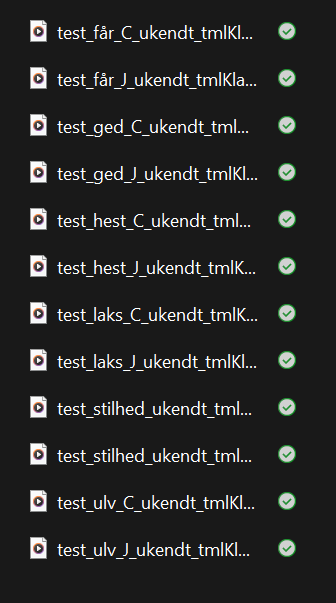

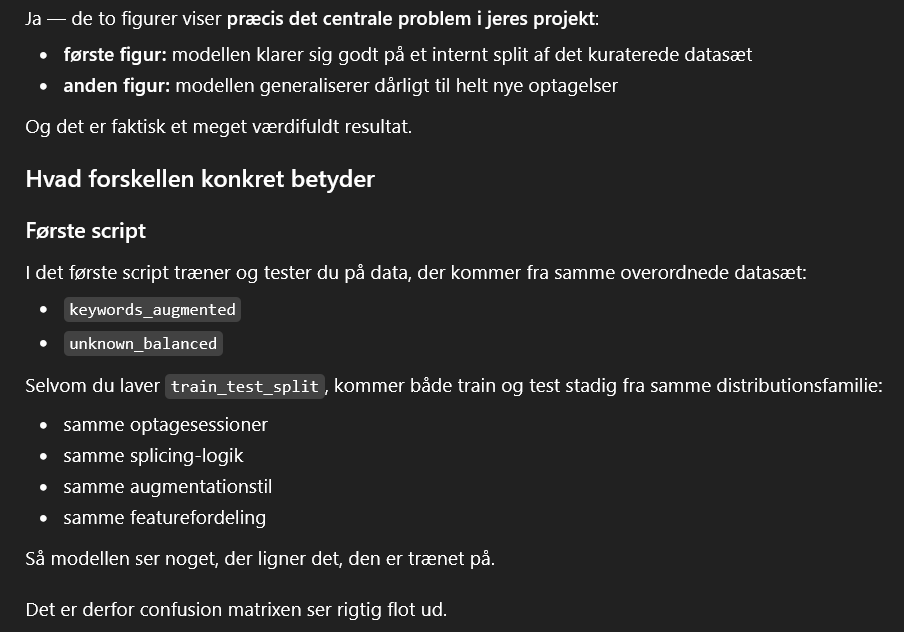

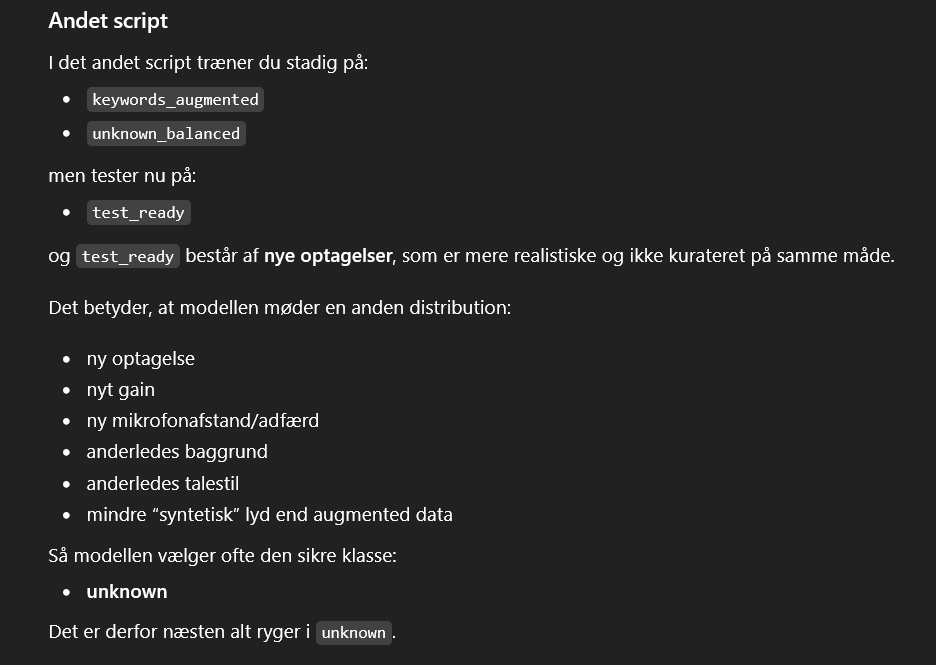

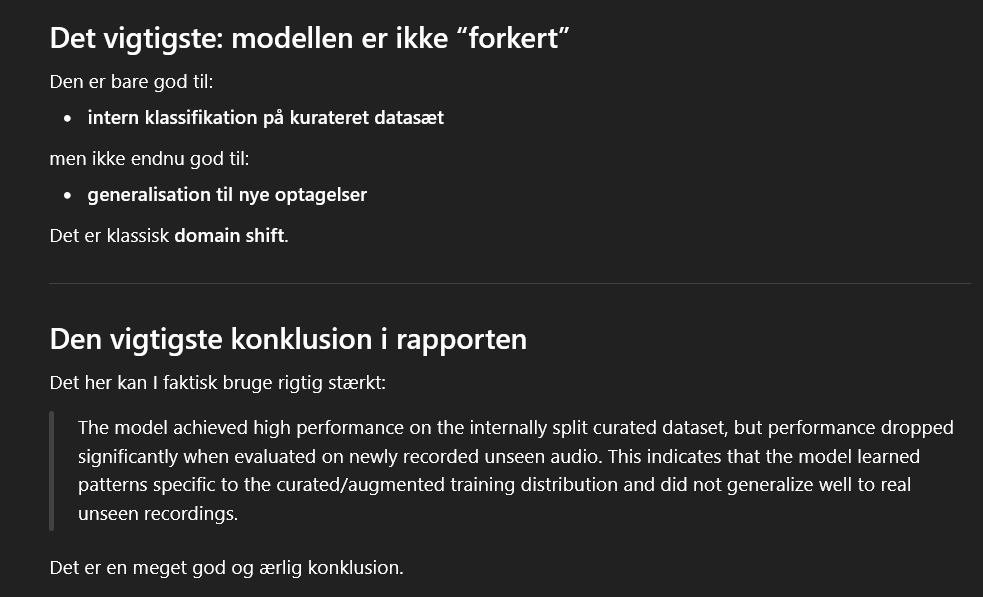

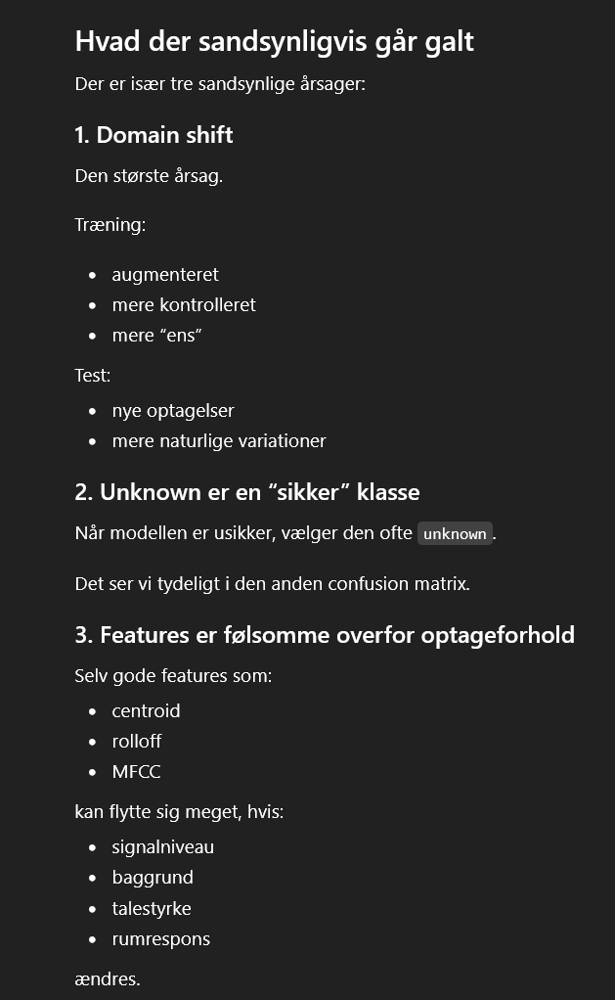

HVAD VI BØR GØRE FOR AT FIKSE PROBLEMET

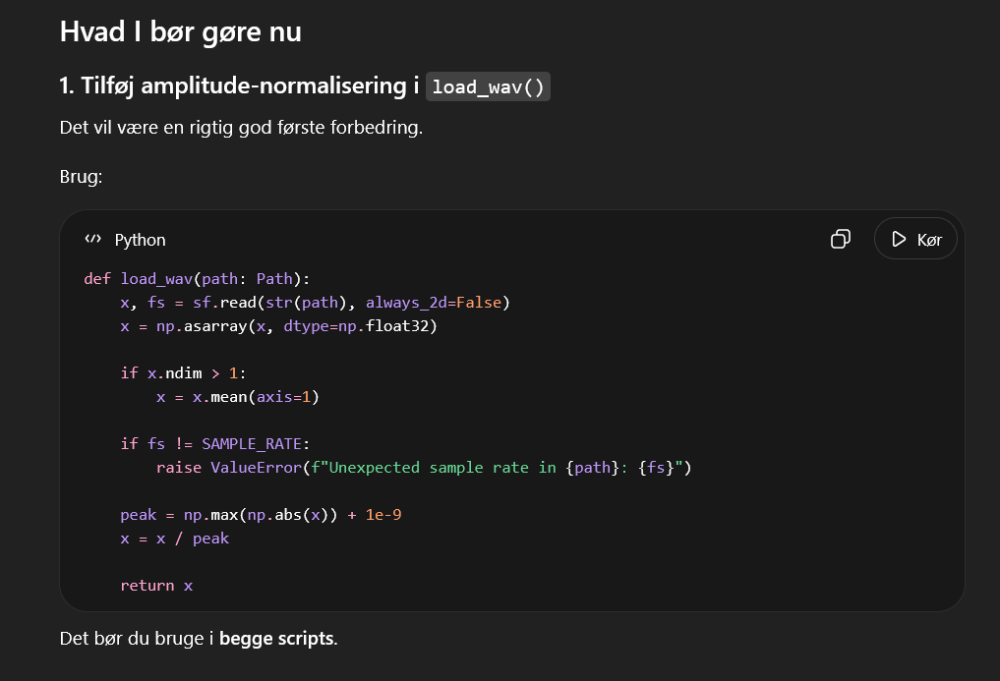

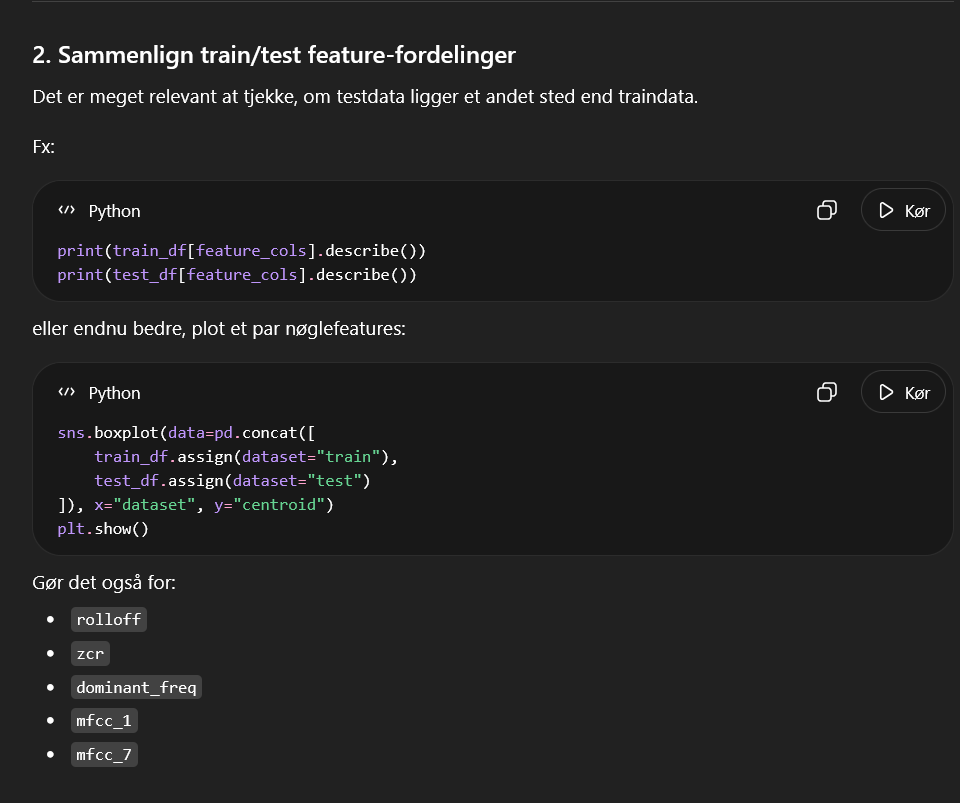

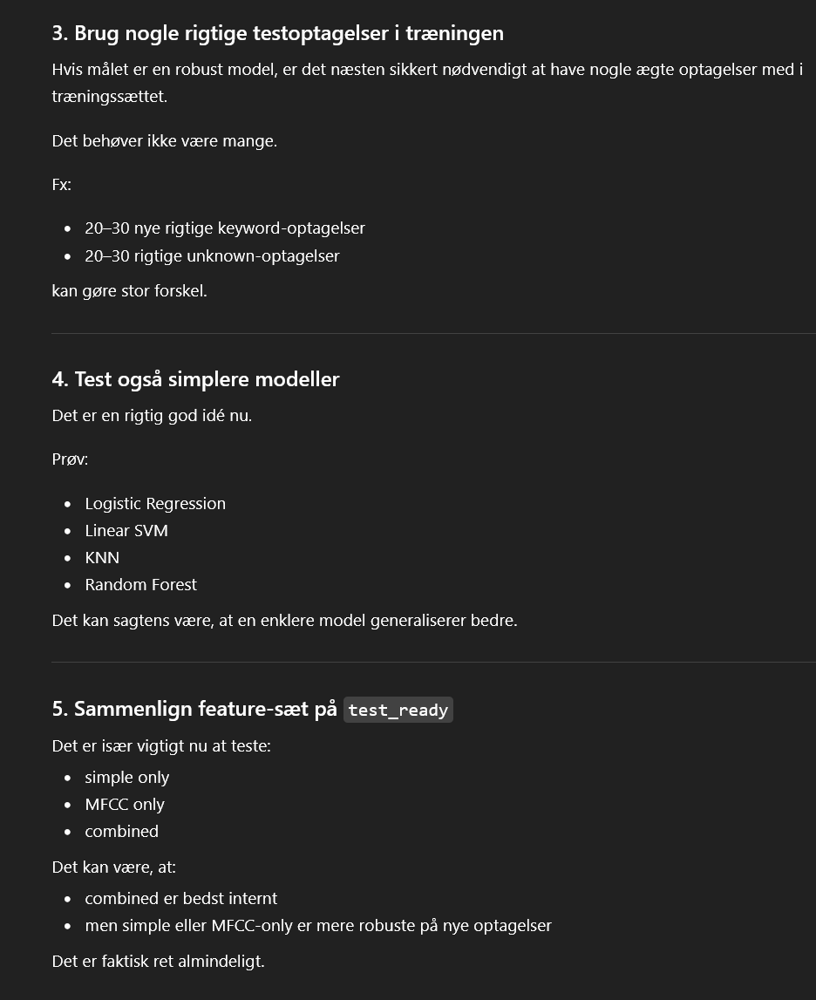

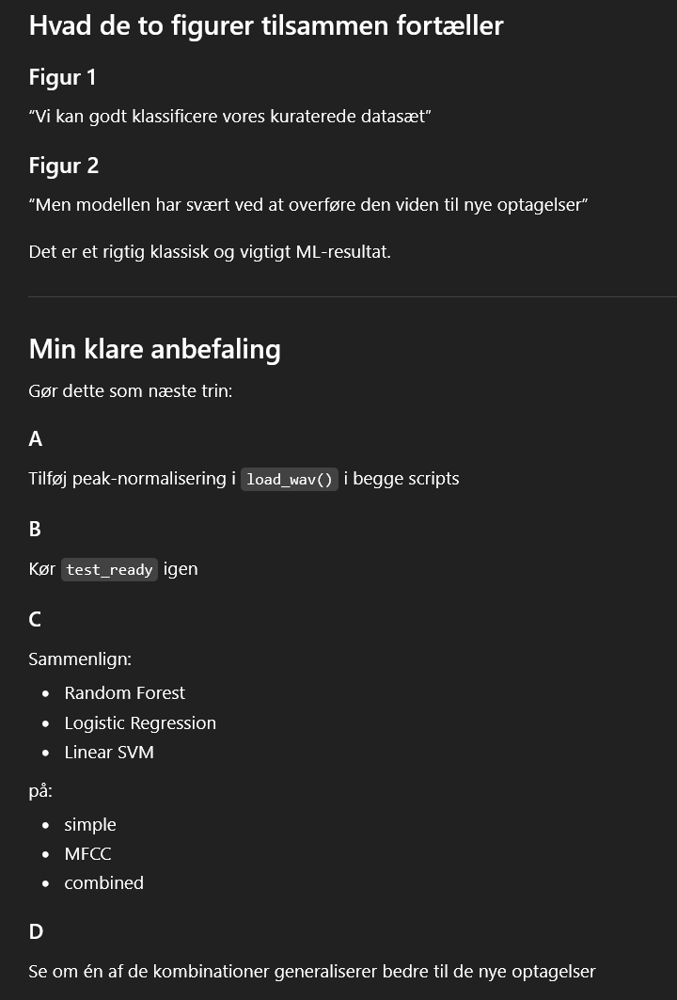

DET HER ER SKIDE GODT, FORDI AT NU DEMONSTRERER VI EN ITERATIV PROCES. 

ALTSÅ, NU KAN VI DOKUMENTERE AT NÅR VI LAVER INTERN EVALUERING AF MODEL (ALTSÅ TRAIN/TEST SPLIT ER FRA SAMME DATA + CURATION), SÅ LÆRERER MODELLEN ALT EFTER VORES SPLICING + BESTEMTE SNR NIVEAU, MM. 

MEN MODELLEN ER DÅRLIG TIL AT GENERALISERER FOR RIGTIG LYD, HVILKET SKYLDES DE IKKE RIGTIGE ARTIFAKTER, SOM DER KOMMER NÅR VI LAVER DATA CURATION FOR 2/3 af vores keywords. 

DERFOR BØR VI FØLGE NEDENSTÅENDE LØSNING:

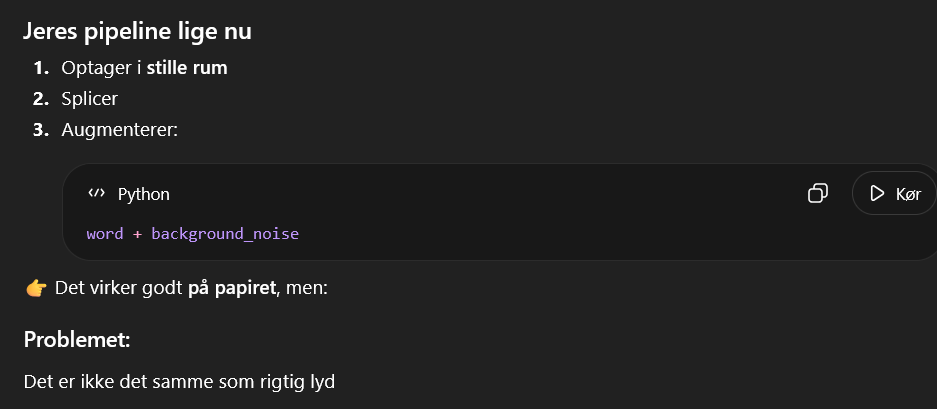

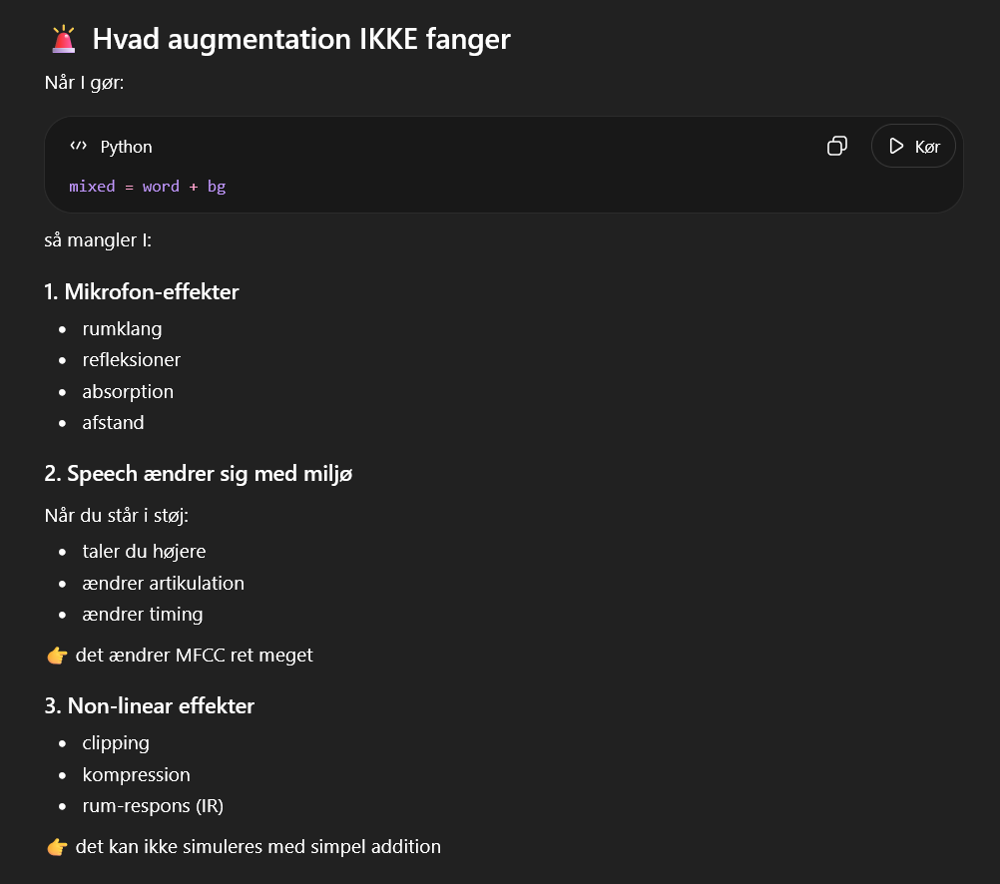

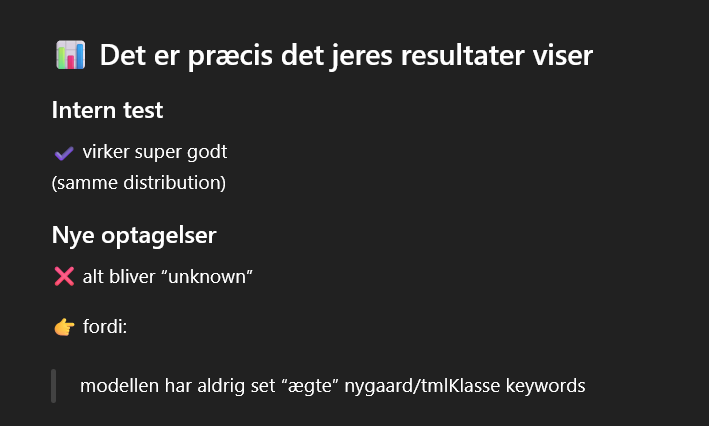

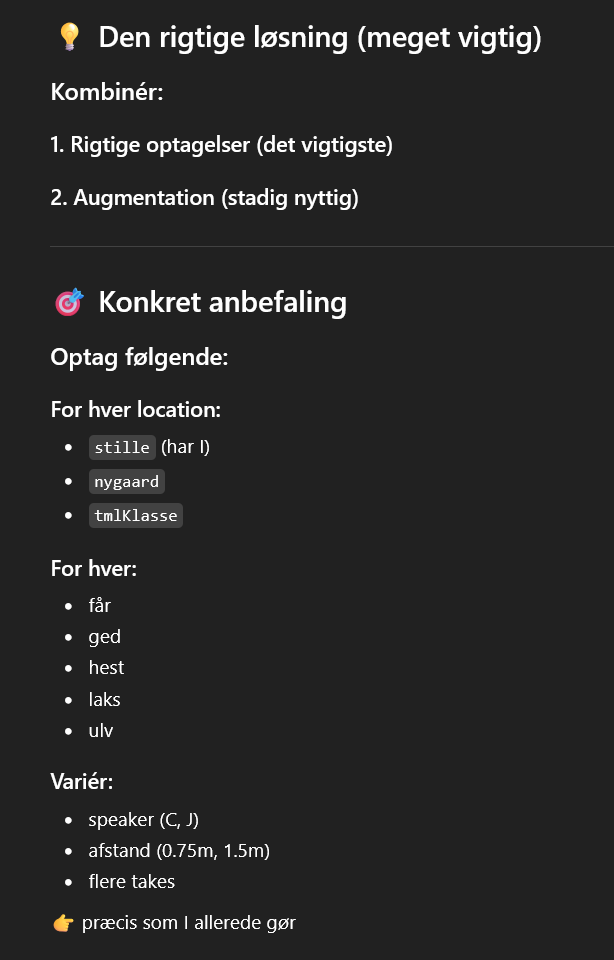

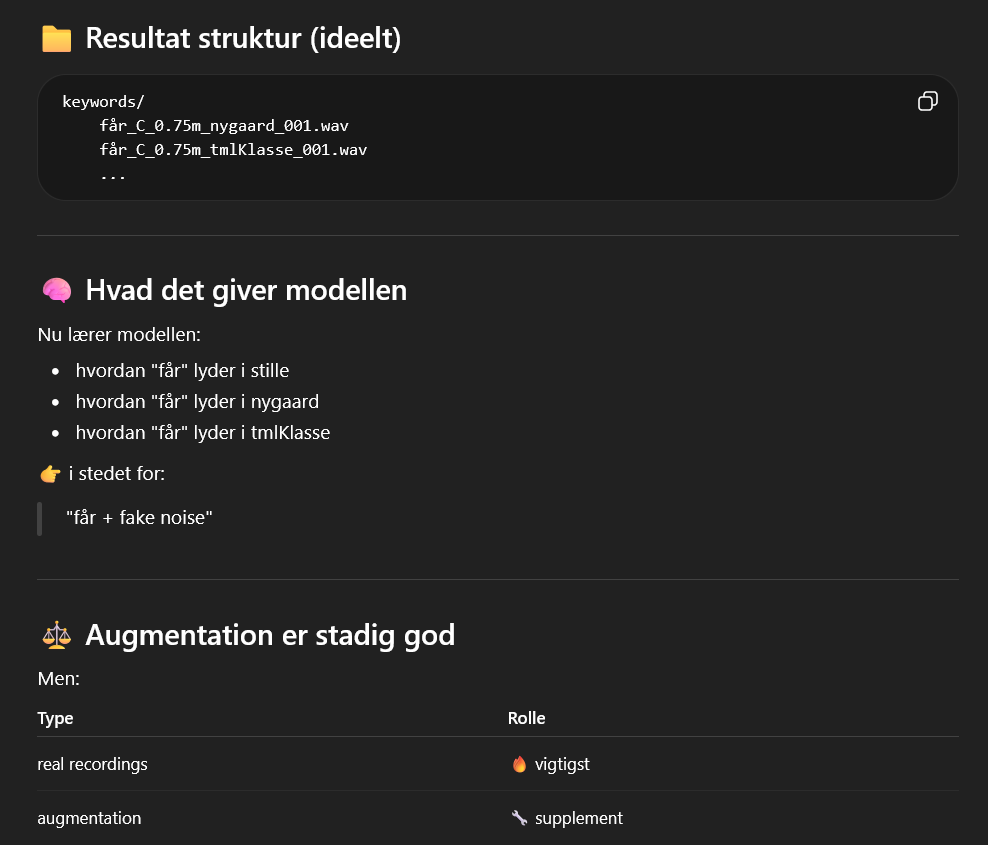

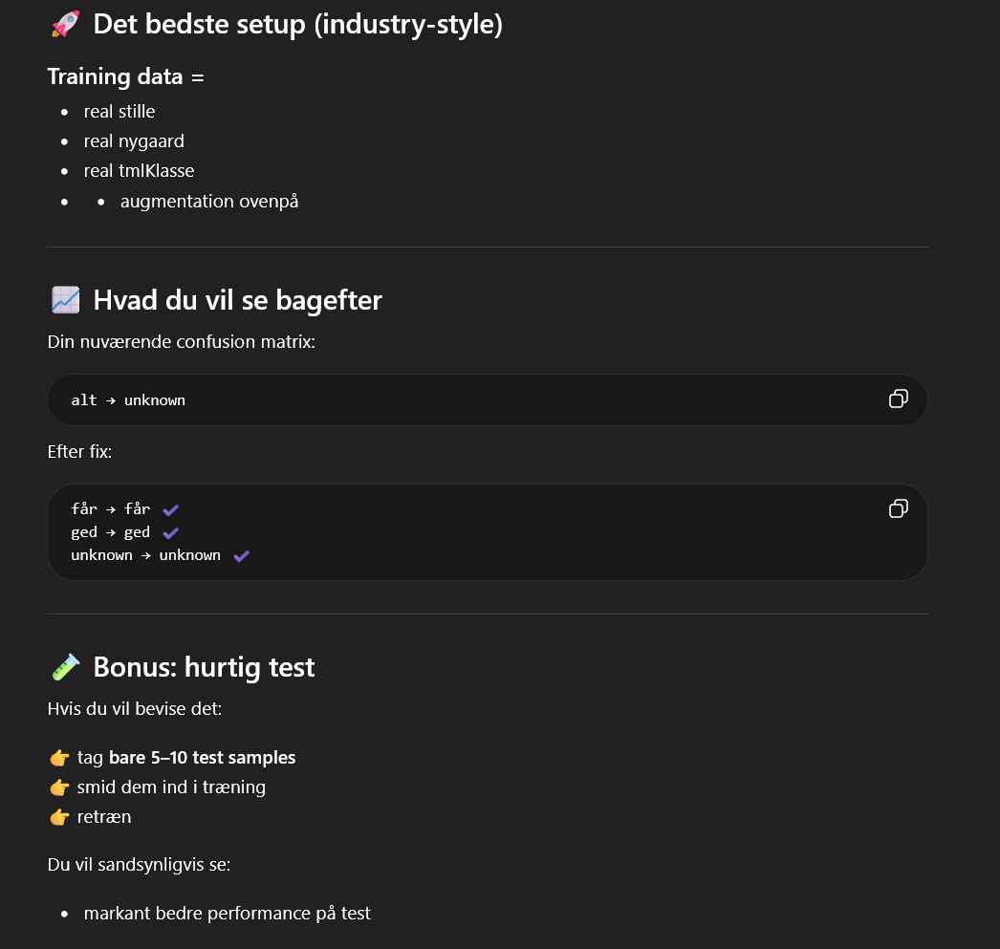

ALTSÅ VI VIL SKIFTE AUGMENTATION STRATEGI, TIL AT TILFØJE MINDRE VARIATIONER I VORES FORSKELLIGE MILJØER

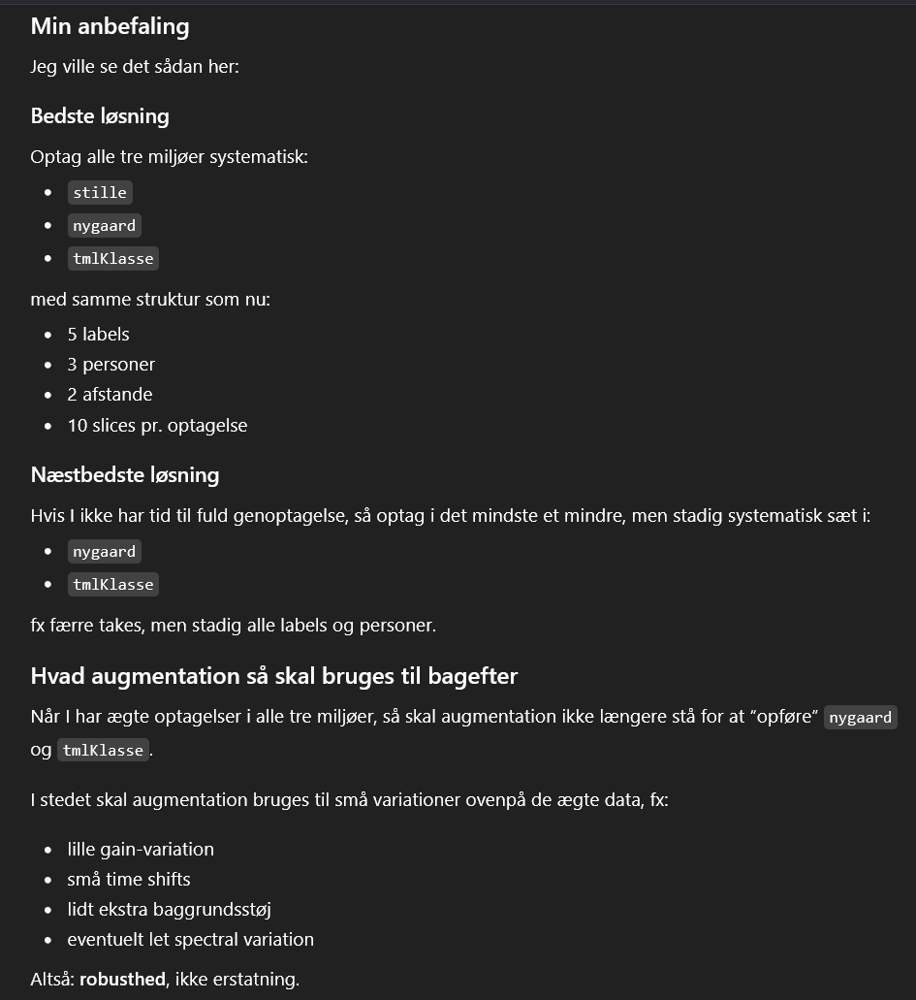

MEN PRØV FØRST AT GØR DET MAN KAN GØRE I PYTHON, FOR AT SE OM DET ER NOGET VI KAN LØSE UDEN AT SKULLE OPTAGE MERE

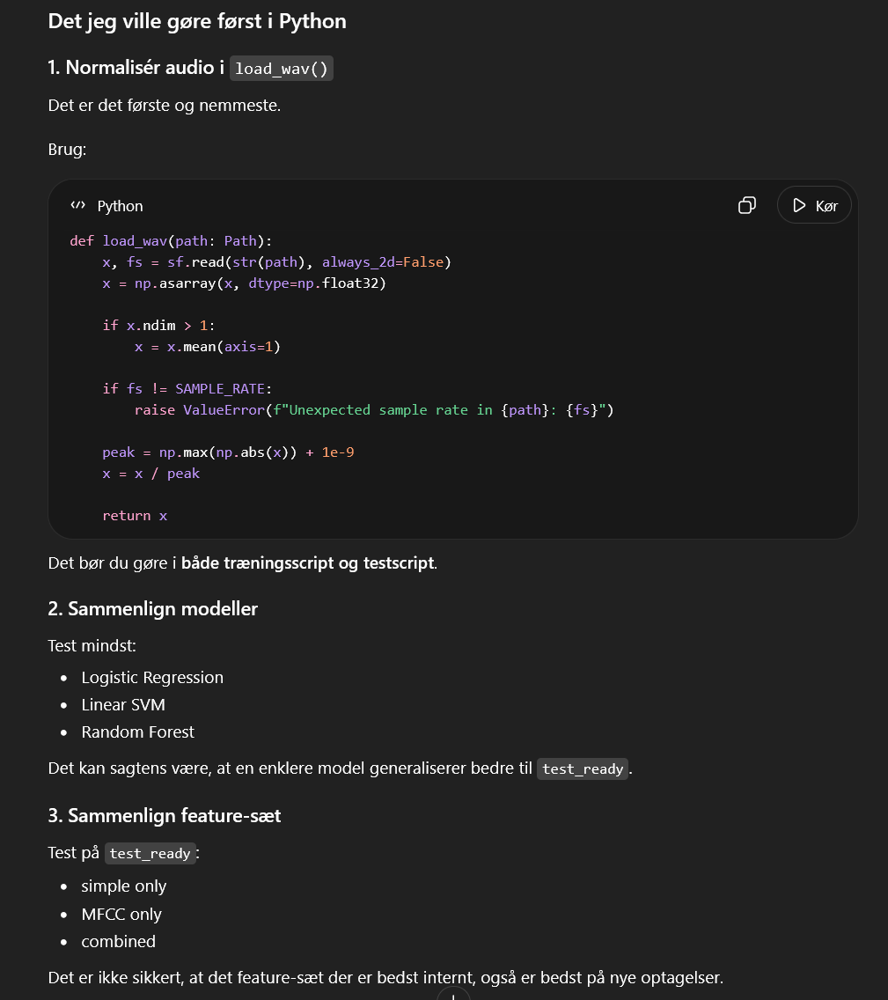

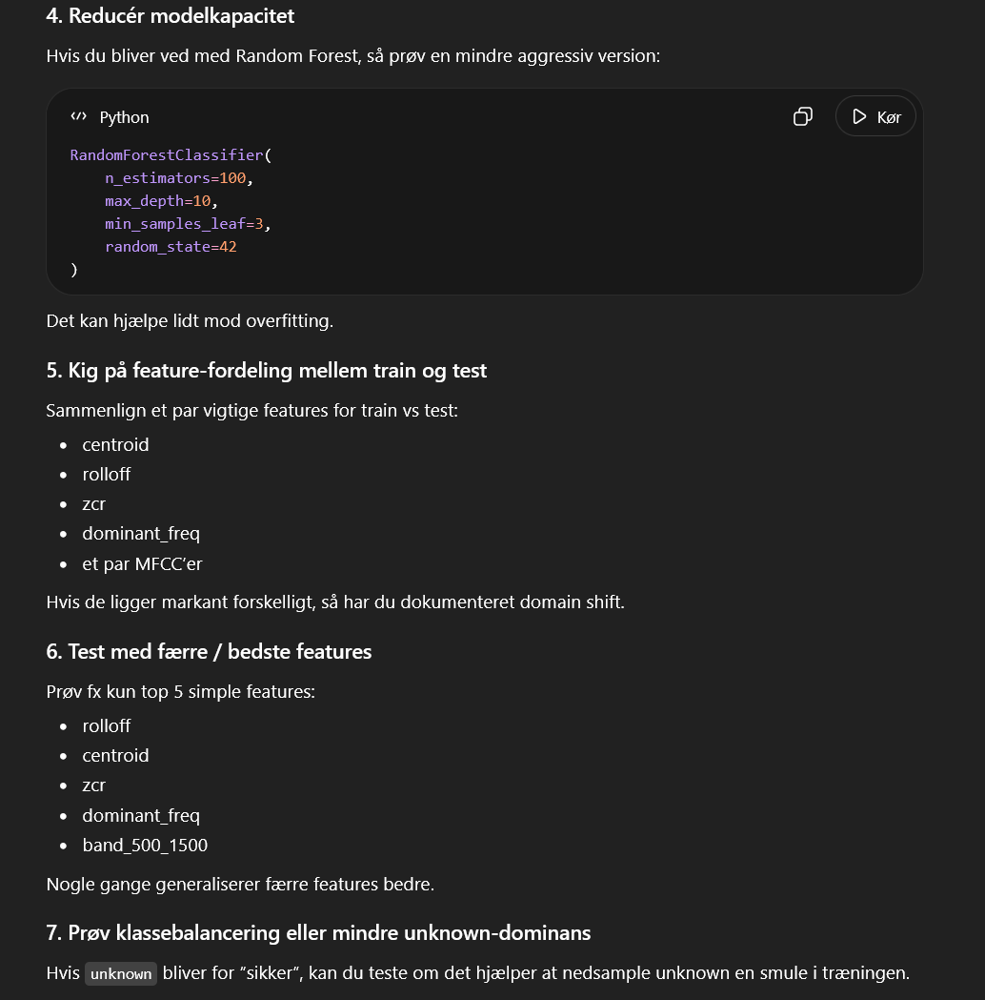

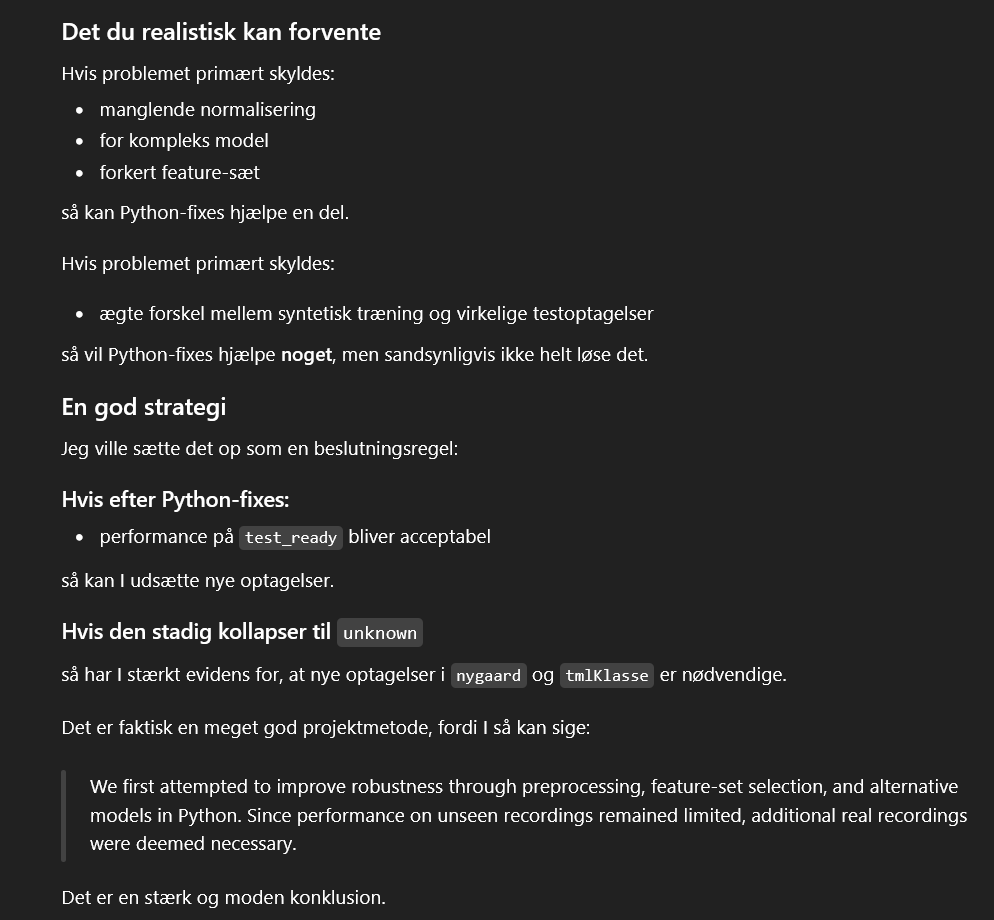

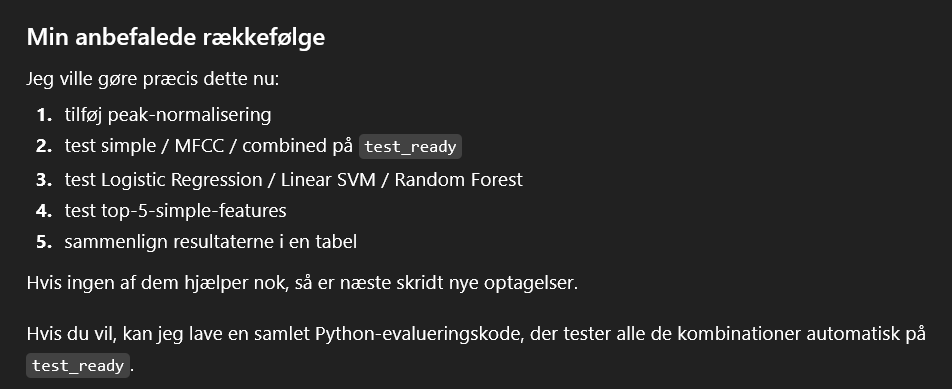

Train shape: (1800, 24)
Test shape: (126, 24)
Test-on-new-recordings accuracy: 0.6111111111111112
              precision    recall  f1-score   support

         får       1.00      0.40      0.57        20
         ged       0.00      0.00      0.00         7
        hest       0.67      0.36      0.47        11
        laks       1.00      0.25      0.40        16
         ulv       1.00      0.08      0.15        12
     unknown       0.56      1.00      0.72        60

    accuracy                           0.61       126
   macro avg       0.70      0.35      0.39       126
weighted avg       0.71      0.61      0.54       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


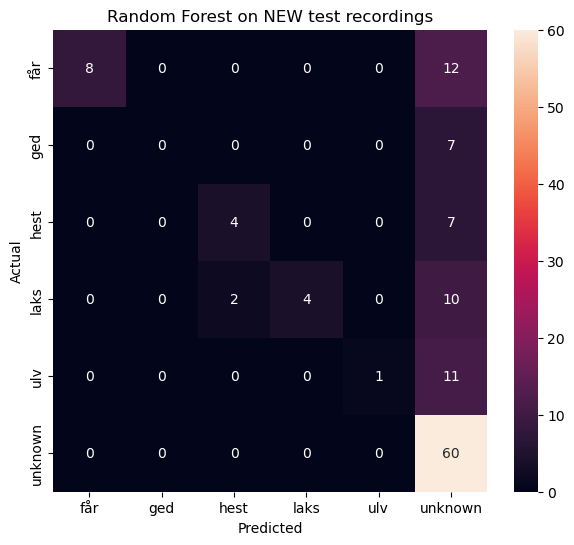

In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("keywords_augmented")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")

TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    # 🔥 NYT: peak-normalisering
    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# FEATURE SETS
# =========================
simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]

mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]
all_features = simple_features + mfcc_feature_cols

# vælg features her
feature_cols = all_features
# feature_cols = simple_features
# feature_cols = mfcc_feature_cols

# =========================
# BUILD TRAIN FEATURE DATAFRAME
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    record["filename"] = wav_path.name
    train_records.append(record)

train_df = pd.DataFrame(train_records)

# =========================
# BUILD TEST FEATURE DATAFRAME
# =========================
test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        test_records.append(record)

test_df = pd.DataFrame(test_records)

print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)

# =========================
# TRAIN ON TRAIN SET
# =========================
from sklearn.preprocessing import StandardScaler

X_train = train_df[feature_cols].values
y_train = train_df["activity"]

X_test = test_df[feature_cols].values
y_test = test_df["activity"]

# 🔥 Fit scaler KUN på train
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)

# 🔥 Brug samme scaler på test
X_test = scaler.transform(X_test)

#clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=3,
    random_state=42
)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# =========================
# EVALUATE ON NEW RECORDINGS
# =========================
print("Test-on-new-recordings accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, labels=ALL_LABELS))

cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=ALL_LABELS,
    yticklabels=ALL_LABELS
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest on NEW test recordings")
plt.show()


Model: LogisticRegression, Features: simple
Accuracy: 0.6190476190476191
              precision    recall  f1-score   support

         får       1.00      0.50      0.67        20
         ged       0.29      0.29      0.29         7
        hest       0.29      0.36      0.32        11
        laks       1.00      0.12      0.22        16
         ulv       1.00      0.08      0.15        12
     unknown       0.64      0.98      0.78        60

    accuracy                           0.62       126
   macro avg       0.70      0.39      0.40       126
weighted avg       0.73      0.62      0.56       126



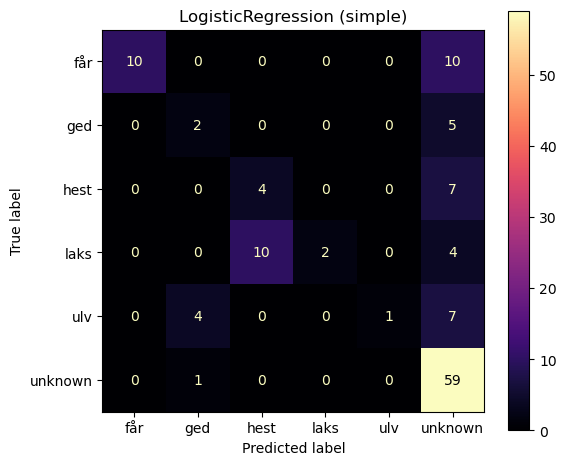


Model: LinearSVM, Features: simple
Accuracy: 0.6031746031746031
              precision    recall  f1-score   support

         får       1.00      0.50      0.67        20
         ged       0.33      0.14      0.20         7
        hest       0.33      0.36      0.35        11
        laks       1.00      0.06      0.12        16
         ulv       1.00      0.08      0.15        12
     unknown       0.60      0.98      0.74        60

    accuracy                           0.60       126
   macro avg       0.71      0.36      0.37       126
weighted avg       0.71      0.60      0.53       126



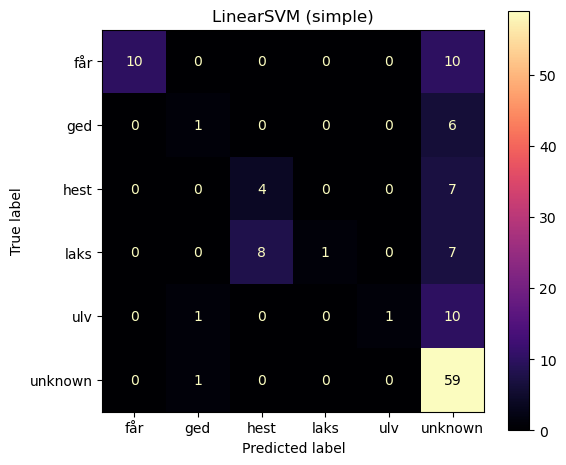


Model: RandomForest, Features: simple
Accuracy: 0.6428571428571429
              precision    recall  f1-score   support

         får       1.00      0.30      0.46        20
         ged       1.00      0.14      0.25         7
        hest       0.44      0.36      0.40        11
        laks       0.89      0.50      0.64        16
         ulv       1.00      0.17      0.29        12
     unknown       0.61      1.00      0.75        60

    accuracy                           0.64       126
   macro avg       0.82      0.41      0.47       126
weighted avg       0.75      0.64      0.59       126



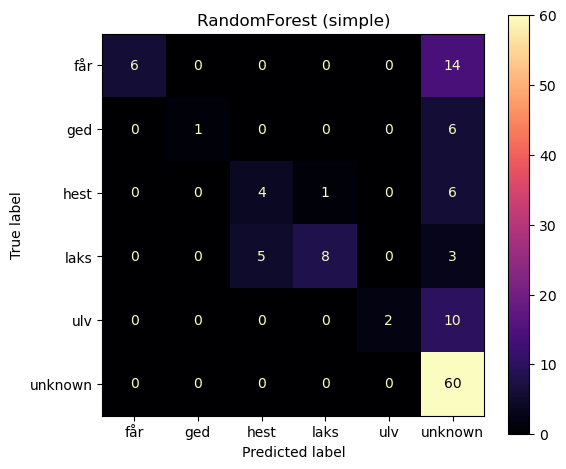


Model: LogisticRegression, Features: mfcc
Accuracy: 0.48412698412698413
              precision    recall  f1-score   support

         får       0.75      0.15      0.25        20
         ged       0.00      0.00      0.00         7
        hest       0.00      0.00      0.00        11
        laks       0.00      0.00      0.00        16
         ulv       0.00      0.00      0.00        12
     unknown       0.52      0.97      0.68        60

    accuracy                           0.48       126
   macro avg       0.21      0.19      0.15       126
weighted avg       0.37      0.48      0.36       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


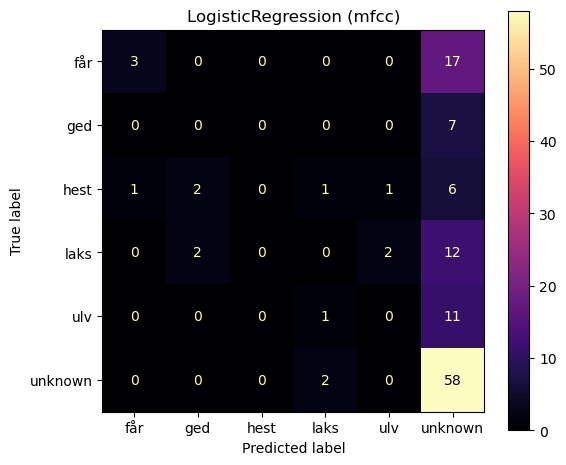


Model: LinearSVM, Features: mfcc
Accuracy: 0.49206349206349204
              precision    recall  f1-score   support

         får       0.75      0.15      0.25        20
         ged       0.00      0.00      0.00         7
        hest       0.00      0.00      0.00        11
        laks       0.25      0.12      0.17        16
         ulv       0.00      0.00      0.00        12
     unknown       0.52      0.95      0.67        60

    accuracy                           0.49       126
   macro avg       0.25      0.20      0.18       126
weighted avg       0.40      0.49      0.38       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


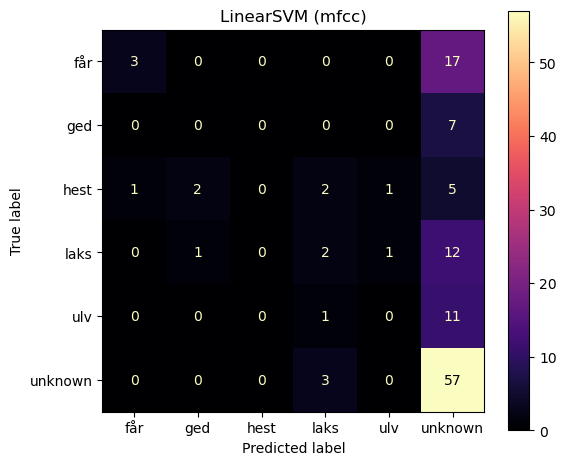


Model: RandomForest, Features: mfcc
Accuracy: 0.5079365079365079
              precision    recall  f1-score   support

         får       1.00      0.20      0.33        20
         ged       0.00      0.00      0.00         7
        hest       0.00      0.00      0.00        11
        laks       0.00      0.00      0.00        16
         ulv       0.00      0.00      0.00        12
     unknown       0.49      1.00      0.66        60

    accuracy                           0.51       126
   macro avg       0.25      0.20      0.17       126
weighted avg       0.39      0.51      0.37       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


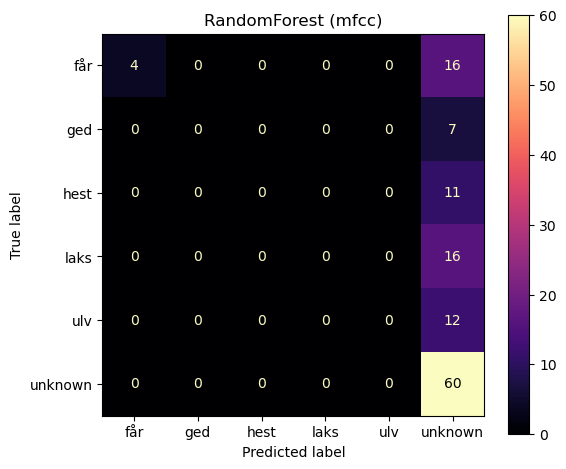


Model: LogisticRegression, Features: combined
Accuracy: 0.5317460317460317
              precision    recall  f1-score   support

         får       1.00      0.15      0.26        20
         ged       0.00      0.00      0.00         7
        hest       0.83      0.45      0.59        11
        laks       0.33      0.06      0.11        16
         ulv       0.00      0.00      0.00        12
     unknown       0.52      0.97      0.67        60

    accuracy                           0.53       126
   macro avg       0.45      0.27      0.27       126
weighted avg       0.52      0.53      0.43       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


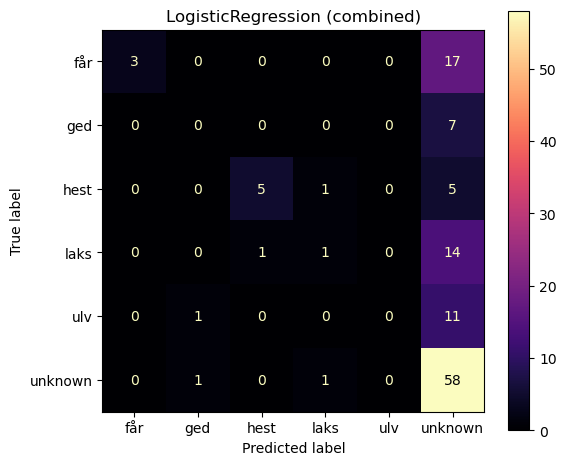


Model: LinearSVM, Features: combined
Accuracy: 0.48412698412698413
              precision    recall  f1-score   support

         får       1.00      0.05      0.10        20
         ged       0.00      0.00      0.00         7
        hest       1.00      0.09      0.17        11
        laks       0.33      0.06      0.11        16
         ulv       0.00      0.00      0.00        12
     unknown       0.49      0.97      0.65        60

    accuracy                           0.48       126
   macro avg       0.47      0.20      0.17       126
weighted avg       0.52      0.48      0.35       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


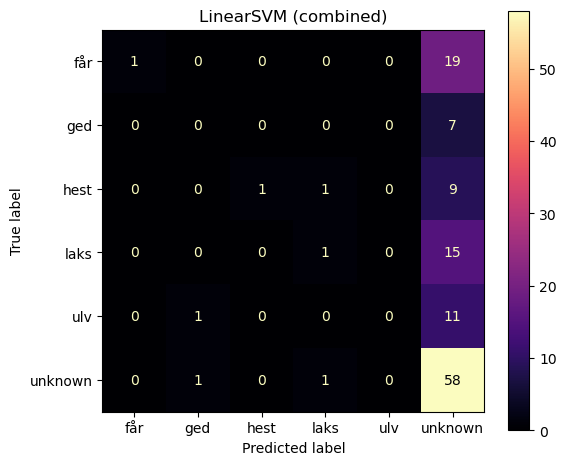


Model: RandomForest, Features: combined
Accuracy: 0.6111111111111112
              precision    recall  f1-score   support

         får       1.00      0.40      0.57        20
         ged       0.00      0.00      0.00         7
        hest       0.67      0.36      0.47        11
        laks       1.00      0.25      0.40        16
         ulv       1.00      0.08      0.15        12
     unknown       0.56      1.00      0.72        60

    accuracy                           0.61       126
   macro avg       0.70      0.35      0.39       126
weighted avg       0.71      0.61      0.54       126



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


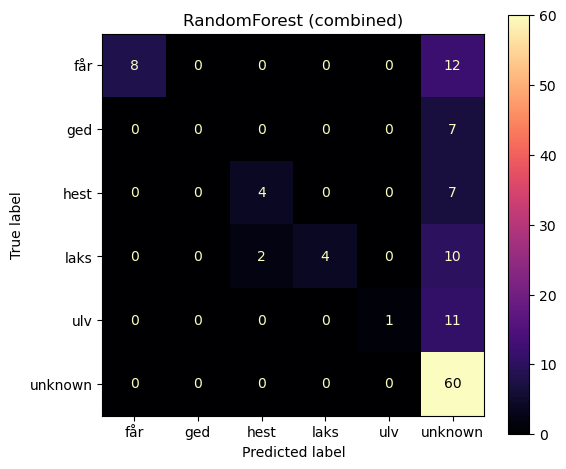


Summary:
                model  features  accuracy
2        RandomForest    simple  0.642857
0  LogisticRegression    simple  0.619048
8        RandomForest  combined  0.611111
1           LinearSVM    simple  0.603175
6  LogisticRegression  combined  0.531746
5        RandomForest      mfcc  0.507937
4           LinearSVM      mfcc  0.492063
3  LogisticRegression      mfcc  0.484127
7           LinearSVM  combined  0.484127


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa

from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("keywords_augmented")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")
TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD DATAFRAMES
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    train_records.append(record)

train_df = pd.DataFrame(train_records)

test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        test_records.append(record)

test_df = pd.DataFrame(test_records)

simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]
mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]
all_features = simple_features + mfcc_feature_cols

feature_sets = {
    "simple": simple_features,
    "mfcc": mfcc_feature_cols,
    "combined": all_features,
}

models = {
    "LogisticRegression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=3000)
    ),
    "LinearSVM": make_pipeline(
        StandardScaler(),
        LinearSVC()
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=3,
        random_state=42
    ),
}

results = []

for feat_name, feat_cols in feature_sets.items():
    X_train = train_df[feat_cols]
    y_train = train_df["activity"]

    X_test = test_df[feat_cols]
    y_test = test_df["activity"]

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        results.append({
            "model": model_name,
            "features": feat_name,
            "accuracy": acc
        })

        print(f"\nModel: {model_name}, Features: {feat_name}")
        print("Accuracy:", acc)
        print(classification_report(y_test, y_pred, labels=ALL_LABELS))

        # 🔥 NYT: Confusion Matrix Plot
        cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=ALL_LABELS
        )

        fig, ax = plt.subplots(figsize=(6, 5))
        disp.plot(ax=ax, cmap="magma", values_format="d")
        plt.title(f"{model_name} ({feat_name})")
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
print("\nSummary:")
print(results_df.sort_values("accuracy", ascending=False))

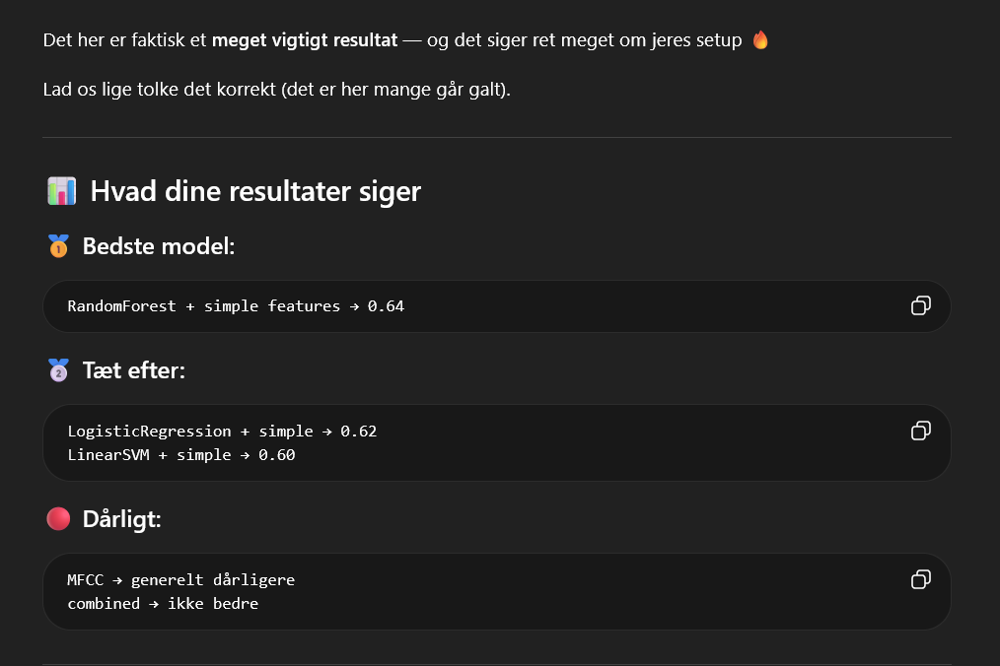

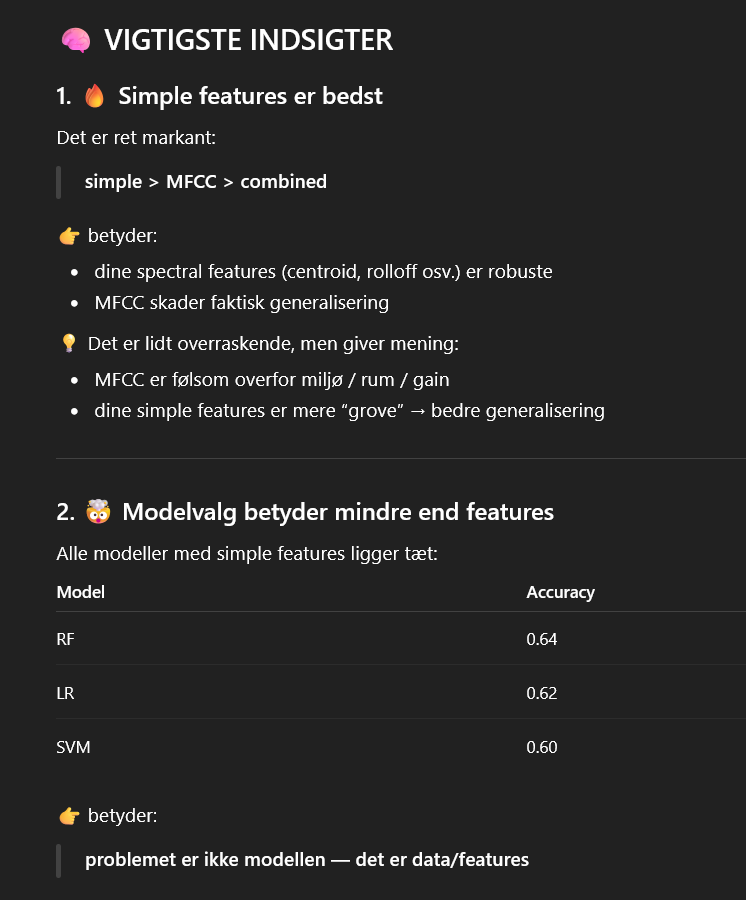

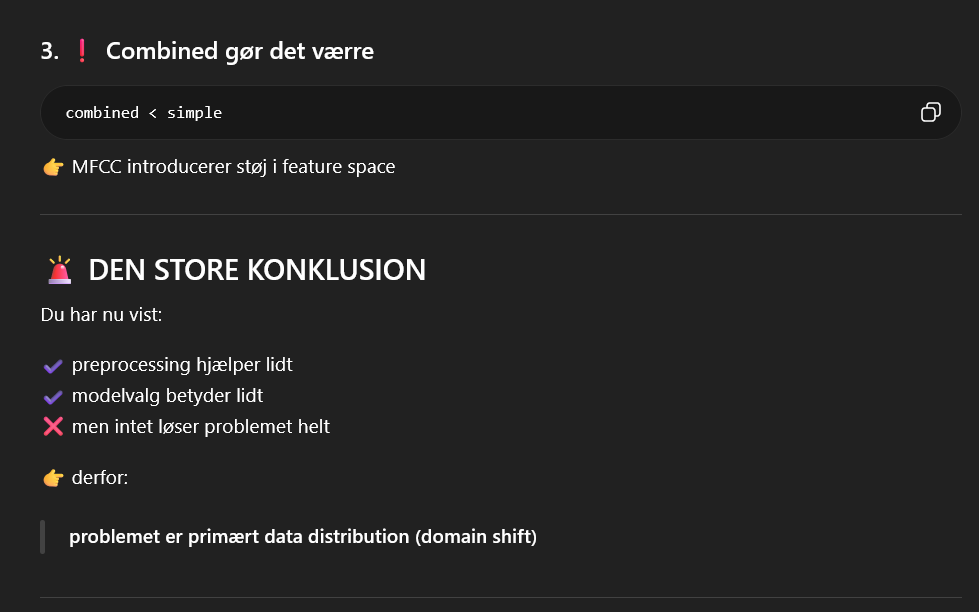

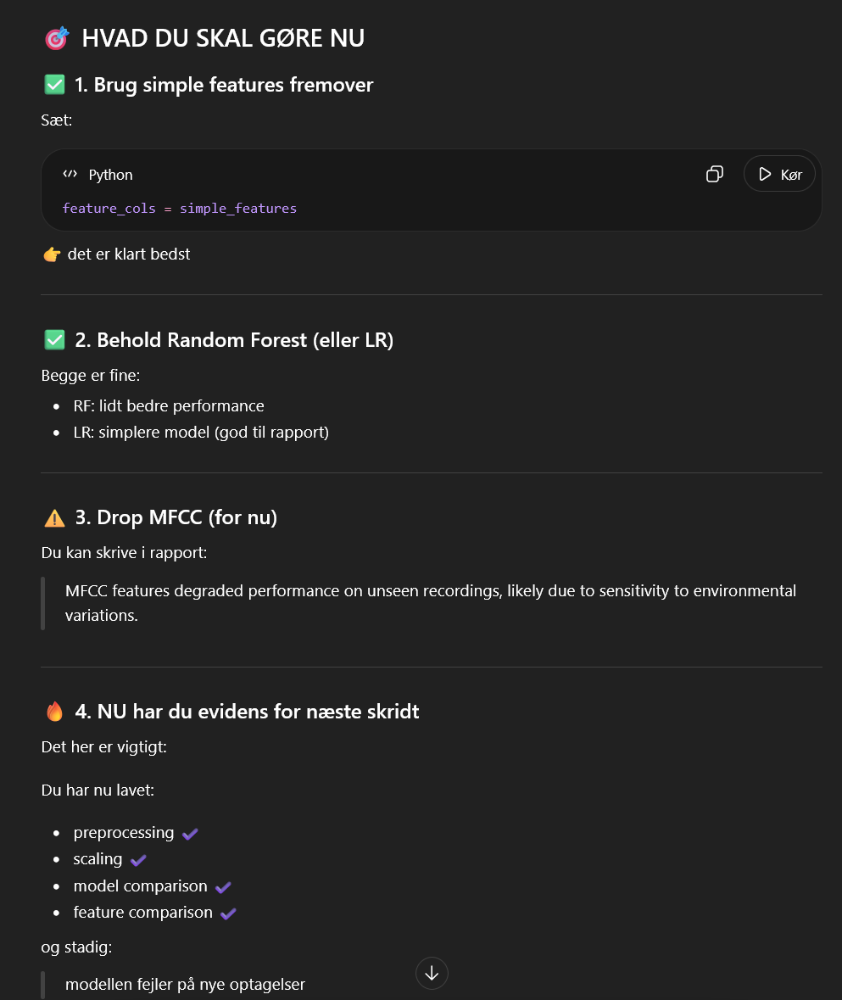



Måske skal vores model blot være robust for to forskellige støjniveauer (stille og tmlKlasse/Nygaard/Shannon)

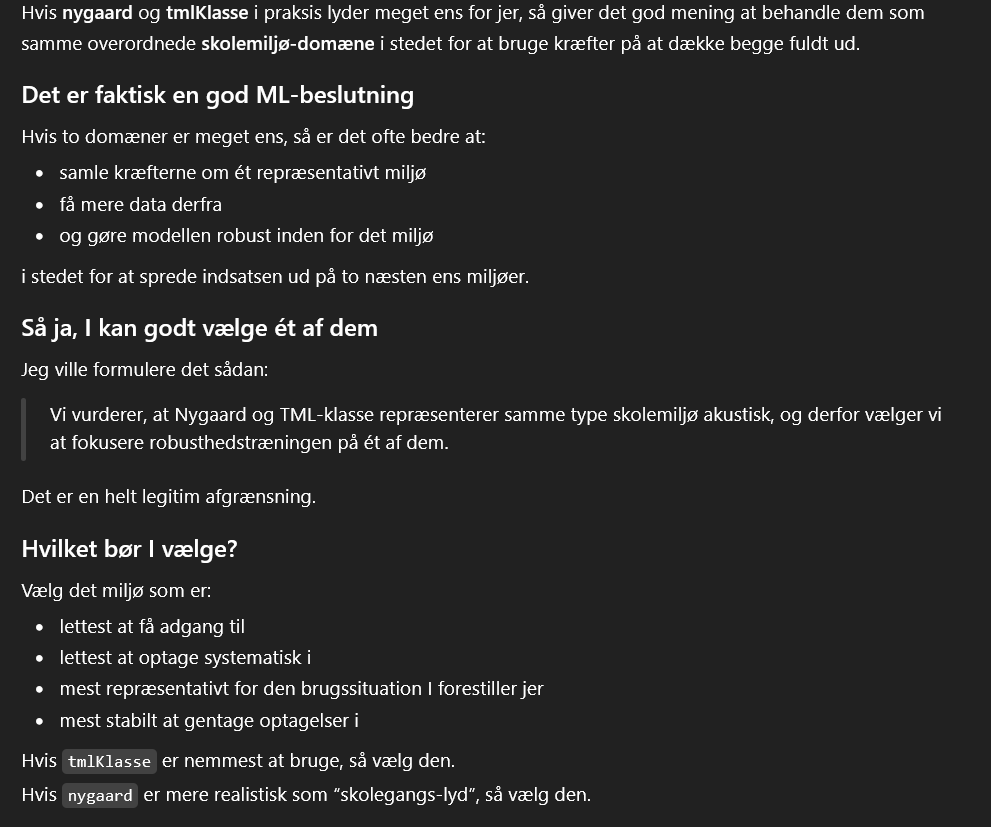



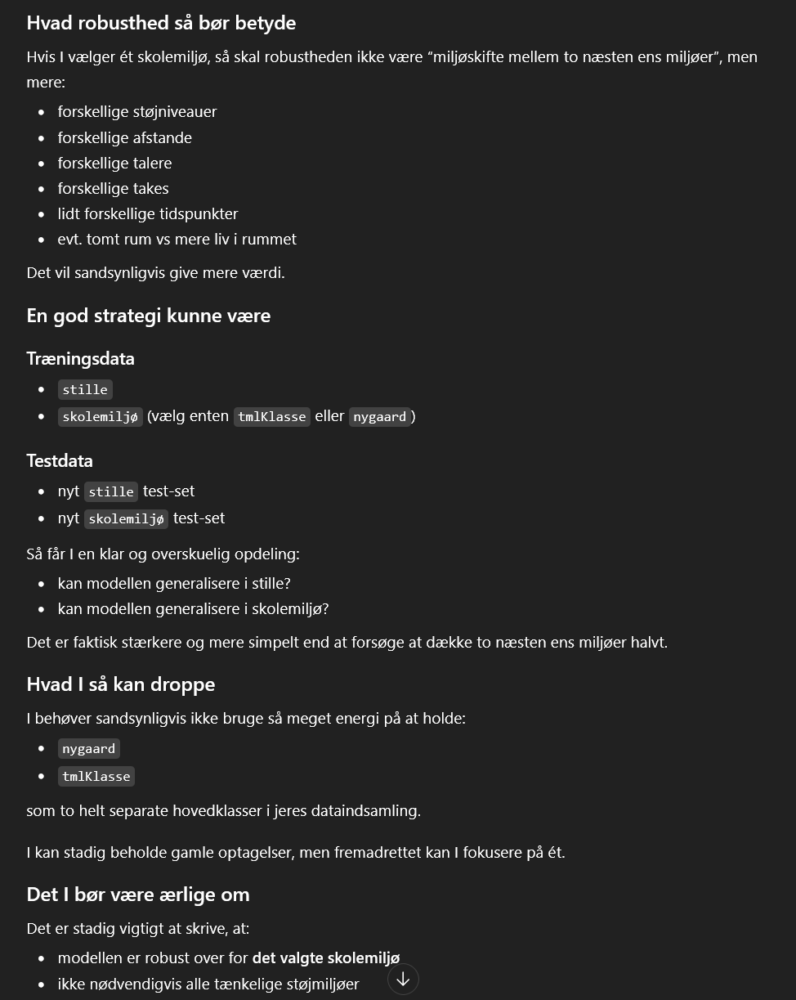

En kombination af at vores optagelser er ret monotone pr. kombination, samt at data augmentationen laver ekstra bias, så vil vi fokuserer på at lave bedre optagelser i to støj miljøer (stille og tmlKlasse/nygaard).

Vi tilføjer et miljø, så vi har to støjniveauer i alt

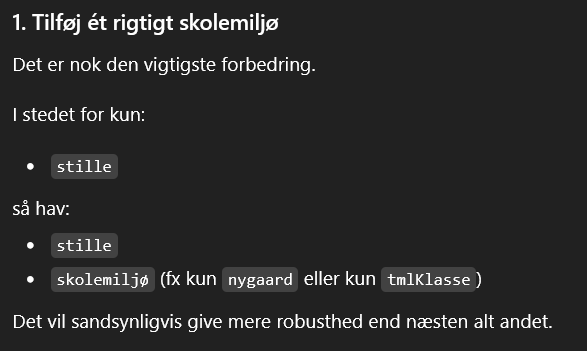

Flere takes pr kombination, ALTSÅ AT VI GENNEMFØR ET TAKE AF DISSE KOMBINATIONER MINIMUM 2 GANGE, FOR AT VI KAN FÅ VARIATION I UDTALE

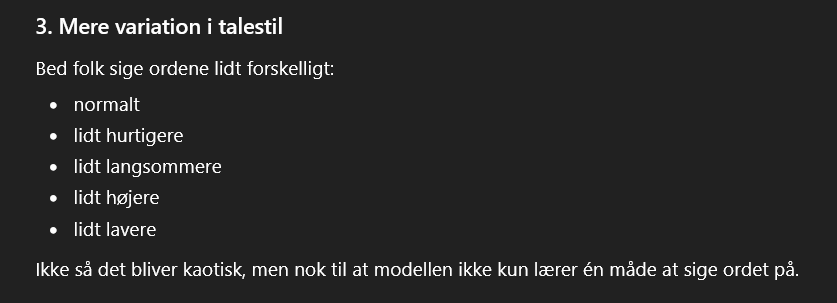

Dermed kan vi få flere optagelser, således

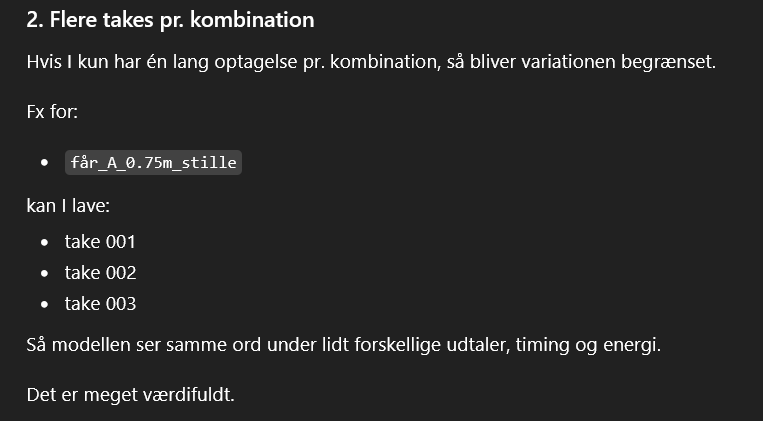

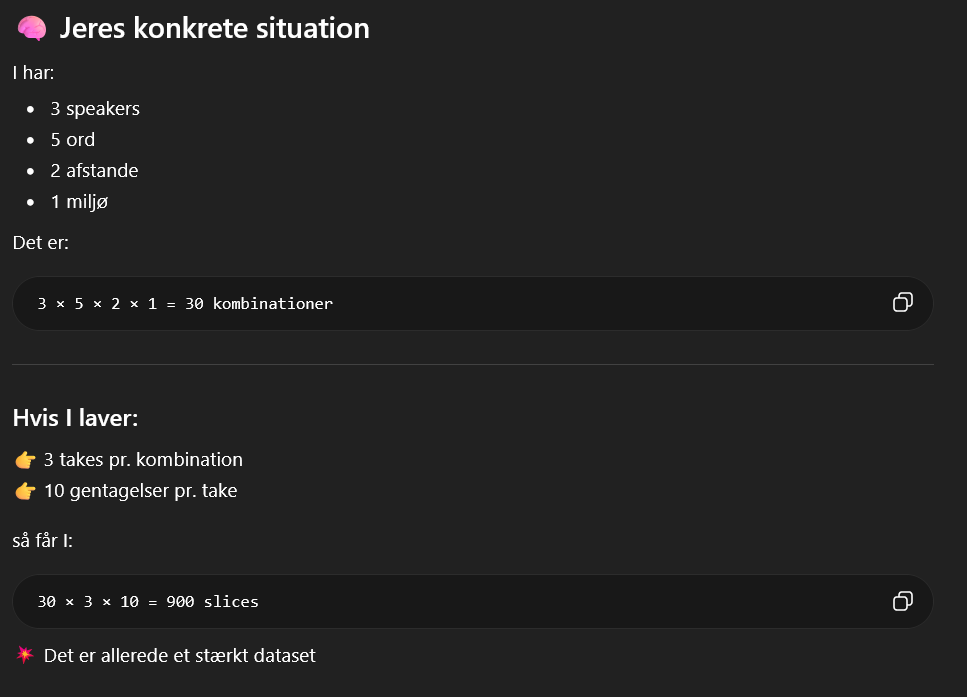

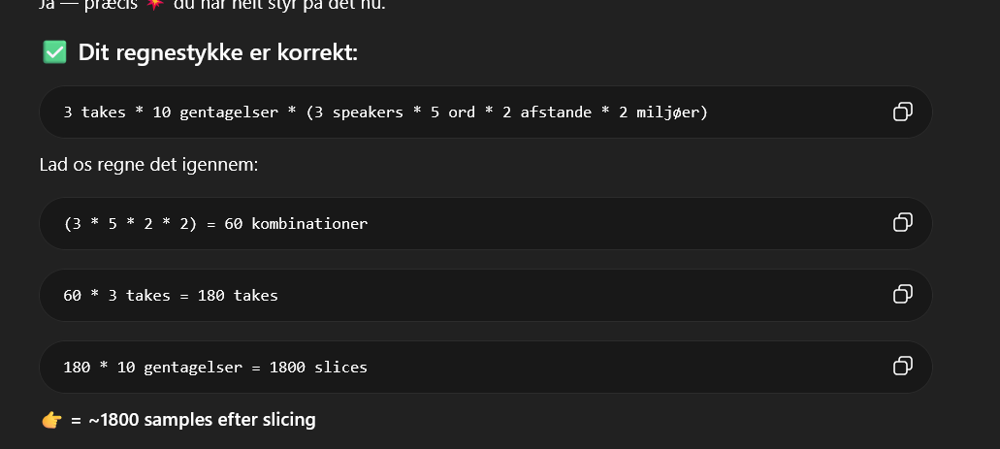

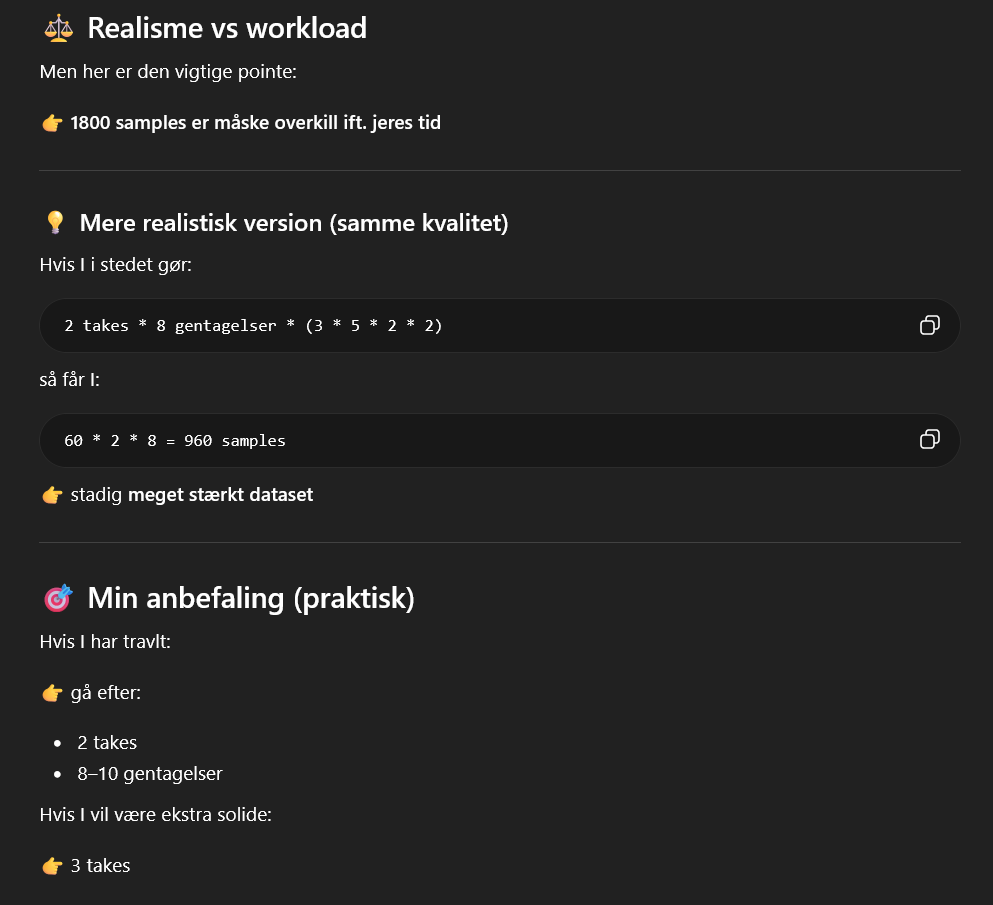

# Test set fra STILLE TML LOKALE

Ovenstående test data er fra tmlKlassen, hvilket vores optagelser med keywords ikke er robust for. Siden vi kun har optaget vores keywords i bachelor lokalet, så bør vi helst starte med at vores model er robust for bachelor lokalet. Det er ellers meget bøvlet at få optagelser i kassen i tmlKlassen, fordi vi ikke er garanteret om der er nok støj i forvejen, så vi laver nedenstående test, som er:

![image.png](attachment:image.png)

Samt ændre at vores unknown klasse, til at indeholde kun unknowns fra bachelorlokalet, HVOR VI FØR INDSAMLEDE UNKNOWNS MILJØER SOM MODELLEN IKKE KOMMER TIL AT VÆRE IBLANDT I STARTEN:

![image-2.png](attachment:image-2.png)

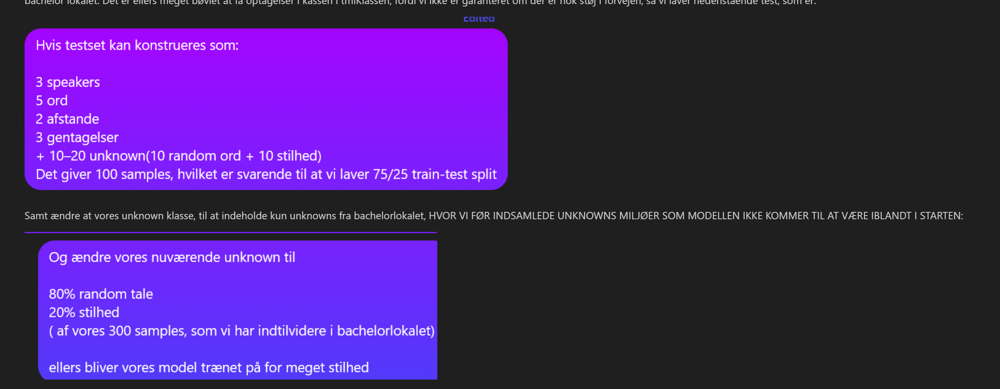

Når vi så evaluerer denne seperate test set på vores 300 samples fra bachelor lokalet, så kan vi observere om vores model er robust nok til bachelor lokalet. Hvis vi får en god confusion matrix, så har vi noget vi kan deploye og er garanteret på at vi har et MVP, som følger hele pipelinen med at vi laver indsamling af data til at vi deployer og laver inferencing på Photon 2!

Hvis den ikke er god nok, så skal vi lave flere takes, som der er beskrevet om i mappen "Anden_flere_takes_to_stømiljøer"


Model: LogisticRegression, Features: simple
Accuracy: 0.21100917431192662
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       0.40      0.11      0.17        18
        laks       1.00      0.05      0.10        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.33        20

    accuracy                           0.21       109
   macro avg       0.27      0.19      0.10       109
weighted avg       0.28      0.21      0.11       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


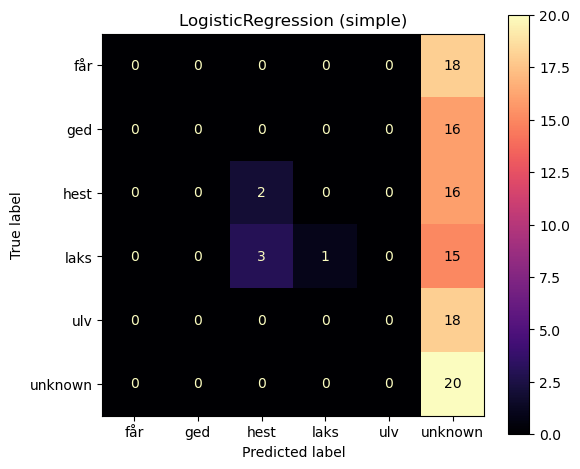


Model: LinearSVM, Features: simple
Accuracy: 0.22018348623853212
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       0.67      0.11      0.19        18
        laks       1.00      0.11      0.19        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.32        20

    accuracy                           0.22       109
   macro avg       0.31      0.20      0.12       109
weighted avg       0.32      0.22      0.12       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


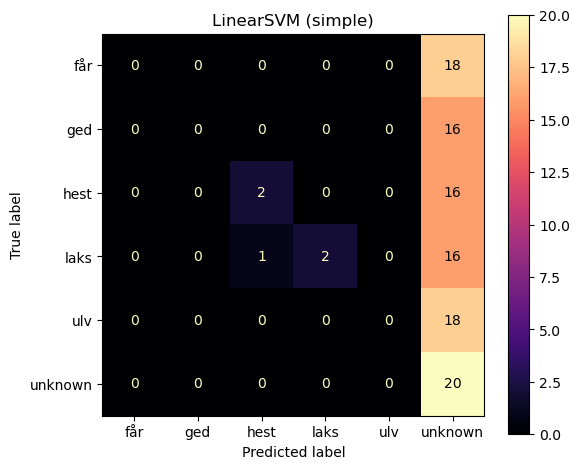


Model: RandomForest, Features: simple
Accuracy: 0.23853211009174313
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.11      0.20        18
        laks       1.00      0.16      0.27        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.33        20

    accuracy                           0.24       109
   macro avg       0.53      0.22      0.15       109
weighted avg       0.54      0.24      0.16       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


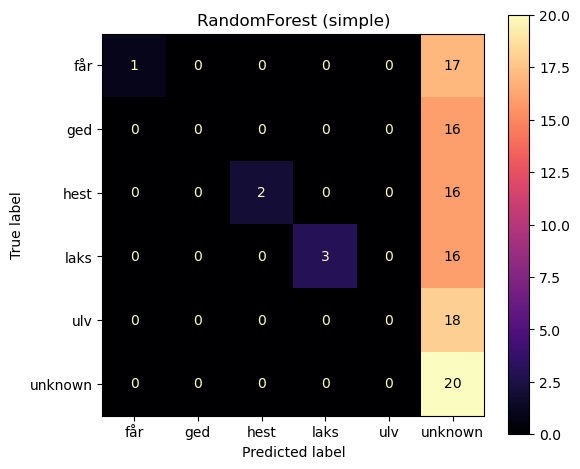


Model: LogisticRegression, Features: mfcc
Accuracy: 0.28440366972477066
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.28      0.43        18
        laks       1.00      0.26      0.42        19
         ulv       0.00      0.00      0.00        18
     unknown       0.21      1.00      0.34        20

    accuracy                           0.28       109
   macro avg       0.53      0.27      0.22       109
weighted avg       0.54      0.28      0.22       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


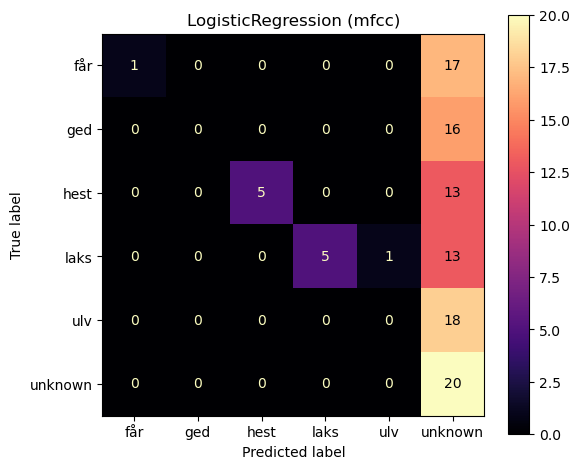


Model: LinearSVM, Features: mfcc
Accuracy: 0.30275229357798167
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.39      0.56        18
        laks       1.00      0.26      0.42        19
         ulv       0.00      0.00      0.00        18
     unknown       0.21      1.00      0.34        20

    accuracy                           0.30       109
   macro avg       0.53      0.28      0.24       109
weighted avg       0.54      0.30      0.25       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


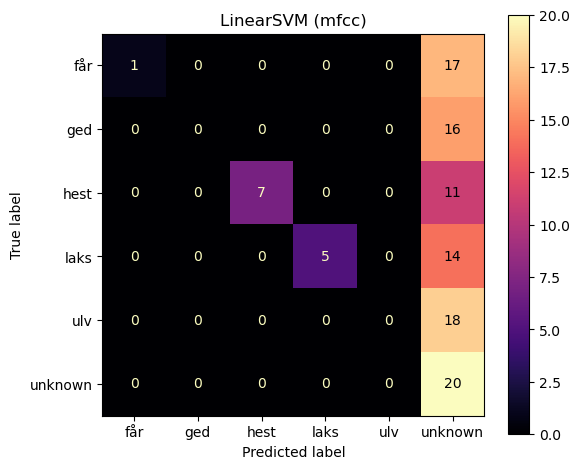


Model: RandomForest, Features: mfcc
Accuracy: 0.21100917431192662
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.06      0.11        18
        laks       1.00      0.11      0.19        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.32        20

    accuracy                           0.21       109
   macro avg       0.36      0.19      0.10       109
weighted avg       0.37      0.21      0.11       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


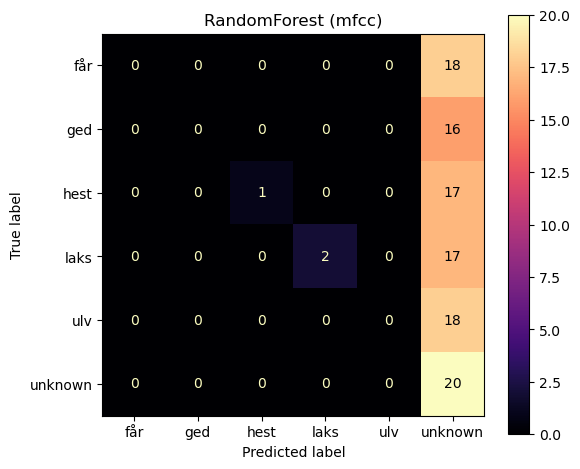


Model: LogisticRegression, Features: combined
Accuracy: 0.27522935779816515
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.17      0.29        18
        laks       1.00      0.32      0.48        19
         ulv       1.00      0.06      0.11        18
     unknown       0.20      1.00      0.34        20

    accuracy                           0.28       109
   macro avg       0.53      0.26      0.20       109
weighted avg       0.54      0.28      0.21       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


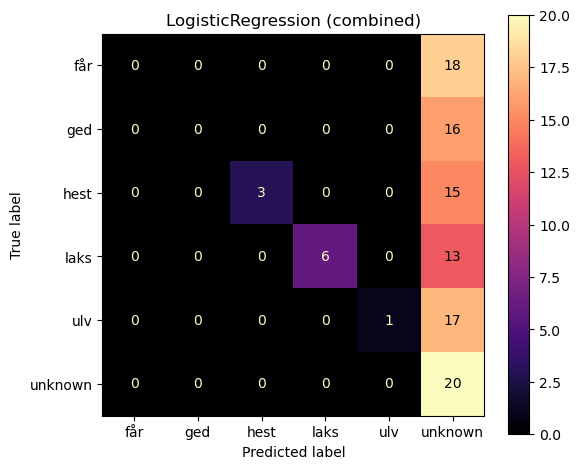


Model: LinearSVM, Features: combined
Accuracy: 0.24770642201834864
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.22      0.36        18
        laks       1.00      0.16      0.27        19
         ulv       0.00      0.00      0.00        18
     unknown       0.20      1.00      0.33        20

    accuracy                           0.25       109
   macro avg       0.37      0.23      0.16       109
weighted avg       0.38      0.25      0.17       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


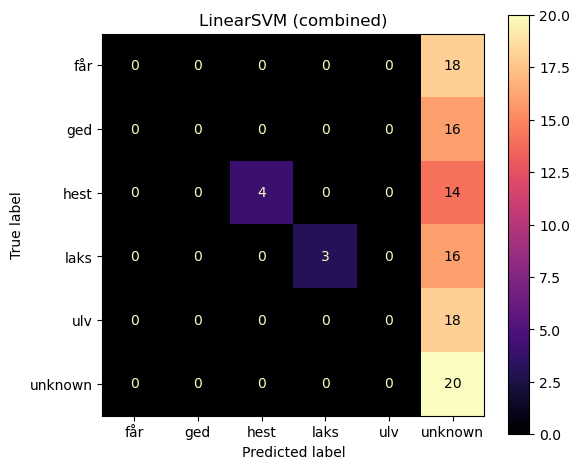


Model: RandomForest, Features: combined
Accuracy: 0.22018348623853212
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.06      0.11        18
        laks       1.00      0.11      0.19        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.32        20

    accuracy                           0.22       109
   macro avg       0.53      0.20      0.12       109
weighted avg       0.54      0.22      0.13       109



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


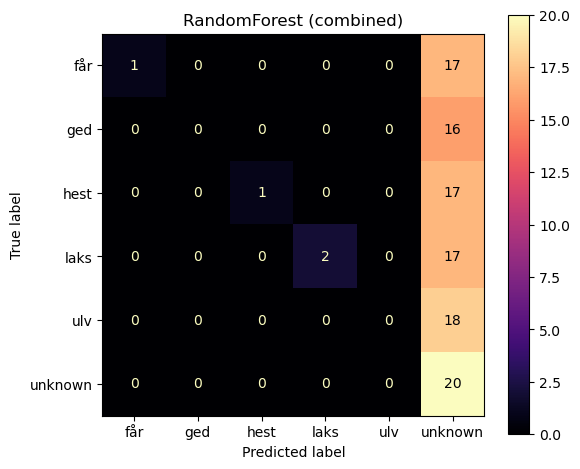


Summary:
                model  features  accuracy
4           LinearSVM      mfcc  0.302752
3  LogisticRegression      mfcc  0.284404
6  LogisticRegression  combined  0.275229
7           LinearSVM  combined  0.247706
2        RandomForest    simple  0.238532
1           LinearSVM    simple  0.220183
8        RandomForest  combined  0.220183
0  LogisticRegression    simple  0.211009
5        RandomForest      mfcc  0.211009


In [2]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    confusion_matrix,
    accuracy_score,
    classification_report,
)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("prepared_words")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")
TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD DATAFRAMES
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    train_records.append(record)

train_df = pd.DataFrame(train_records)

test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        test_records.append(record)

test_df = pd.DataFrame(test_records)

simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]
mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]
all_features = simple_features + mfcc_feature_cols

feature_sets = {
    "simple": simple_features,
    "mfcc": mfcc_feature_cols,
    "combined": all_features,
}

models = {
    "LogisticRegression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=3000)
    ),
    "LinearSVM": make_pipeline(
        StandardScaler(),
        LinearSVC()
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=3,
        random_state=42
    ),
}

results = []

for feat_name, feat_cols in feature_sets.items():
    X_train = train_df[feat_cols]
    y_train = train_df["activity"]

    X_test = test_df[feat_cols]
    y_test = test_df["activity"]

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        results.append({
            "model": model_name,
            "features": feat_name,
            "accuracy": acc
        })

        print(f"\nModel: {model_name}, Features: {feat_name}")
        print("Accuracy:", acc)
        print(classification_report(y_test, y_pred, labels=ALL_LABELS))

        # 🔥 NYT: Confusion Matrix Plot
        cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=ALL_LABELS
        )

        fig, ax = plt.subplots(figsize=(6, 5))
        disp.plot(ax=ax, cmap="magma", values_format="d")
        plt.title(f"{model_name} ({feat_name})")
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
print("\nSummary:")
print(results_df.sort_values("accuracy", ascending=False))

Vi plotter FFT og ser om de optagelser, som er stærkt påvirket af "klik" støjen er stærkt visualiseret og kan dermed ødelægge vores klassificering

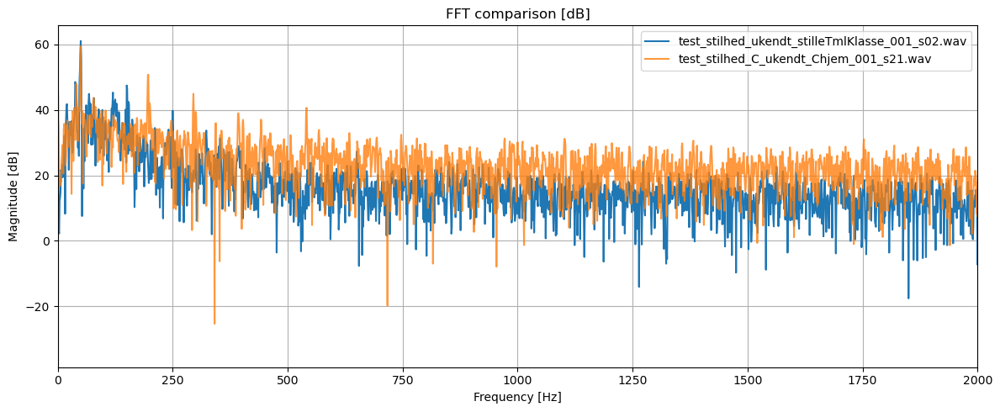

In [15]:
from pathlib import Path
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt


def load_wav_mono(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)
    if x.ndim > 1:
        x = x.mean(axis=1)
    return x, fs


def normalize_peak(x, eps=1e-9):
    return x / (np.max(np.abs(x)) + eps)


def fft_db(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    mag_db = 20 * np.log10(mag + 1e-12)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag_db


def compare_fft(file1, file2, xlim_freq=(0, 8000), normalize=True):
    x1, fs1 = load_wav_mono(Path(file1))
    x2, fs2 = load_wav_mono(Path(file2))

    if fs1 != fs2:
        raise ValueError(f"Different sample rates: {fs1} vs {fs2}")

    if normalize:
        x1 = normalize_peak(x1)
        x2 = normalize_peak(x2)

    f1, db1 = fft_db(x1, fs1)
    f2, db2 = fft_db(x2, fs2)

    plt.figure(figsize=(12, 5))
    plt.plot(f1, db1, label=Path(file1).name)
    plt.plot(f2, db2, label=Path(file2).name, alpha=0.8)
    plt.title("FFT comparison [dB]")
    plt.xlabel("Frequency [Hz]")
    plt.ylabel("Magnitude [dB]")
    plt.xlim(xlim_freq)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


# Example:
compare_fft(
    "test_ready/unknown/test_stilhed_ukendt_stilleTmlKlasse_001_s02.wav",
    "test_stilhed_C_ukendt_Chjem_001_s21.wav",
    xlim_freq=(0, 2000)
)


Model: LogisticRegression, Features: simple
Accuracy: 0.21100917431192662
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       0.40      0.11      0.17        18
        laks       1.00      0.05      0.10        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.33        20

    accuracy                           0.21       109
   macro avg       0.27      0.19      0.10       109
weighted avg       0.28      0.21      0.11       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


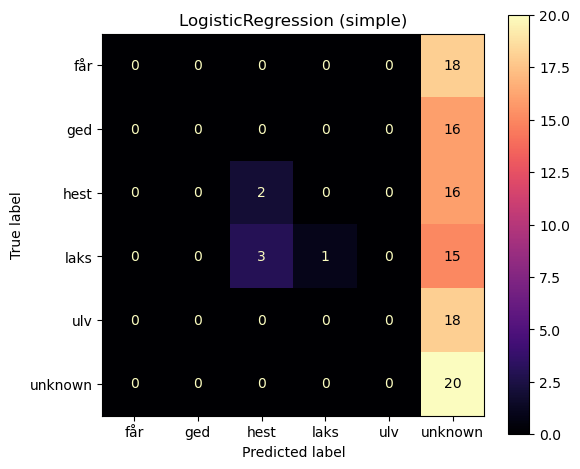


Model: LinearSVM, Features: simple
Accuracy: 0.22018348623853212
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       0.67      0.11      0.19        18
        laks       1.00      0.11      0.19        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.32        20

    accuracy                           0.22       109
   macro avg       0.31      0.20      0.12       109
weighted avg       0.32      0.22      0.12       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_la

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


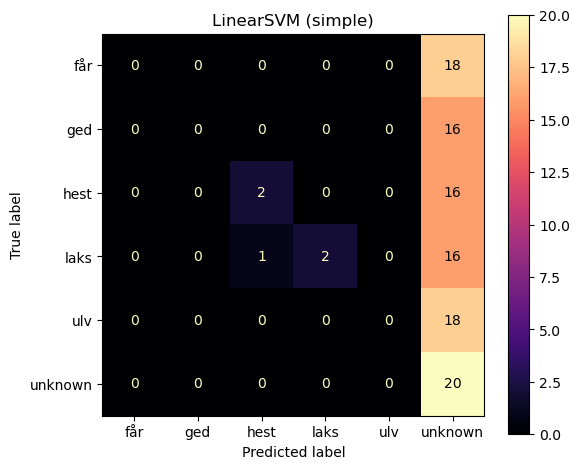


Model: RandomForest, Features: simple
Accuracy: 0.23853211009174313
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.11      0.20        18
        laks       1.00      0.16      0.27        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.33        20

    accuracy                           0.24       109
   macro avg       0.53      0.22      0.15       109
weighted avg       0.54      0.24      0.16       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


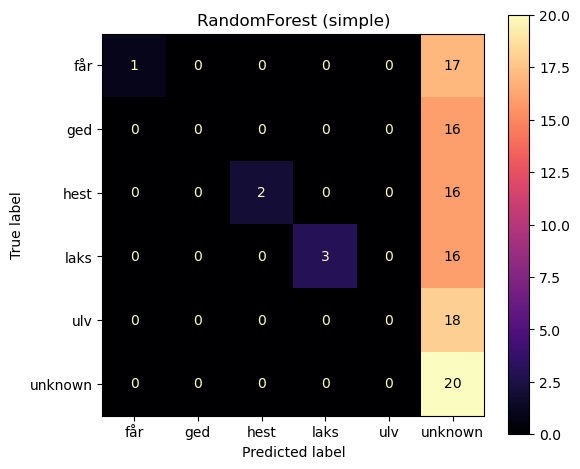


Model: LogisticRegression, Features: mfcc
Accuracy: 0.28440366972477066
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.28      0.43        18
        laks       1.00      0.26      0.42        19
         ulv       0.00      0.00      0.00        18
     unknown       0.21      1.00      0.34        20

    accuracy                           0.28       109
   macro avg       0.53      0.27      0.22       109
weighted avg       0.54      0.28      0.22       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_f

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


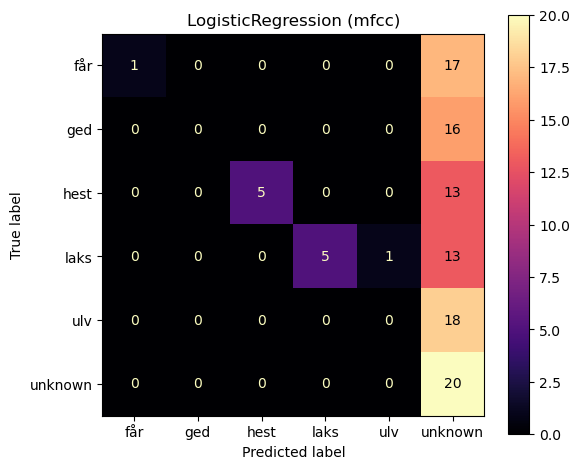


Model: LinearSVM, Features: mfcc
Accuracy: 0.30275229357798167
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.39      0.56        18
        laks       1.00      0.26      0.42        19
         ulv       0.00      0.00      0.00        18
     unknown       0.21      1.00      0.34        20

    accuracy                           0.30       109
   macro avg       0.53      0.28      0.24       109
weighted avg       0.54      0.30      0.25       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_lang

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


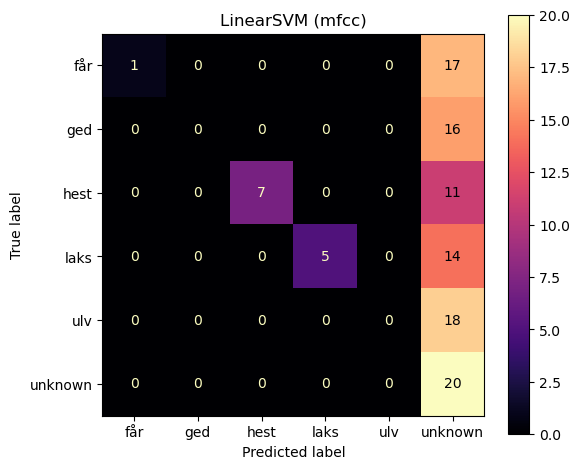


Model: RandomForest, Features: mfcc
Accuracy: 0.21100917431192662
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.06      0.11        18
        laks       1.00      0.11      0.19        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.32        20

    accuracy                           0.21       109
   macro avg       0.36      0.19      0.10       109
weighted avg       0.37      0.21      0.11       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_l

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


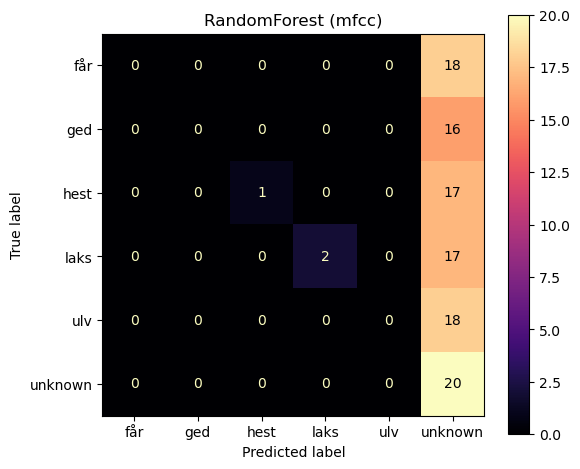


Model: LogisticRegression, Features: combined
Accuracy: 0.27522935779816515
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.17      0.29        18
        laks       1.00      0.32      0.48        19
         ulv       1.00      0.06      0.11        18
     unknown       0.20      1.00      0.34        20

    accuracy                           0.28       109
   macro avg       0.53      0.26      0.20       109
weighted avg       0.54      0.28      0.21       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 te

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


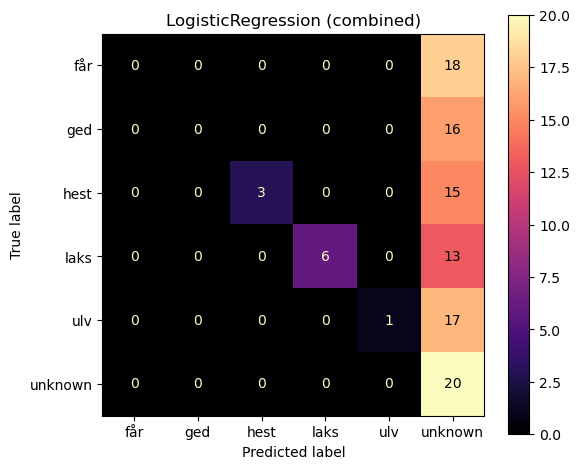


Model: LinearSVM, Features: combined
Accuracy: 0.24770642201834864
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.22      0.36        18
        laks       1.00      0.16      0.27        19
         ulv       0.00      0.00      0.00        18
     unknown       0.20      1.00      0.33        20

    accuracy                           0.25       109
   macro avg       0.37      0.23      0.16       109
weighted avg       0.38      0.25      0.17       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


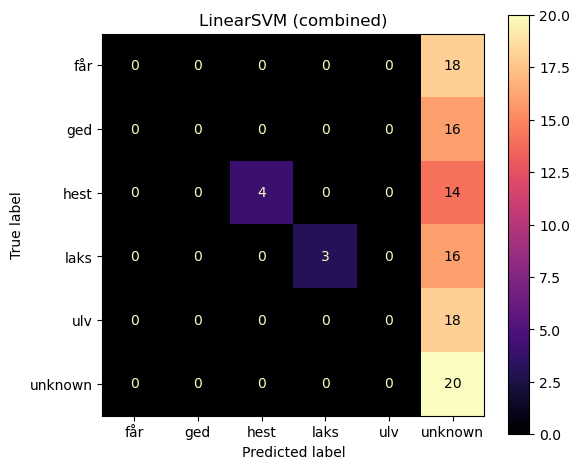


Model: RandomForest, Features: combined
Accuracy: 0.22018348623853212
              precision    recall  f1-score   support

         får       1.00      0.06      0.11        18
         ged       0.00      0.00      0.00        16
        hest       1.00      0.06      0.11        18
        laks       1.00      0.11      0.19        19
         ulv       0.00      0.00      0.00        18
     unknown       0.19      1.00      0.32        20

    accuracy                           0.22       109
   macro avg       0.53      0.20      0.12       109
weighted avg       0.54      0.22      0.13       109


Misclassified files:
                                           filename activity predicted
 test_får_A_kortAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s02.wav      får   unknown
 test_får_A_kortAfstand_stilleTmlKlasse_001_s03.wav      får   unknown
 test_får_A_langAfstand_stilleTmlKlasse_001_s01.wav      får   unknown
 test_får

c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


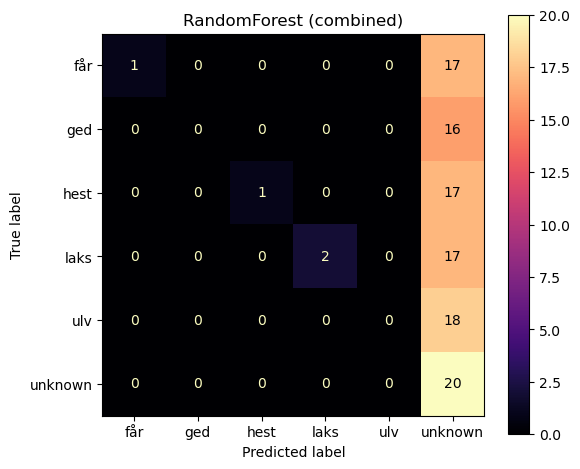


Summary:
                model  features  accuracy
4           LinearSVM      mfcc  0.302752
3  LogisticRegression      mfcc  0.284404
6  LogisticRegression  combined  0.275229
7           LinearSVM  combined  0.247706
2        RandomForest    simple  0.238532
1           LinearSVM    simple  0.220183
8        RandomForest  combined  0.220183
0  LogisticRegression    simple  0.211009
5        RandomForest      mfcc  0.211009


In [2]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    confusion_matrix,
    accuracy_score,
    classification_report,
)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("prepared_words")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")
TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD DATAFRAMES
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    train_records.append(record)

train_df = pd.DataFrame(train_records)

test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filepath"] = str(wav_path)
        record["filename"] = wav_path.name
        test_records.append(record)

test_df = pd.DataFrame(test_records)

simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]
mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]
all_features = simple_features + mfcc_feature_cols

feature_sets = {
    "simple": simple_features,
    "mfcc": mfcc_feature_cols,
    "combined": all_features,
}

models = {
    "LogisticRegression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=3000)
    ),
    "LinearSVM": make_pipeline(
        StandardScaler(),
        LinearSVC()
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=3,
        random_state=42
    ),
}

results = []

for feat_name, feat_cols in feature_sets.items():
    X_train = train_df[feat_cols]
    y_train = train_df["activity"]

    X_test = test_df[feat_cols]
    y_test = test_df["activity"]

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        results.append({
            "model": model_name,
            "features": feat_name,
            "accuracy": acc
        })

        print(f"\nModel: {model_name}, Features: {feat_name}")
        print("Accuracy:", acc)
        print(classification_report(y_test, y_pred, labels=ALL_LABELS))

        # Debug-tabel med filnavne
        debug_df = test_df[["filename", "filepath", "activity"]].copy()
        debug_df["predicted"] = y_pred
        debug_df["is_correct"] = debug_df["activity"] == debug_df["predicted"]

        # ❌ Alle fejl
        misclassified = debug_df[~debug_df["is_correct"]]
        print("\nMisclassified files:")
        if len(misclassified) == 0:
            print("None")
        else:
            print(misclassified[["filename", "activity", "predicted"]].to_string(index=False))

        # ❌ False negatives
        false_negatives = debug_df[
            (debug_df["activity"].isin(KEYWORD_LABELS)) &
            (debug_df["predicted"] == "unknown")
        ]
        print("\nFalse negatives (keyword predicted as unknown):")
        if len(false_negatives) == 0:
            print("None")
        else:
            print(false_negatives[["filename", "activity", "predicted"]].to_string(index=False))

        # ✅ True positives
        true_positives = debug_df[
            (debug_df["activity"].isin(KEYWORD_LABELS)) &
            (debug_df["predicted"] == debug_df["activity"])
        ]
        print("\nTrue positives (correct keyword predictions):")
        if len(true_positives) == 0:
            print("None")
        else:
            print(true_positives[["filename", "activity"]].to_string(index=False))

        # Gem evt. som CSV
        misclassified.to_csv(f"misclassified_{model_name}_{feat_name}.csv", index=False)
        false_negatives.to_csv(f"false_negatives_{model_name}_{feat_name}.csv", index=False)
        true_positives.to_csv(f"true_positives_{model_name}_{feat_name}.csv", index=False)
        # 🔥 Confusion Matrix Plot
        cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=ALL_LABELS
        )

        fig, ax = plt.subplots(figsize=(6, 5))
        disp.plot(ax=ax, cmap="magma", values_format="d")
        plt.title(f"{model_name} ({feat_name})")
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
print("\nSummary:")
print(results_df.sort_values("accuracy", ascending=False))

# Test hos Chjem --> God confusion matrix

# Vigtigt

DESUDEN BØR VI NAVNGIVE VORES "stille" TIL "bachelor_lokale", EFTERSOM AT MODELLEN SOM DEN ER NU ER ROBUST FOR VARIATIONER I DET LOKALE, SOM HAR BESTEMTE AKUSTISKE FORHOLD OG RUMKLANG. 

# Test set fra bachelor lokale

Ovenstående test data er fra tmlKlassen, hvilket vores optagelser med keywords ikke er robust for. Siden vi kun har optaget vores keywords i bachelor lokalet, så bør vi helst starte med at vores model er robust for bachelor lokalet. Det er ellers meget bøvlet at få optagelser i kassen i tmlKlassen, fordi vi ikke er garanteret om der er nok støj i forvejen.

Samt ændre at vores unknown klasse, til at indeholde kun unknowns fra bachelorlokalet.

Når vi så evaluerer denne seperate test set på vores 300 samples fra bachelor lokalet, så kan vi observere om vores model er robust nok til bachelor lokalet. Hvis vi får en god confusion matrix, så har vi noget vi kan deploye og er garanteret på at vi har et MVP, som følger hele pipelinen med at vi laver indsamling af data til at vi deployer og laver inferencing på Photon 2!

Hvis den ikke er god nok, så skal vi lave flere takes, som der er beskrevet om i mappen "Anden_flere_takes_to_stømiljøer"


Model: LogisticRegression, Features: simple
Accuracy: 0.8
              precision    recall  f1-score   support

         får       0.86      0.90      0.88        20
         ged       0.74      0.70      0.72        20
        hest       0.79      0.95      0.86        20
        laks       0.89      0.80      0.84        20
         ulv       0.91      0.50      0.65        20
     unknown       0.74      0.88      0.80        40

    accuracy                           0.80       140
   macro avg       0.82      0.79      0.79       140
weighted avg       0.81      0.80      0.79       140



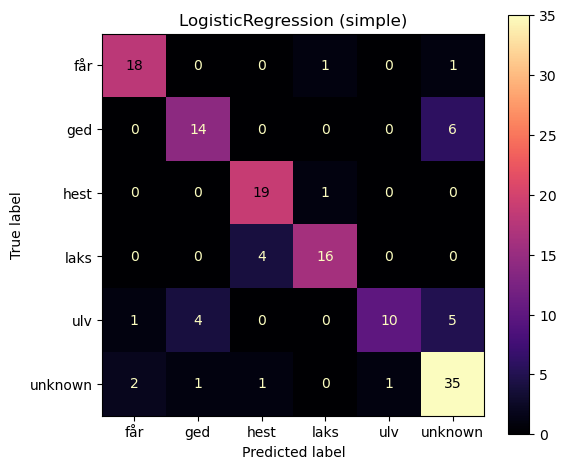


Model: LinearSVM, Features: simple
Accuracy: 0.8214285714285714
              precision    recall  f1-score   support

         får       0.86      0.90      0.88        20
         ged       0.80      0.60      0.69        20
        hest       0.80      1.00      0.89        20
        laks       1.00      0.80      0.89        20
         ulv       0.93      0.70      0.80        20
     unknown       0.73      0.88      0.80        40

    accuracy                           0.82       140
   macro avg       0.85      0.81      0.82       140
weighted avg       0.84      0.82      0.82       140



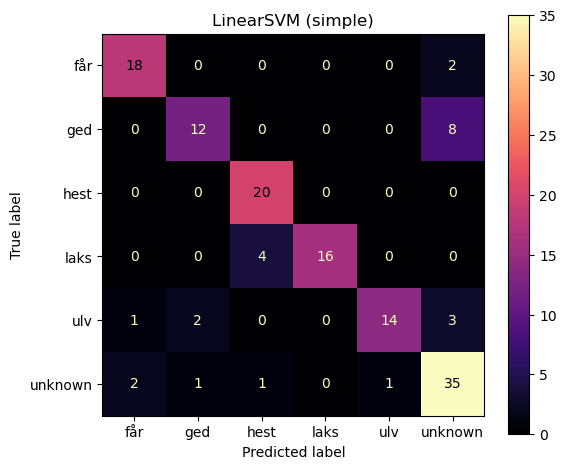


Model: RandomForest, Features: simple
Accuracy: 0.7285714285714285
              precision    recall  f1-score   support

         får       1.00      0.45      0.62        20
         ged       1.00      0.45      0.62        20
        hest       0.83      1.00      0.91        20
        laks       0.94      0.80      0.86        20
         ulv       0.90      0.45      0.60        20
     unknown       0.55      0.97      0.70        40

    accuracy                           0.73       140
   macro avg       0.87      0.69      0.72       140
weighted avg       0.82      0.73      0.72       140



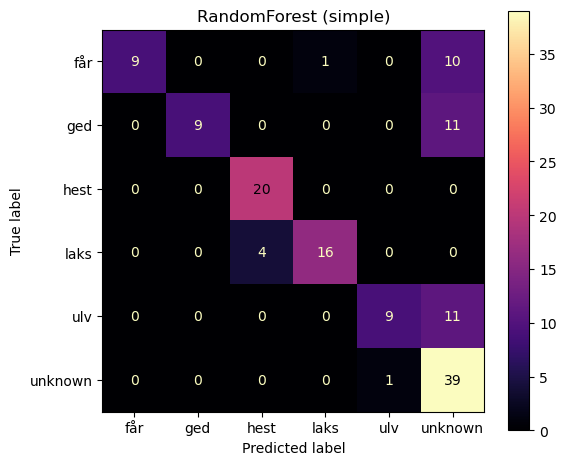


Model: LogisticRegression, Features: mfcc
Accuracy: 0.8857142857142857
              precision    recall  f1-score   support

         får       0.95      1.00      0.98        20
         ged       0.79      0.95      0.86        20
        hest       1.00      1.00      1.00        20
        laks       1.00      1.00      1.00        20
         ulv       0.75      0.45      0.56        20
     unknown       0.84      0.90      0.87        40

    accuracy                           0.89       140
   macro avg       0.89      0.88      0.88       140
weighted avg       0.88      0.89      0.88       140



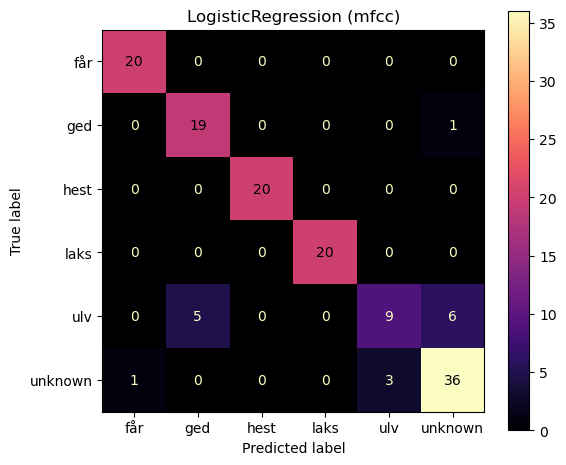


Model: LinearSVM, Features: mfcc
Accuracy: 0.8928571428571429
              precision    recall  f1-score   support

         får       0.95      1.00      0.98        20
         ged       0.86      0.90      0.88        20
        hest       0.95      1.00      0.98        20
        laks       0.95      1.00      0.98        20
         ulv       0.91      0.50      0.65        20
     unknown       0.82      0.93      0.87        40

    accuracy                           0.89       140
   macro avg       0.91      0.89      0.89       140
weighted avg       0.90      0.89      0.88       140



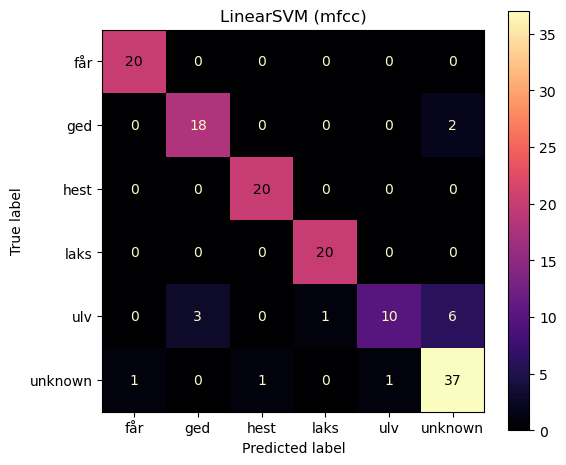


Model: RandomForest, Features: mfcc
Accuracy: 0.7142857142857143
              precision    recall  f1-score   support

         får       1.00      0.65      0.79        20
         ged       1.00      0.40      0.57        20
        hest       1.00      1.00      1.00        20
        laks       0.95      0.95      0.95        20
         ulv       0.00      0.00      0.00        20
     unknown       0.51      1.00      0.67        40

    accuracy                           0.71       140
   macro avg       0.74      0.67      0.66       140
weighted avg       0.71      0.71      0.66       140



c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


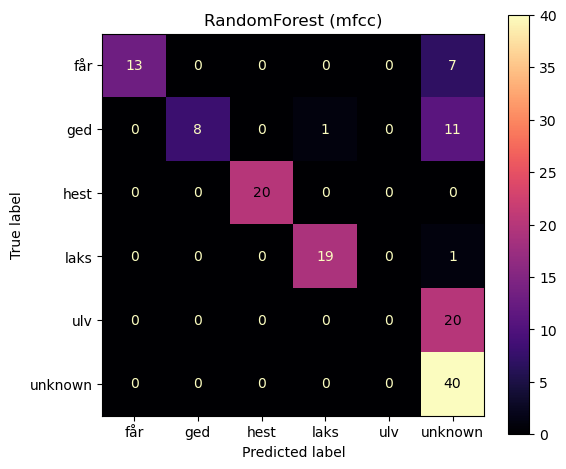


Model: LogisticRegression, Features: combined
Accuracy: 0.9571428571428572
              precision    recall  f1-score   support

         får       0.95      1.00      0.98        20
         ged       0.95      1.00      0.98        20
        hest       0.91      1.00      0.95        20
        laks       1.00      0.95      0.97        20
         ulv       0.90      0.90      0.90        20
     unknown       1.00      0.93      0.96        40

    accuracy                           0.96       140
   macro avg       0.95      0.96      0.96       140
weighted avg       0.96      0.96      0.96       140



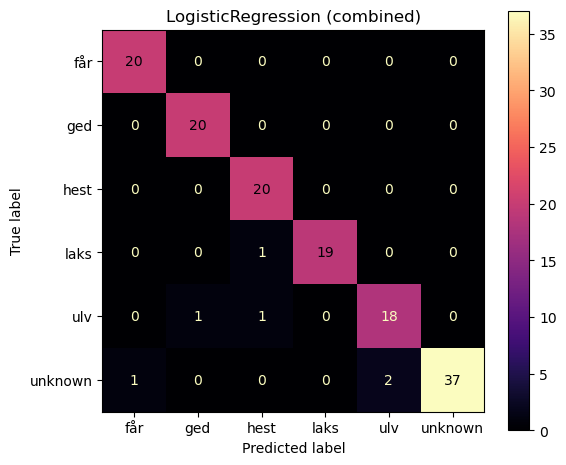


Model: LinearSVM, Features: combined
Accuracy: 0.95
              precision    recall  f1-score   support

         får       0.91      1.00      0.95        20
         ged       1.00      1.00      1.00        20
        hest       0.87      1.00      0.93        20
        laks       1.00      0.85      0.92        20
         ulv       0.95      0.95      0.95        20
     unknown       0.97      0.93      0.95        40

    accuracy                           0.95       140
   macro avg       0.95      0.95      0.95       140
weighted avg       0.95      0.95      0.95       140



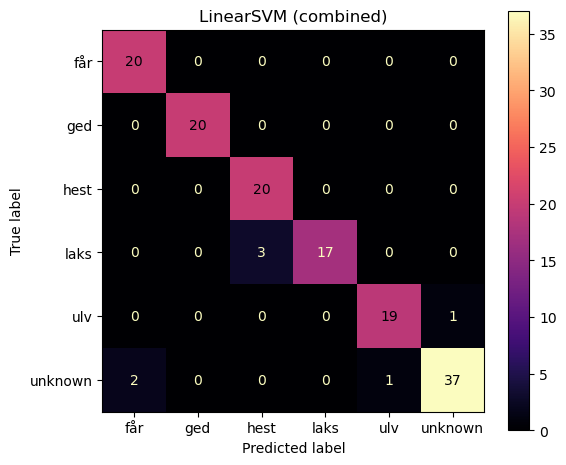


Model: RandomForest, Features: combined
Accuracy: 0.7714285714285715
              precision    recall  f1-score   support

         får       1.00      0.60      0.75        20
         ged       1.00      0.45      0.62        20
        hest       1.00      1.00      1.00        20
        laks       1.00      0.95      0.97        20
         ulv       0.90      0.45      0.60        20
     unknown       0.56      0.97      0.71        40

    accuracy                           0.77       140
   macro avg       0.91      0.74      0.78       140
weighted avg       0.86      0.77      0.77       140



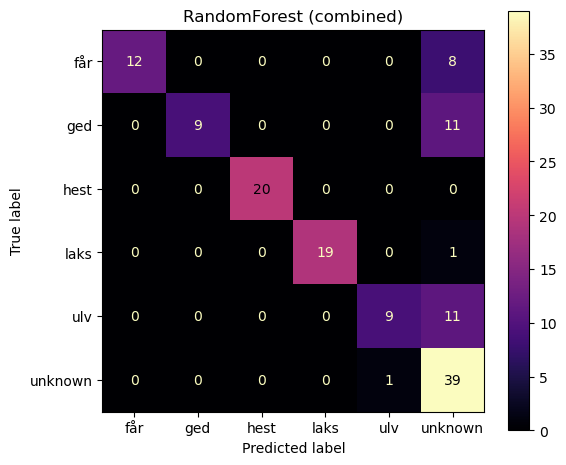


Summary:
                model  features  accuracy
6  LogisticRegression  combined  0.957143
7           LinearSVM  combined  0.950000
4           LinearSVM      mfcc  0.892857
3  LogisticRegression      mfcc  0.885714
1           LinearSVM    simple  0.821429
0  LogisticRegression    simple  0.800000
8        RandomForest  combined  0.771429
2        RandomForest    simple  0.728571
5        RandomForest      mfcc  0.714286


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    confusion_matrix,
    accuracy_score,
    classification_report,
)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("prepared_words")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")
TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
N_MFCC = 13

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak

    return x

def magnitude_spectrum(x, fs):
    window = np.hanning(len(x))
    xw = x * window
    spec = np.fft.rfft(xw)
    mag = np.abs(spec)
    freqs = np.fft.rfftfreq(len(xw), d=1 / fs)
    return freqs, mag

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def mfcc_features(x, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=1024,
        hop_length=512
    )
    return np.mean(mfcc, axis=1)

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mfcc_vals = mfcc_features(x, fs, n_mfcc=N_MFCC)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD DATAFRAMES
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    train_records.append(record)

train_df = pd.DataFrame(train_records)

test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        test_records.append(record)

test_df = pd.DataFrame(test_records)

simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]
mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]
all_features = simple_features + mfcc_feature_cols

feature_sets = {
    "simple": simple_features,
    "mfcc": mfcc_feature_cols,
    "combined": all_features,
}

models = {
    "LogisticRegression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=3000)
    ),
    "LinearSVM": make_pipeline(
        StandardScaler(),
        LinearSVC()
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=3,
        random_state=42
    ),
}

results = []

for feat_name, feat_cols in feature_sets.items():
    X_train = train_df[feat_cols]
    y_train = train_df["activity"]

    X_test = test_df[feat_cols]
    y_test = test_df["activity"]

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        results.append({
            "model": model_name,
            "features": feat_name,
            "accuracy": acc
        })

        print(f"\nModel: {model_name}, Features: {feat_name}")
        print("Accuracy:", acc)
        print(classification_report(y_test, y_pred, labels=ALL_LABELS))

        # 🔥 NYT: Confusion Matrix Plot
        cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=ALL_LABELS
        )

        fig, ax = plt.subplots(figsize=(6, 5))
        disp.plot(ax=ax, cmap="magma", values_format="d")
        plt.title(f"{model_name} ({feat_name})")
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
print("\nSummary:")
print(results_df.sort_values("accuracy", ascending=False))

# Fra DFT til FFT (4096)

Pga. at DFT tog for lang tid, så prøvede vi at kører FFT. Her vises det sig at en FFT vinduestørrelse på 4096 virkede fint. Nedenunder viser confusion matrices i FFT 4096 versionen, i stedet for DFT:


Model: LogisticRegression, Features: simple [FFT_N=4096]
Number of features: 9
Accuracy: 0.5928571428571429
              precision    recall  f1-score   support

         får       0.67      0.60      0.63        20
         ged       0.40      0.10      0.16        20
        hest       0.58      0.55      0.56        20
        laks       0.56      0.70      0.62        20
         ulv       0.80      0.40      0.53        20
     unknown       0.57      0.90      0.70        40

    accuracy                           0.59       140
   macro avg       0.60      0.54      0.54       140
weighted avg       0.59      0.59      0.56       140



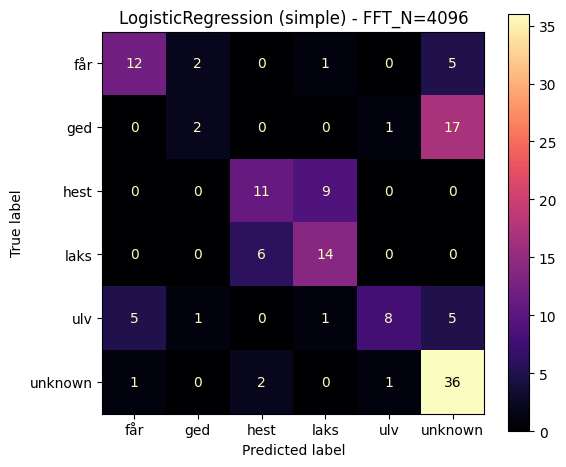


Model: LinearSVM, Features: simple [FFT_N=4096]
Number of features: 9
Accuracy: 0.5714285714285714
              precision    recall  f1-score   support

         får       0.72      0.65      0.68        20
         ged       0.00      0.00      0.00        20
        hest       0.62      0.65      0.63        20
        laks       0.53      0.50      0.51        20
         ulv       0.86      0.30      0.44        20
     unknown       0.51      0.95      0.66        40

    accuracy                           0.57       140
   macro avg       0.54      0.51      0.49       140
weighted avg       0.53      0.57      0.51       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

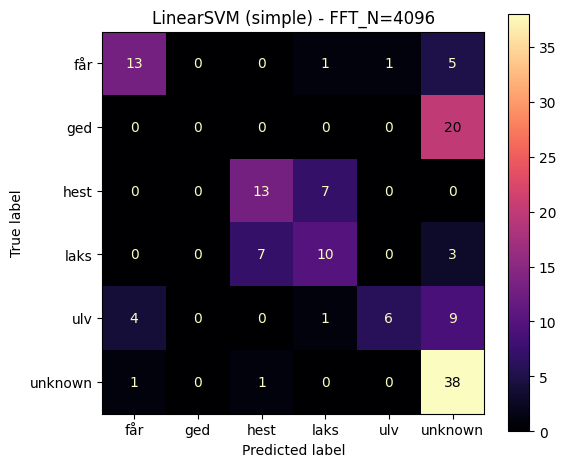


Model: RandomForest, Features: simple [FFT_N=4096]
Number of features: 9
Accuracy: 0.7785714285714286
              precision    recall  f1-score   support

         får       0.89      0.85      0.87        20
         ged       0.88      0.70      0.78        20
        hest       1.00      0.75      0.86        20
        laks       0.73      0.80      0.76        20
         ulv       0.88      0.35      0.50        20
     unknown       0.67      1.00      0.80        40

    accuracy                           0.78       140
   macro avg       0.84      0.74      0.76       140
weighted avg       0.82      0.78      0.77       140



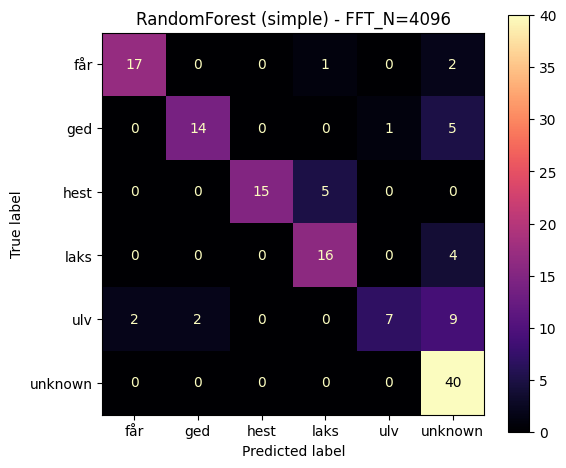


Model: LogisticRegression, Features: mfcc [FFT_N=4096]
Number of features: 13
Accuracy: 0.8
              precision    recall  f1-score   support

         får       0.89      0.85      0.87        20
         ged       1.00      0.70      0.82        20
        hest       1.00      0.70      0.82        20
        laks       0.93      0.70      0.80        20
         ulv       0.82      0.70      0.76        20
     unknown       0.64      0.97      0.77        40

    accuracy                           0.80       140
   macro avg       0.88      0.77      0.81       140
weighted avg       0.85      0.80      0.80       140



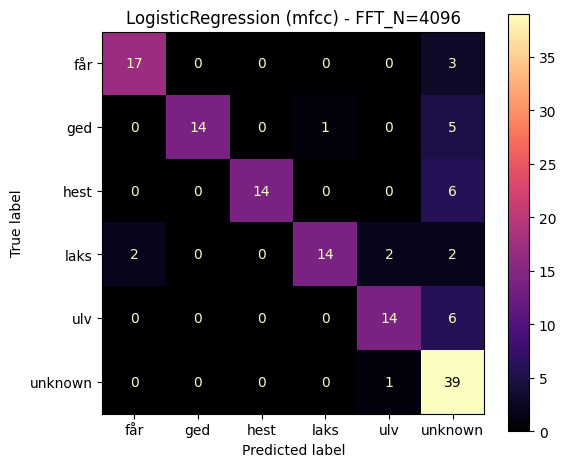


Model: LinearSVM, Features: mfcc [FFT_N=4096]
Number of features: 13
Accuracy: 0.7785714285714286
              precision    recall  f1-score   support

         får       0.94      0.85      0.89        20
         ged       1.00      0.60      0.75        20
        hest       1.00      0.60      0.75        20
        laks       0.93      0.65      0.76        20
         ulv       0.94      0.75      0.83        20
     unknown       0.59      1.00      0.74        40

    accuracy                           0.78       140
   macro avg       0.90      0.74      0.79       140
weighted avg       0.86      0.78      0.78       140



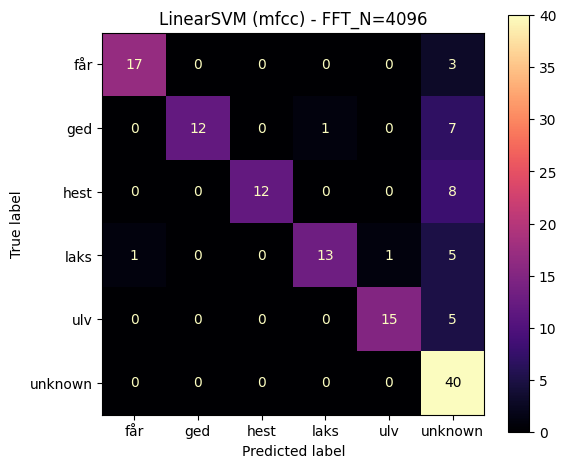


Model: RandomForest, Features: mfcc [FFT_N=4096]
Number of features: 13
Accuracy: 0.6214285714285714
              precision    recall  f1-score   support

         får       0.87      0.65      0.74        20
         ged       1.00      0.65      0.79        20
        hest       1.00      0.35      0.52        20
        laks       0.50      0.05      0.09        20
         ulv       0.93      0.65      0.76        20
     unknown       0.45      1.00      0.62        40

    accuracy                           0.62       140
   macro avg       0.79      0.56      0.59       140
weighted avg       0.74      0.62      0.59       140



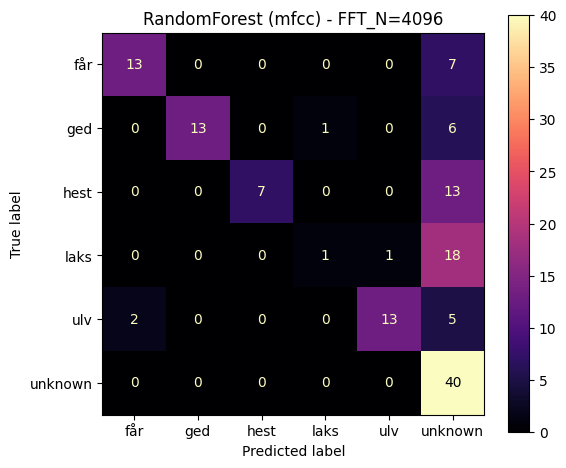


Model: LogisticRegression, Features: mel [FFT_N=4096]
Number of features: 20
Accuracy: 0.2857142857142857
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       0.00      0.00      0.00        20
        hest       0.00      0.00      0.00        20
        laks       0.00      0.00      0.00        20
         ulv       0.00      0.00      0.00        20
     unknown       0.29      1.00      0.44        40

    accuracy                           0.29       140
   macro avg       0.05      0.17      0.07       140
weighted avg       0.08      0.29      0.13       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

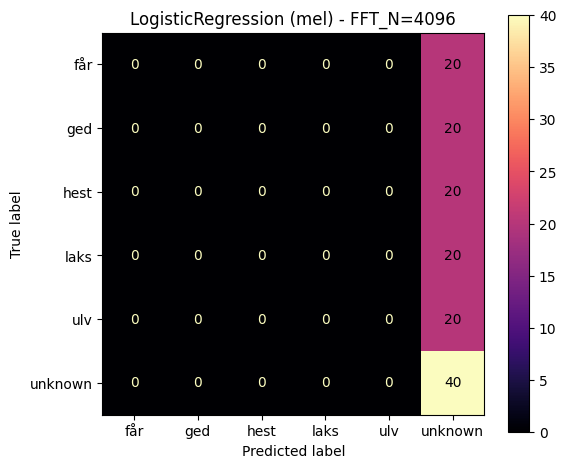


Model: LinearSVM, Features: mel [FFT_N=4096]
Number of features: 20
Accuracy: 0.2857142857142857
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       0.00      0.00      0.00        20
        hest       0.00      0.00      0.00        20
        laks       0.00      0.00      0.00        20
         ulv       0.00      0.00      0.00        20
     unknown       0.29      1.00      0.44        40

    accuracy                           0.29       140
   macro avg       0.05      0.17      0.07       140
weighted avg       0.08      0.29      0.13       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

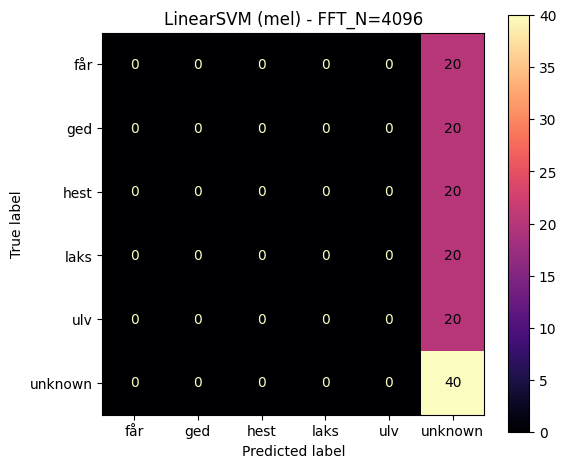


Model: RandomForest, Features: mel [FFT_N=4096]
Number of features: 20
Accuracy: 0.7357142857142858
              precision    recall  f1-score   support

         får       0.95      0.90      0.92        20
         ged       0.93      0.70      0.80        20
        hest       1.00      0.50      0.67        20
        laks       0.67      0.20      0.31        20
         ulv       0.94      0.85      0.89        20
     unknown       0.56      1.00      0.71        40

    accuracy                           0.74       140
   macro avg       0.84      0.69      0.72       140
weighted avg       0.80      0.74      0.72       140



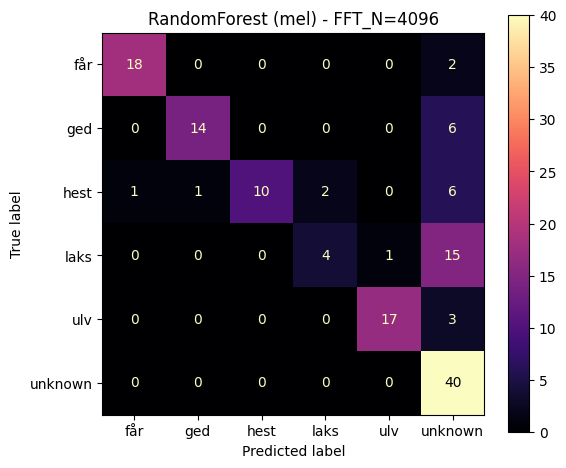


Model: LogisticRegression, Features: mfcc_mel [FFT_N=4096]
Number of features: 33
Accuracy: 0.7714285714285715
              precision    recall  f1-score   support

         får       1.00      0.85      0.92        20
         ged       1.00      0.75      0.86        20
        hest       0.93      0.65      0.76        20
        laks       0.90      0.45      0.60        20
         ulv       0.83      0.75      0.79        20
     unknown       0.59      0.97      0.74        40

    accuracy                           0.77       140
   macro avg       0.88      0.74      0.78       140
weighted avg       0.83      0.77      0.77       140



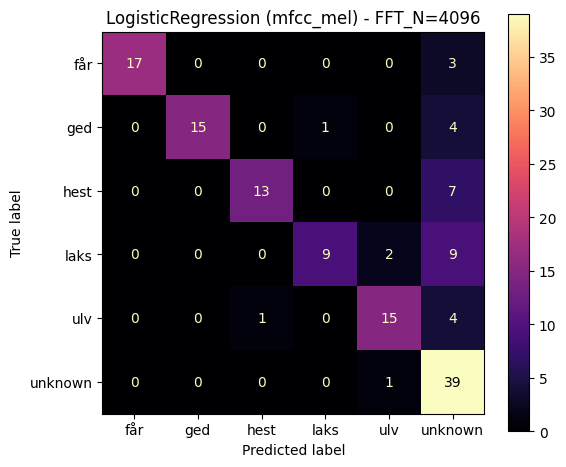


Model: LinearSVM, Features: mfcc_mel [FFT_N=4096]
Number of features: 33
Accuracy: 0.8142857142857143
              precision    recall  f1-score   support

         får       1.00      1.00      1.00        20
         ged       1.00      0.75      0.86        20
        hest       1.00      0.80      0.89        20
        laks       0.89      0.40      0.55        20
         ulv       0.88      0.75      0.81        20
     unknown       0.63      1.00      0.78        40

    accuracy                           0.81       140
   macro avg       0.90      0.78      0.81       140
weighted avg       0.86      0.81      0.81       140



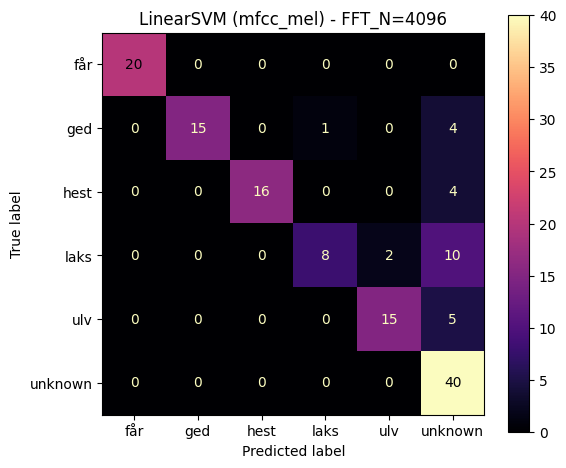


Model: RandomForest, Features: mfcc_mel [FFT_N=4096]
Number of features: 33
Accuracy: 0.7071428571428572
              precision    recall  f1-score   support

         får       0.95      0.90      0.92        20
         ged       1.00      0.65      0.79        20
        hest       1.00      0.55      0.71        20
        laks       0.67      0.10      0.17        20
         ulv       0.83      0.75      0.79        20
     unknown       0.53      1.00      0.69        40

    accuracy                           0.71       140
   macro avg       0.83      0.66      0.68       140
weighted avg       0.79      0.71      0.68       140



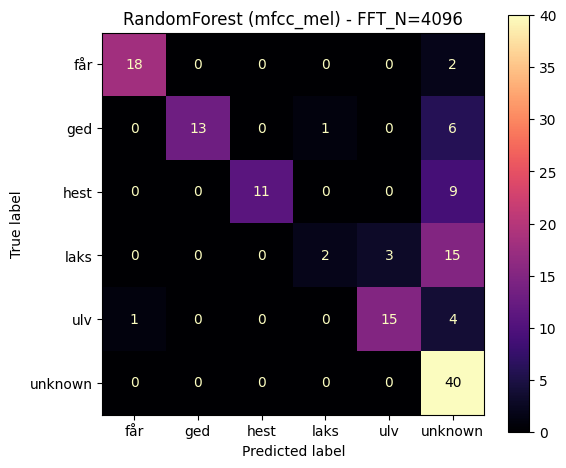


Model: LogisticRegression, Features: combined [FFT_N=4096]
Number of features: 42
Accuracy: 0.8857142857142857
              precision    recall  f1-score   support

         får       0.82      0.90      0.86        20
         ged       1.00      0.80      0.89        20
        hest       0.95      1.00      0.98        20
        laks       1.00      0.90      0.95        20
         ulv       0.94      0.75      0.83        20
     unknown       0.79      0.93      0.85        40

    accuracy                           0.89       140
   macro avg       0.92      0.88      0.89       140
weighted avg       0.90      0.89      0.89       140



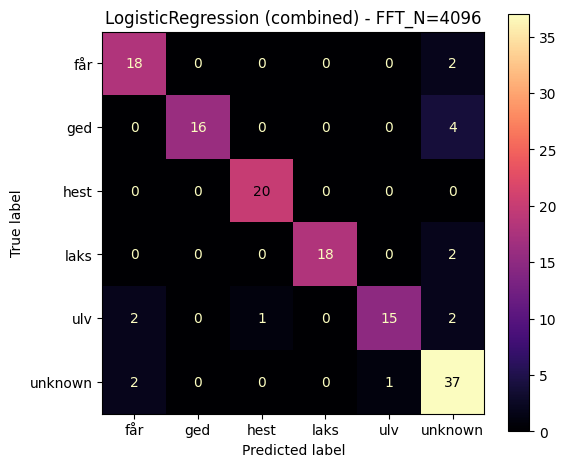


Model: LinearSVM, Features: combined [FFT_N=4096]
Number of features: 42
Accuracy: 0.8857142857142857
              precision    recall  f1-score   support

         får       0.78      0.90      0.84        20
         ged       1.00      0.75      0.86        20
        hest       0.91      1.00      0.95        20
        laks       1.00      0.90      0.95        20
         ulv       1.00      0.75      0.86        20
     unknown       0.81      0.95      0.87        40

    accuracy                           0.89       140
   macro avg       0.92      0.88      0.89       140
weighted avg       0.90      0.89      0.89       140



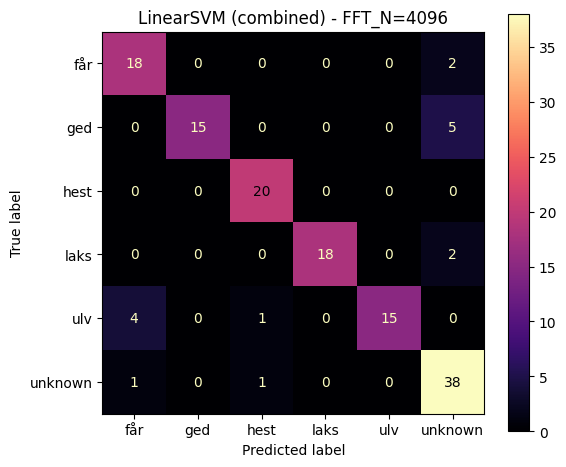


Model: RandomForest, Features: combined [FFT_N=4096]
Number of features: 42
Accuracy: 0.8714285714285714
              precision    recall  f1-score   support

         får       1.00      0.95      0.97        20
         ged       1.00      0.90      0.95        20
        hest       1.00      0.80      0.89        20
        laks       0.80      0.80      0.80        20
         ulv       1.00      0.65      0.79        20
     unknown       0.74      1.00      0.85        40

    accuracy                           0.87       140
   macro avg       0.92      0.85      0.87       140
weighted avg       0.90      0.87      0.87       140



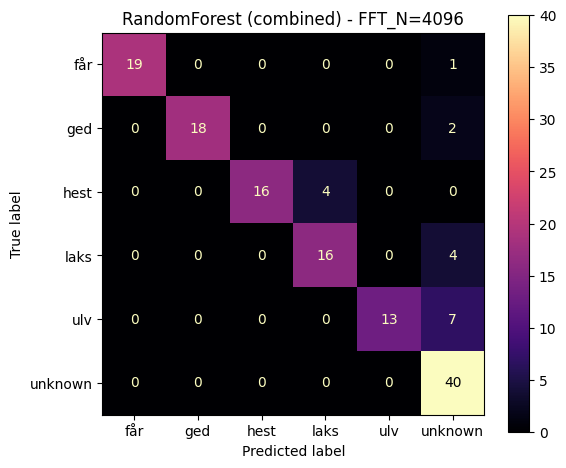


Summary:
                 model  features  n_features  accuracy
13           LinearSVM  combined          42  0.885714
12  LogisticRegression  combined          42  0.885714
14        RandomForest  combined          42  0.871429
10           LinearSVM  mfcc_mel          33  0.814286
3   LogisticRegression      mfcc          13  0.800000
4            LinearSVM      mfcc          13  0.778571
2         RandomForest    simple           9  0.778571
9   LogisticRegression  mfcc_mel          33  0.771429
8         RandomForest       mel          20  0.735714
11        RandomForest  mfcc_mel          33  0.707143
5         RandomForest      mfcc          13  0.621429
0   LogisticRegression    simple           9  0.592857
1            LinearSVM    simple           9  0.571429
6   LogisticRegression       mel          20  0.285714
7            LinearSVM       mel          20  0.285714


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import matplotlib.pyplot as plt

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    confusion_matrix,
    accuracy_score,
    classification_report,
)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("prepared_words")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")
TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
FFT_N = 4096
N_MELS = 20
N_MFCC = 13
EPS = 1e-12

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak
    return x

def prepare_fft_frame(x: np.ndarray, fft_n: int = FFT_N) -> np.ndarray:
    frame = np.zeros(fft_n, dtype=np.float32)
    copy_len = min(len(x), fft_n)
    frame[:copy_len] = x[:copy_len]

    window = np.hanning(fft_n).astype(np.float32)
    frame *= window
    return frame

def magnitude_spectrum(x, fs, fft_n: int = FFT_N):
    frame = prepare_fft_frame(x, fft_n=fft_n)
    spec = np.fft.rfft(frame)
    mag = np.abs(spec).astype(np.float32)
    freqs = np.fft.rfftfreq(fft_n, d=1 / fs).astype(np.float32)
    return freqs, mag

def fft_real_only_power_emlearn_style(x, fs, fft_n: int = FFT_N):
    """
    Matcher eml_audio_power_spectrogram():
    bruger kun realdel af FFT-output og skalerer med 1/n_fft
    """
    frame = prepare_fft_frame(x, fft_n=fft_n)
    spec = np.fft.rfft(frame)
    real_part = np.real(spec).astype(np.float32)
    power = (np.abs(real_part) ** 2) / float(fft_n)
    freqs = np.fft.rfftfreq(fft_n, d=1 / fs).astype(np.float32)
    return freqs, power

def hz_to_mel(hz: float) -> float:
    return 2595.0 * np.log10(1.0 + hz / 700.0)

def mel_to_hz(mels: float) -> float:
    return 700.0 * (10.0 ** (mels / 2595.0) - 1.0)

def eml_audio_mel_center(n: int, n_mels: int, fmin: float, fmax: float) -> float:
    melmin = hz_to_mel(fmin)
    melmax = hz_to_mel(fmax)
    melstep = (melmax - melmin) / (n_mels + 1)
    mel = melmin + (n * melstep)
    return mel_to_hz(mel)

def eml_audio_mel_bin(hz: float, n_fft: int, samplerate: float) -> int:
    return int(np.floor((n_fft + 1) * (hz / samplerate)))

def eml_fft_freq(k: int, n_fft: int, samplerate: float) -> float:
    end = samplerate / 2.0
    steps = (1 + n_fft // 2) - 1
    return (k * end) / steps

def mel_spectrum_emlearn_style(x, fs, n_mels=N_MELS, fft_n=FFT_N):
    _, spec = fft_real_only_power_emlearn_style(x, fs, fft_n=fft_n)

    fmin = 0.0
    fmax = fs / 2.0
    max_bin = 1 + fft_n // 2

    mels = np.zeros(n_mels, dtype=np.float32)

    for m in range(1, n_mels + 1):
        left_hz = eml_audio_mel_center(m - 1, n_mels, fmin, fmax)
        center_hz = eml_audio_mel_center(m, n_mels, fmin, fmax)
        right_hz = eml_audio_mel_center(m + 1, n_mels, fmin, fmax)

        left = eml_audio_mel_bin(left_hz, fft_n, fs)
        center = eml_audio_mel_bin(center_hz, fft_n, fs)
        right = eml_audio_mel_bin(right_hz, fft_n, fs)

        left = max(0, min(left, max_bin - 1))
        center = max(0, min(center, max_bin - 1))
        right = max(0, min(right, max_bin - 1))

        fdifflow = center_hz - left_hz
        fdiffupper = right_hz - center_hz

        val = 0.0

        for k in range(left, center + 1):
            r = left_hz - eml_fft_freq(k, fft_n, fs)
            weight = max(min(-r / fdifflow if fdifflow != 0 else 0.0, 1.0), 0.0)
            val += spec[k] * weight

        for k in range(center, right):
            if k + 1 >= len(spec):
                break
            r = right_hz - eml_fft_freq(k + 1, fft_n, fs)
            weight = max(min(r / fdiffupper if fdiffupper != 0 else 0.0, 1.0), 0.0)
            val += spec[k + 1] * weight

        mels[m - 1] = val

    return mels

def dct_type_2(x: np.ndarray, n_out: int) -> np.ndarray:
    n = len(x)
    out = np.zeros(n_out, dtype=np.float32)
    for k in range(n_out):
        s = 0.0
        for m in range(n):
            s += x[m] * np.cos(np.pi * k * (m + 0.5) / n)
        out[k] = s
    return out

def mfcc_features_emlearn_style(x, fs, n_mfcc=N_MFCC, n_mels=N_MELS, fft_n=FFT_N):
    mel = mel_spectrum_emlearn_style(x, fs, n_mels=n_mels, fft_n=fft_n)
    log_mel = np.log(mel + EPS)
    mfcc = dct_type_2(log_mel, n_mfcc)
    return mfcc.astype(np.float32)

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mel_vals = mel_spectrum_emlearn_style(x, fs, n_mels=N_MELS, fft_n=FFT_N)
    for i, val in enumerate(mel_vals, start=1):
        record[f"mel_{i}"] = float(val)

    mfcc_vals = mfcc_features_emlearn_style(x, fs, n_mfcc=N_MFCC, n_mels=N_MELS, fft_n=FFT_N)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD DATAFRAMES
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    record["filename"] = wav_path.name
    train_records.append(record)

train_df = pd.DataFrame(train_records)

test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        test_records.append(record)

test_df = pd.DataFrame(test_records)

# =========================
# FEATURE SETS
# =========================
simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]
mel_feature_cols = [f"mel_{i}" for i in range(1, N_MELS + 1)]
mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]

feature_sets = {
    "simple": simple_features,
    "mfcc": mfcc_feature_cols,
    "mel": mel_feature_cols,
    "mfcc_mel": mfcc_feature_cols + mel_feature_cols,
    "combined": simple_features + mfcc_feature_cols + mel_feature_cols,
}

# =========================
# MODELS
# =========================
models = {
    "LogisticRegression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=3000)
    ),
    "LinearSVM": make_pipeline(
        StandardScaler(),
        LinearSVC()
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=3,
        random_state=42
    ),
}

# =========================
# TRAIN / EVALUATE
# =========================
results = []

for feat_name, feat_cols in feature_sets.items():
    X_train = train_df[feat_cols]
    y_train = train_df["activity"]

    X_test = test_df[feat_cols]
    y_test = test_df["activity"]

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        results.append({
            "model": model_name,
            "features": feat_name,
            "n_features": len(feat_cols),
            "accuracy": acc
        })

        print(f"\nModel: {model_name}, Features: {feat_name} [FFT_N={FFT_N}]")
        print(f"Number of features: {len(feat_cols)}")
        print("Accuracy:", acc)
        print(classification_report(y_test, y_pred, labels=ALL_LABELS))

        cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=ALL_LABELS
        )

        fig, ax = plt.subplots(figsize=(6, 5))
        disp.plot(ax=ax, cmap="magma", values_format="d")
        plt.title(f"{model_name} ({feat_name}) - FFT_N={FFT_N}")
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
print("\nSummary:")
print(results_df.sort_values("accuracy", ascending=False))

# Inferencing gav problemer --> Prøvede at optage test data igen hos CHjem
Med dette output f.eks. af inference-koden (som man kan se i "2_ringbuffer"):

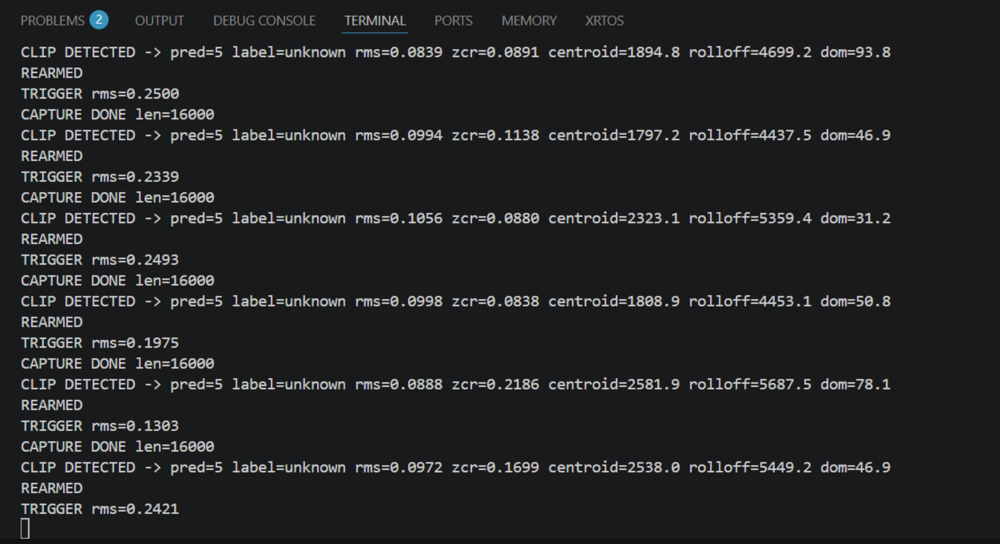

Så får jeg at den noglegange kan detekterer mine ord, jeg ved ikke om det er rent tilfældigt, pga. støj som minder om keywordet eller om jeg er heldig med timing med segmentationen og udtalelsen er korrekt samtidigt, så modellen kan forstå det. 

Men jeg vil prøve at optage mit test datasæt igennem en gang til, altså med den strategi, miljø, osv. som denne model er bygget op omkring. Hvis jeg får noglelunde samme CM som det jeg så med den tidligere test data, så kan jeg næsten isolerer at modellen er fejlen her. 
Hvis accuracy er dårlig, så er de nye optagelser ikke matcher træningsdata særlig meget, som det gjorde den anden dag, hvor jeg fik en god CM. 

hertil er det vigtigt at vi skal have samme
- mic
- sample rate
- strategi for optagelser (140 samples)
- slicing strategi

# Nye test ved "Chjem"

Åh nej.. 

Der er problemer, fordi at det her er den CM jeg får ud, når det er de nye optagelser (med lidt undulat i baggrunden), men ellers optager jeg ellers efter planen:

DERUDOVER HAR JEG IKKE MANUELT KLIPPET NOGLE STØJELEMENTER FRA, SÅ JEG SØRGER FOR AT SLICING ER MEGET GODT
- DET ER EN ENORM VIGTIG DETALJE 


Model: LogisticRegression, Features: simple [FFT_N=4096]
Number of features: 9
Accuracy: 0.38571428571428573
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       0.00      0.00      0.00        20
        hest       0.45      0.75      0.57        20
        laks       1.00      0.05      0.10        20
         ulv       0.00      0.00      0.00        20
     unknown       0.37      0.95      0.53        40

    accuracy                           0.39       140
   macro avg       0.30      0.29      0.20       140
weighted avg       0.31      0.39      0.25       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

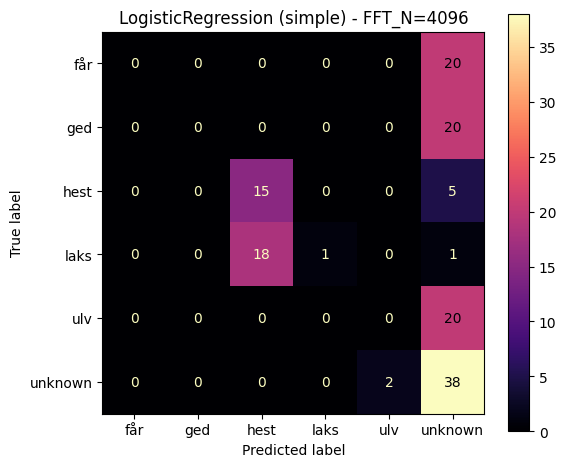


Model: LinearSVM, Features: simple [FFT_N=4096]
Number of features: 9
Accuracy: 0.35
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       0.00      0.00      0.00        20
        hest       0.32      0.40      0.36        20
        laks       1.00      0.10      0.18        20
         ulv       0.00      0.00      0.00        20
     unknown       0.35      0.97      0.51        40

    accuracy                           0.35       140
   macro avg       0.28      0.25      0.18       140
weighted avg       0.29      0.35      0.22       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

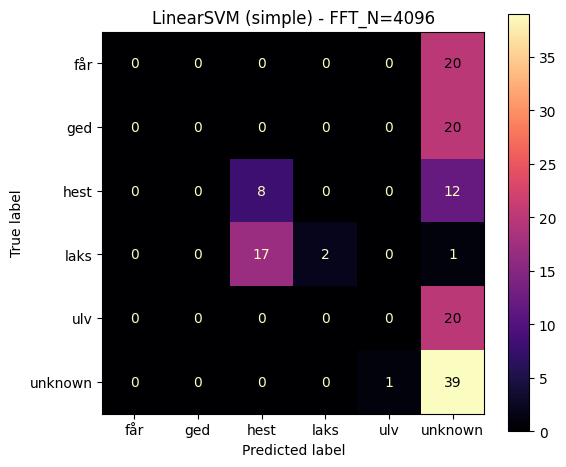


Model: RandomForest, Features: simple [FFT_N=4096]
Number of features: 9
Accuracy: 0.4
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       1.00      0.10      0.18        20
        hest       1.00      0.15      0.26        20
        laks       1.00      0.55      0.71        20
         ulv       0.00      0.00      0.00        20
     unknown       0.32      1.00      0.49        40

    accuracy                           0.40       140
   macro avg       0.55      0.30      0.27       140
weighted avg       0.52      0.40      0.30       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

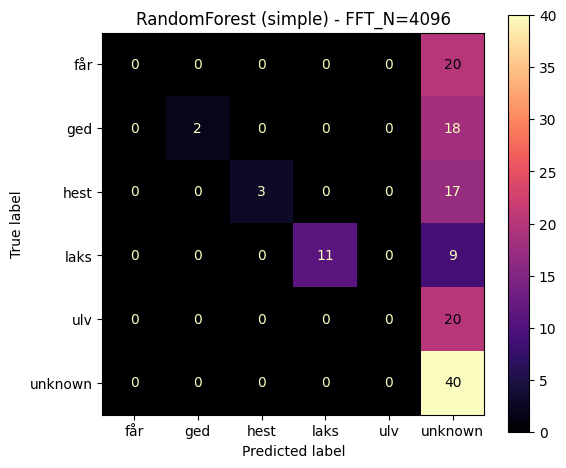


Model: LogisticRegression, Features: mfcc [FFT_N=4096]
Number of features: 13
Accuracy: 0.5571428571428572
              precision    recall  f1-score   support

         får       1.00      0.05      0.10        20
         ged       1.00      0.65      0.79        20
        hest       0.77      0.50      0.61        20
        laks       0.90      0.45      0.60        20
         ulv       0.78      0.35      0.48        20
     unknown       0.40      0.95      0.57        40

    accuracy                           0.56       140
   macro avg       0.81      0.49      0.52       140
weighted avg       0.75      0.56      0.53       140



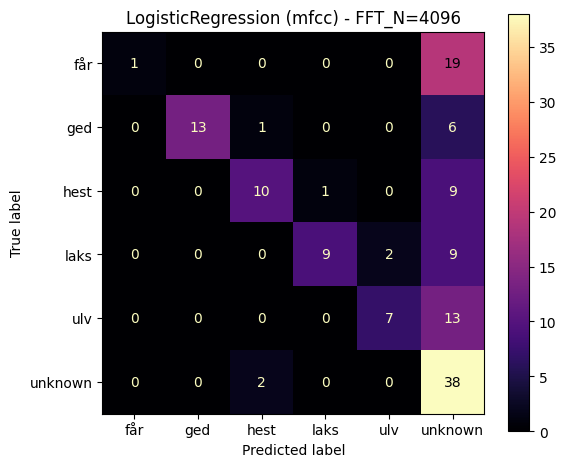


Model: LinearSVM, Features: mfcc [FFT_N=4096]
Number of features: 13
Accuracy: 0.5
              precision    recall  f1-score   support

         får       1.00      0.05      0.10        20
         ged       1.00      0.70      0.82        20
        hest       1.00      0.05      0.10        20
        laks       0.88      0.35      0.50        20
         ulv       0.88      0.35      0.50        20
     unknown       0.37      1.00      0.54        40

    accuracy                           0.50       140
   macro avg       0.85      0.42      0.43       140
weighted avg       0.78      0.50      0.44       140



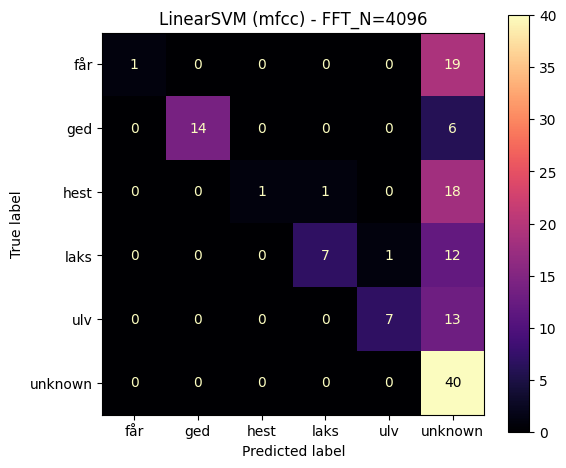


Model: RandomForest, Features: mfcc [FFT_N=4096]
Number of features: 13
Accuracy: 0.5714285714285714
              precision    recall  f1-score   support

         får       1.00      0.50      0.67        20
         ged       0.92      0.55      0.69        20
        hest       1.00      0.45      0.62        20
        laks       0.00      0.00      0.00        20
         ulv       1.00      0.50      0.67        20
     unknown       0.40      1.00      0.58        40

    accuracy                           0.57       140
   macro avg       0.72      0.50      0.54       140
weighted avg       0.67      0.57      0.54       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

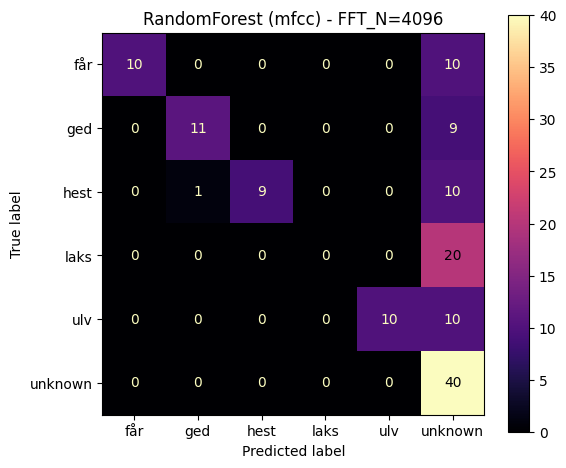


Model: LogisticRegression, Features: mel [FFT_N=4096]
Number of features: 20
Accuracy: 0.2857142857142857
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       0.00      0.00      0.00        20
        hest       0.00      0.00      0.00        20
        laks       0.00      0.00      0.00        20
         ulv       0.00      0.00      0.00        20
     unknown       0.29      1.00      0.44        40

    accuracy                           0.29       140
   macro avg       0.05      0.17      0.07       140
weighted avg       0.08      0.29      0.13       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

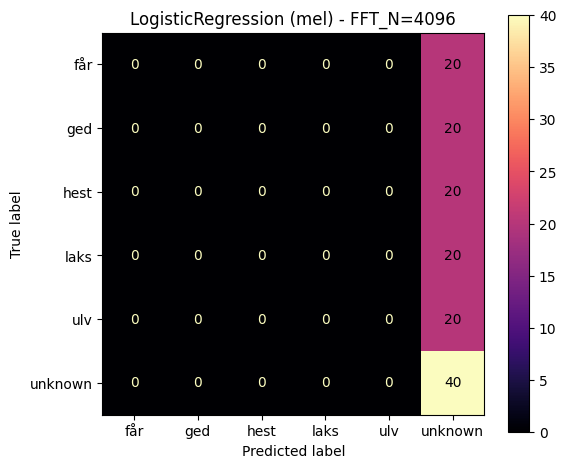


Model: LinearSVM, Features: mel [FFT_N=4096]
Number of features: 20
Accuracy: 0.2857142857142857
              precision    recall  f1-score   support

         får       0.00      0.00      0.00        20
         ged       0.00      0.00      0.00        20
        hest       0.00      0.00      0.00        20
        laks       0.00      0.00      0.00        20
         ulv       0.00      0.00      0.00        20
     unknown       0.29      1.00      0.44        40

    accuracy                           0.29       140
   macro avg       0.05      0.17      0.07       140
weighted avg       0.08      0.29      0.13       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

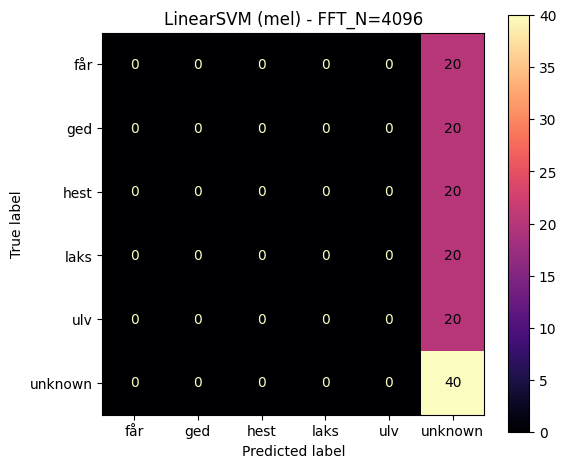


Model: RandomForest, Features: mel [FFT_N=4096]
Number of features: 20
Accuracy: 0.5214285714285715
              precision    recall  f1-score   support

         får       1.00      0.30      0.46        20
         ged       1.00      0.45      0.62        20
        hest       0.93      0.65      0.76        20
        laks       0.00      0.00      0.00        20
         ulv       1.00      0.25      0.40        20
     unknown       0.38      1.00      0.55        40

    accuracy                           0.52       140
   macro avg       0.72      0.44      0.47       140
weighted avg       0.67      0.52      0.48       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

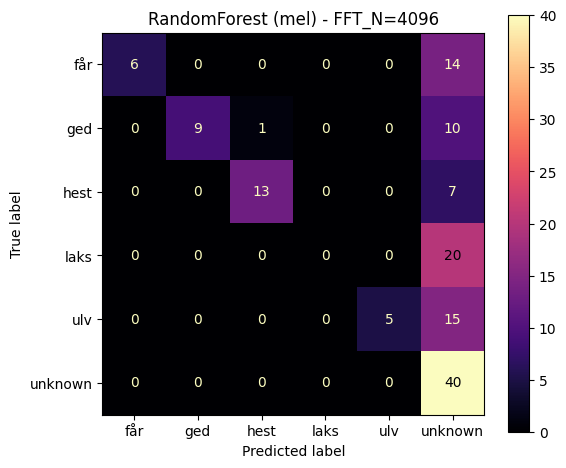


Model: LogisticRegression, Features: mfcc_mel [FFT_N=4096]
Number of features: 33
Accuracy: 0.6428571428571429
              precision    recall  f1-score   support

         får       1.00      0.30      0.46        20
         ged       1.00      0.75      0.86        20
        hest       0.89      0.80      0.84        20
        laks       1.00      0.35      0.52        20
         ulv       0.88      0.35      0.50        20
     unknown       0.45      0.97      0.62        40

    accuracy                           0.64       140
   macro avg       0.87      0.59      0.63       140
weighted avg       0.81      0.64      0.63       140



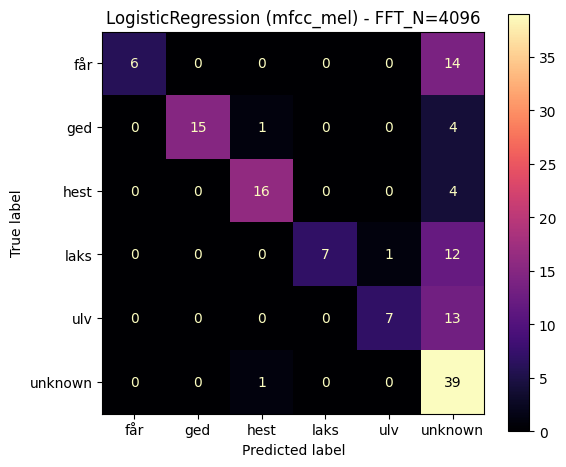


Model: LinearSVM, Features: mfcc_mel [FFT_N=4096]
Number of features: 33
Accuracy: 0.6714285714285714
              precision    recall  f1-score   support

         får       1.00      0.40      0.57        20
         ged       1.00      0.95      0.97        20
        hest       0.95      0.95      0.95        20
        laks       1.00      0.20      0.33        20
         ulv       0.83      0.25      0.38        20
     unknown       0.47      0.97      0.63        40

    accuracy                           0.67       140
   macro avg       0.88      0.62      0.64       140
weighted avg       0.82      0.67      0.64       140



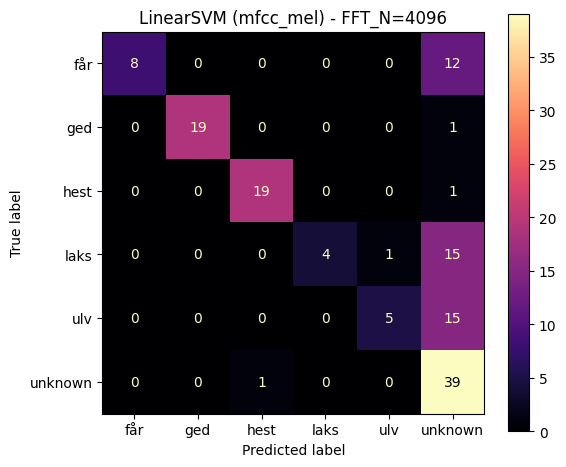


Model: RandomForest, Features: mfcc_mel [FFT_N=4096]
Number of features: 33
Accuracy: 0.5857142857142857
              precision    recall  f1-score   support

         får       1.00      0.35      0.52        20
         ged       1.00      0.60      0.75        20
        hest       1.00      0.70      0.82        20
        laks       0.00      0.00      0.00        20
         ulv       1.00      0.45      0.62        20
     unknown       0.41      1.00      0.58        40

    accuracy                           0.59       140
   macro avg       0.73      0.52      0.55       140
weighted avg       0.69      0.59      0.55       140



c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\chris\anaconda3\envs\tinyml\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

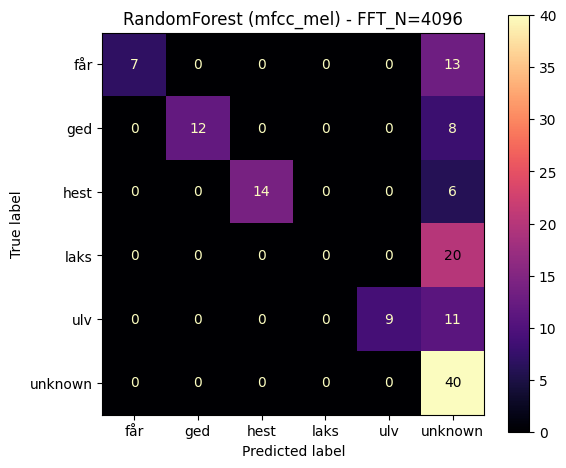


Model: LogisticRegression, Features: combined [FFT_N=4096]
Number of features: 42
Accuracy: 0.6714285714285714
              precision    recall  f1-score   support

         får       1.00      0.40      0.57        20
         ged       1.00      0.40      0.57        20
        hest       1.00      0.95      0.97        20
        laks       1.00      0.75      0.86        20
         ulv       1.00      0.20      0.33        20
     unknown       0.47      1.00      0.63        40

    accuracy                           0.67       140
   macro avg       0.91      0.62      0.66       140
weighted avg       0.85      0.67      0.65       140



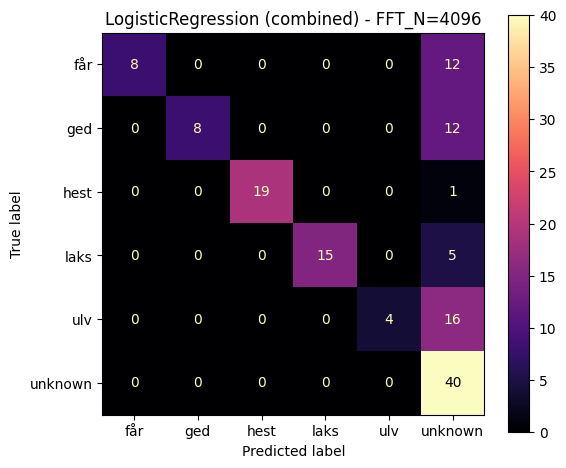


Model: LinearSVM, Features: combined [FFT_N=4096]
Number of features: 42
Accuracy: 0.6714285714285714
              precision    recall  f1-score   support

         får       1.00      0.60      0.75        20
         ged       0.89      0.40      0.55        20
        hest       1.00      0.85      0.92        20
        laks       1.00      0.75      0.86        20
         ulv       1.00      0.15      0.26        20
     unknown       0.46      0.97      0.63        40

    accuracy                           0.67       140
   macro avg       0.89      0.62      0.66       140
weighted avg       0.83      0.67      0.66       140



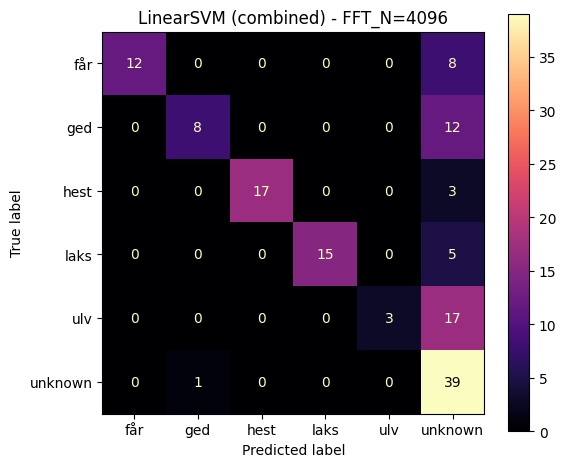


Model: RandomForest, Features: combined [FFT_N=4096]
Number of features: 42
Accuracy: 0.4785714285714286
              precision    recall  f1-score   support

         får       1.00      0.05      0.10        20
         ged       1.00      0.45      0.62        20
        hest       1.00      0.15      0.26        20
        laks       1.00      0.55      0.71        20
         ulv       1.00      0.15      0.26        20
     unknown       0.35      1.00      0.52        40

    accuracy                           0.48       140
   macro avg       0.89      0.39      0.41       140
weighted avg       0.82      0.48      0.43       140



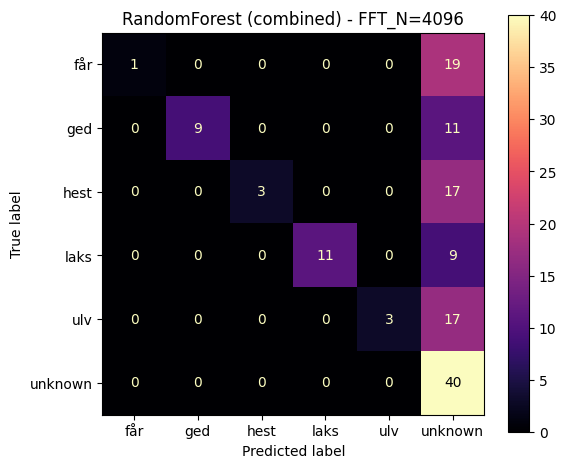


Summary:
                 model  features  n_features  accuracy
13           LinearSVM  combined          42  0.671429
12  LogisticRegression  combined          42  0.671429
10           LinearSVM  mfcc_mel          33  0.671429
9   LogisticRegression  mfcc_mel          33  0.642857
11        RandomForest  mfcc_mel          33  0.585714
5         RandomForest      mfcc          13  0.571429
3   LogisticRegression      mfcc          13  0.557143
8         RandomForest       mel          20  0.521429
4            LinearSVM      mfcc          13  0.500000
14        RandomForest  combined          42  0.478571
2         RandomForest    simple           9  0.400000
0   LogisticRegression    simple           9  0.385714
1            LinearSVM    simple           9  0.350000
6   LogisticRegression       mel          20  0.285714
7            LinearSVM       mel          20  0.285714


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import matplotlib.pyplot as plt

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    confusion_matrix,
    accuracy_score,
    classification_report,
)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# =========================
# SETTINGS
# =========================
TRAIN_KEYWORDS_DIR = Path("prepared_words")
TRAIN_UNKNOWN_DIR = Path("unknown_balanced")
TEST_DIR = Path("test_ready")

KEYWORD_LABELS = ["får", "ged", "hest", "laks", "ulv"]
ALL_LABELS = KEYWORD_LABELS + ["unknown"]

SAMPLE_RATE = 16000
FFT_N = 4096
N_MELS = 20
N_MFCC = 13
EPS = 1e-12

# =========================
# AUDIO / FEATURE FUNCTIONS
# =========================
def load_wav(path: Path):
    x, fs = sf.read(str(path), always_2d=False)
    x = np.asarray(x, dtype=np.float32)

    if x.ndim > 1:
        x = x.mean(axis=1)

    if fs != SAMPLE_RATE:
        raise ValueError(f"Unexpected sample rate in {path}: {fs}")

    peak = np.max(np.abs(x)) + 1e-9
    x = x / peak
    return x

def prepare_fft_frame(x: np.ndarray, fft_n: int = FFT_N) -> np.ndarray:
    frame = np.zeros(fft_n, dtype=np.float32)
    copy_len = min(len(x), fft_n)
    frame[:copy_len] = x[:copy_len]

    window = np.hanning(fft_n).astype(np.float32)
    frame *= window
    return frame

def magnitude_spectrum(x, fs, fft_n: int = FFT_N):
    frame = prepare_fft_frame(x, fft_n=fft_n)
    spec = np.fft.rfft(frame)
    mag = np.abs(spec).astype(np.float32)
    freqs = np.fft.rfftfreq(fft_n, d=1 / fs).astype(np.float32)
    return freqs, mag

def fft_real_only_power_emlearn_style(x, fs, fft_n: int = FFT_N):
    """
    Matcher eml_audio_power_spectrogram():
    bruger kun realdel af FFT-output og skalerer med 1/n_fft
    """
    frame = prepare_fft_frame(x, fft_n=fft_n)
    spec = np.fft.rfft(frame)
    real_part = np.real(spec).astype(np.float32)
    power = (np.abs(real_part) ** 2) / float(fft_n)
    freqs = np.fft.rfftfreq(fft_n, d=1 / fs).astype(np.float32)
    return freqs, power

def hz_to_mel(hz: float) -> float:
    return 2595.0 * np.log10(1.0 + hz / 700.0)

def mel_to_hz(mels: float) -> float:
    return 700.0 * (10.0 ** (mels / 2595.0) - 1.0)

def eml_audio_mel_center(n: int, n_mels: int, fmin: float, fmax: float) -> float:
    melmin = hz_to_mel(fmin)
    melmax = hz_to_mel(fmax)
    melstep = (melmax - melmin) / (n_mels + 1)
    mel = melmin + (n * melstep)
    return mel_to_hz(mel)

def eml_audio_mel_bin(hz: float, n_fft: int, samplerate: float) -> int:
    return int(np.floor((n_fft + 1) * (hz / samplerate)))

def eml_fft_freq(k: int, n_fft: int, samplerate: float) -> float:
    end = samplerate / 2.0
    steps = (1 + n_fft // 2) - 1
    return (k * end) / steps

def mel_spectrum_emlearn_style(x, fs, n_mels=N_MELS, fft_n=FFT_N):
    _, spec = fft_real_only_power_emlearn_style(x, fs, fft_n=fft_n)

    fmin = 0.0
    fmax = fs / 2.0
    max_bin = 1 + fft_n // 2

    mels = np.zeros(n_mels, dtype=np.float32)

    for m in range(1, n_mels + 1):
        left_hz = eml_audio_mel_center(m - 1, n_mels, fmin, fmax)
        center_hz = eml_audio_mel_center(m, n_mels, fmin, fmax)
        right_hz = eml_audio_mel_center(m + 1, n_mels, fmin, fmax)

        left = eml_audio_mel_bin(left_hz, fft_n, fs)
        center = eml_audio_mel_bin(center_hz, fft_n, fs)
        right = eml_audio_mel_bin(right_hz, fft_n, fs)

        left = max(0, min(left, max_bin - 1))
        center = max(0, min(center, max_bin - 1))
        right = max(0, min(right, max_bin - 1))

        fdifflow = center_hz - left_hz
        fdiffupper = right_hz - center_hz

        val = 0.0

        for k in range(left, center + 1):
            r = left_hz - eml_fft_freq(k, fft_n, fs)
            weight = max(min(-r / fdifflow if fdifflow != 0 else 0.0, 1.0), 0.0)
            val += spec[k] * weight

        for k in range(center, right):
            if k + 1 >= len(spec):
                break
            r = right_hz - eml_fft_freq(k + 1, fft_n, fs)
            weight = max(min(r / fdiffupper if fdiffupper != 0 else 0.0, 1.0), 0.0)
            val += spec[k + 1] * weight

        mels[m - 1] = val

    return mels

def dct_type_2(x: np.ndarray, n_out: int) -> np.ndarray:
    n = len(x)
    out = np.zeros(n_out, dtype=np.float32)
    for k in range(n_out):
        s = 0.0
        for m in range(n):
            s += x[m] * np.cos(np.pi * k * (m + 0.5) / n)
        out[k] = s
    return out

def mfcc_features_emlearn_style(x, fs, n_mfcc=N_MFCC, n_mels=N_MELS, fft_n=FFT_N):
    mel = mel_spectrum_emlearn_style(x, fs, n_mels=n_mels, fft_n=fft_n)
    log_mel = np.log(mel + EPS)
    mfcc = dct_type_2(log_mel, n_mfcc)
    return mfcc.astype(np.float32)

def rms_energy(x):
    return float(np.sqrt(np.mean(x ** 2) + 1e-12))

def zero_crossing_rate(x):
    return float(np.mean(np.signbit(x[1:]) != np.signbit(x[:-1])))

def spectral_centroid(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    return float(np.sum(freqs * mag) / (np.sum(mag) + 1e-12))

def spectral_rolloff(x, fs, roll_percent=0.85):
    freqs, mag = magnitude_spectrum(x, fs)
    cumsum = np.cumsum(mag)
    threshold = roll_percent * cumsum[-1]
    idx = np.searchsorted(cumsum, threshold)
    return float(freqs[min(idx, len(freqs) - 1)])

def dominant_frequency(x, fs):
    freqs, mag = magnitude_spectrum(x, fs)
    idx = np.argmax(mag[1:]) + 1 if len(mag) > 1 else 0
    return float(freqs[idx])

def band_energy(x, fs, f_low, f_high):
    freqs, mag = magnitude_spectrum(x, fs)
    power = mag ** 2
    mask = (freqs >= f_low) & (freqs < f_high)
    return float(np.sum(power[mask]))

def extract_features(x, fs):
    record = {
        "rms": rms_energy(x),
        "zcr": zero_crossing_rate(x),
        "centroid": spectral_centroid(x, fs),
        "rolloff": spectral_rolloff(x, fs),
        "dominant_freq": dominant_frequency(x, fs),
        "band_0_500": band_energy(x, fs, 0, 500),
        "band_500_1500": band_energy(x, fs, 500, 1500),
        "band_1500_3000": band_energy(x, fs, 1500, 3000),
        "band_3000_6000": band_energy(x, fs, 3000, 6000),
    }

    mel_vals = mel_spectrum_emlearn_style(x, fs, n_mels=N_MELS, fft_n=FFT_N)
    for i, val in enumerate(mel_vals, start=1):
        record[f"mel_{i}"] = float(val)

    mfcc_vals = mfcc_features_emlearn_style(x, fs, n_mfcc=N_MFCC, n_mels=N_MELS, fft_n=FFT_N)
    for i, val in enumerate(mfcc_vals, start=1):
        record[f"mfcc_{i}"] = float(val)

    return record

# =========================
# BUILD DATAFRAMES
# =========================
train_records = []

for label in KEYWORD_LABELS:
    for wav_path in sorted((TRAIN_KEYWORDS_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        train_records.append(record)

for wav_path in sorted(TRAIN_UNKNOWN_DIR.glob("*.wav")):
    x = load_wav(wav_path)
    record = extract_features(x, SAMPLE_RATE)
    record["activity"] = "unknown"
    record["filename"] = wav_path.name
    train_records.append(record)

train_df = pd.DataFrame(train_records)

test_records = []

for label in ALL_LABELS:
    for wav_path in sorted((TEST_DIR / label).glob("*.wav")):
        x = load_wav(wav_path)
        record = extract_features(x, SAMPLE_RATE)
        record["activity"] = label
        record["filename"] = wav_path.name
        test_records.append(record)

test_df = pd.DataFrame(test_records)

# =========================
# FEATURE SETS
# =========================
simple_features = [
    "rms", "zcr", "centroid", "rolloff", "dominant_freq",
    "band_0_500", "band_500_1500", "band_1500_3000", "band_3000_6000"
]
mel_feature_cols = [f"mel_{i}" for i in range(1, N_MELS + 1)]
mfcc_feature_cols = [f"mfcc_{i}" for i in range(1, N_MFCC + 1)]

feature_sets = {
    "simple": simple_features,
    "mfcc": mfcc_feature_cols,
    "mel": mel_feature_cols,
    "mfcc_mel": mfcc_feature_cols + mel_feature_cols,
    "combined": simple_features + mfcc_feature_cols + mel_feature_cols,
}

# =========================
# MODELS
# =========================
models = {
    "LogisticRegression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=3000)
    ),
    "LinearSVM": make_pipeline(
        StandardScaler(),
        LinearSVC()
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=3,
        random_state=42
    ),
}

# =========================
# TRAIN / EVALUATE
# =========================
results = []

for feat_name, feat_cols in feature_sets.items():
    X_train = train_df[feat_cols]
    y_train = train_df["activity"]

    X_test = test_df[feat_cols]
    y_test = test_df["activity"]

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        results.append({
            "model": model_name,
            "features": feat_name,
            "n_features": len(feat_cols),
            "accuracy": acc
        })

        print(f"\nModel: {model_name}, Features: {feat_name} [FFT_N={FFT_N}]")
        print(f"Number of features: {len(feat_cols)}")
        print("Accuracy:", acc)
        print(classification_report(y_test, y_pred, labels=ALL_LABELS))

        cm = confusion_matrix(y_test, y_pred, labels=ALL_LABELS)

        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=ALL_LABELS
        )

        fig, ax = plt.subplots(figsize=(6, 5))
        disp.plot(ax=ax, cmap="magma", values_format="d")
        plt.title(f"{model_name} ({feat_name}) - FFT_N={FFT_N}")
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
print("\nSummary:")
print(results_df.sort_values("accuracy", ascending=False))

HERTIL MÅ VI PRØVE
- KIGGE OM MINE NYE OPTAGELSER ER GRIMME --> DER ER DETEKTERET STØJ (SÅSOM AT DEN OPFANGER NOGET ANDET END DET DEN I VIRKELIGHEDEN SKAL) --> FORKLARER JO OGSÅ HVORDAN VORES INFERENCING KODE VIL GØRE DET SAMME
- TAGE NOGLE AF DE GAMLE OPTAGELSER, HVOR JEG IKKE HAR VÆRET INDE MANUELT OG KLIPPE, OG SE HVORDAN CONFUSION MATRIX SER UD
    - FORDI HVIS JEG HAR KLIPPET I DET, SÅ AFSPEJLER DET JO IKKE AT DER KOMMER RÅ DATA IND I MIKROFONEN, HVILKET ER ÅRSAGEN TIL AT KODEN FEJLER MEGET 
    - **DET VAR EN FEJL AT KLIPPE, FORDI JEG IKKE HAVDE TÆNKT OVER AT DET VIL BLIVE ET PROBLEM NÅR VI SKAL LAVE INFERENCING, HVOR DETEKTERING AF TALE IKKE KAN REDIGERES MANUELT --> MEGET VIGTIG OBSERVATION**
    - MEN DET ER MÅSKE OKAY, FORDI AT SÅ KAN VI GÅ I DYBDEN MED AT ANALYSERE MODEL FORSKELLEN ALLIGEVEL, SELVOM AT DEN REPRÆSENTERET TEST DATA ER "FOR GOD" TIL INFERENCING
    - DET KAN OGSÅ VÆRE AT HVIS VI SKULLE VÆRE HELT 100%, AT SÅ SKULLE VI HAVE OPTAGET EN SEPERAT TESTDATASÆT I SAMME BACHELOR LOKALE, SAMME SETUP, MED DEN ENE FORSKEL AT DET UDTALES PÅ EN ANDEN DATO OG SE OM MODELLEN STADIGVÆK KAN VÆRE ROBUST FOR DET --> ELLERS ER DET UD OG FÅ MERE TRÆNINGSDATA --> HVILKET VI IKKE KOMMER TIL!


Nedenunder er med de gamle optagelser uredigeret:

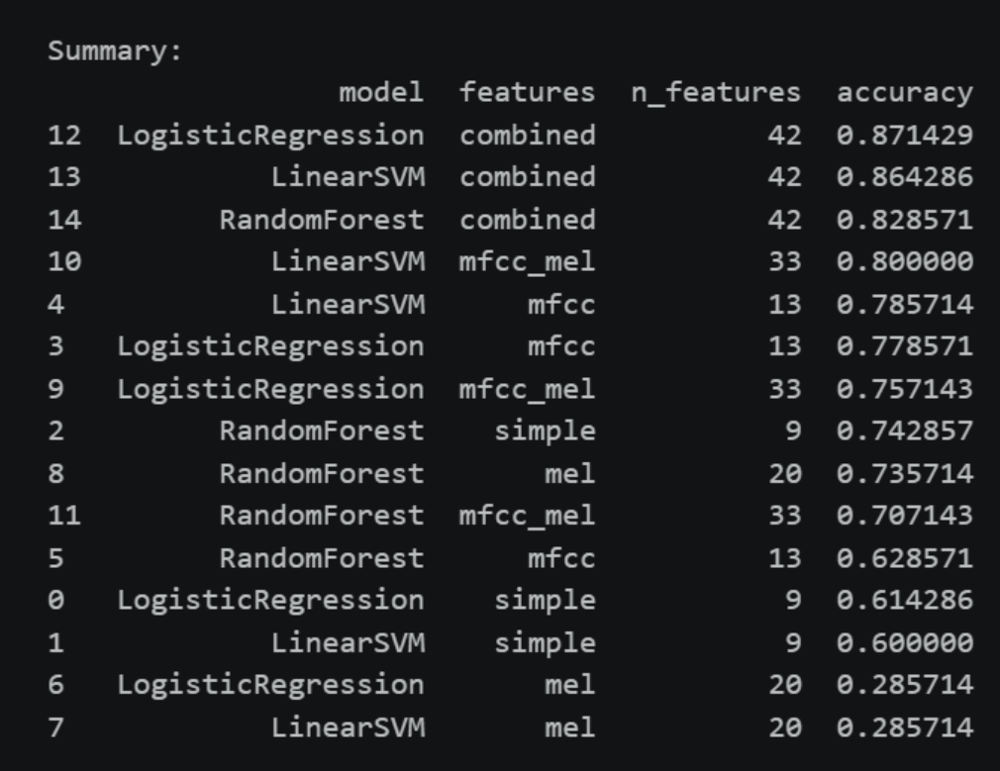

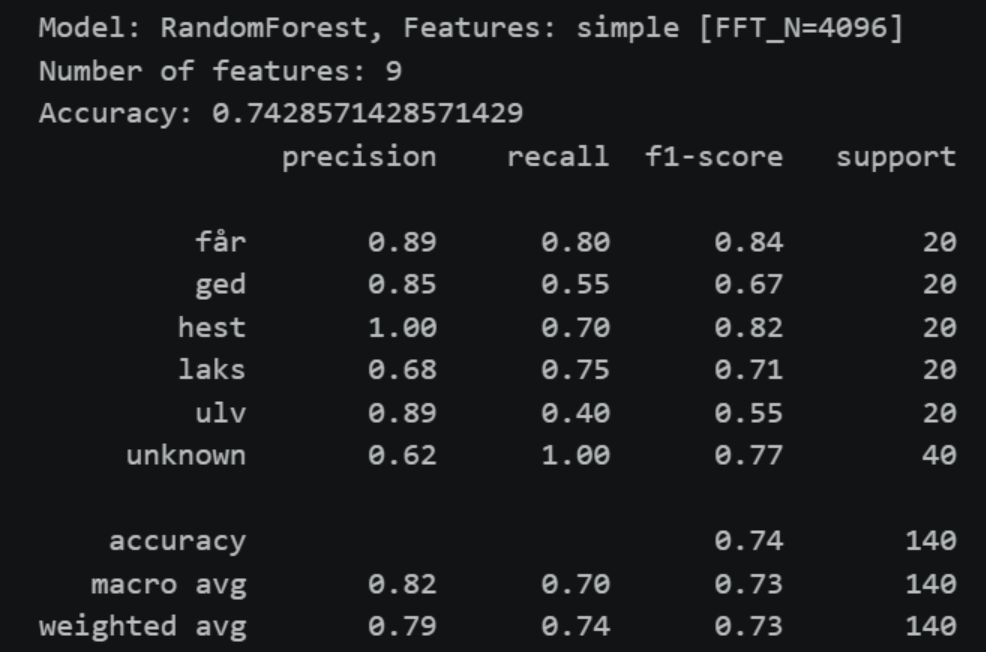

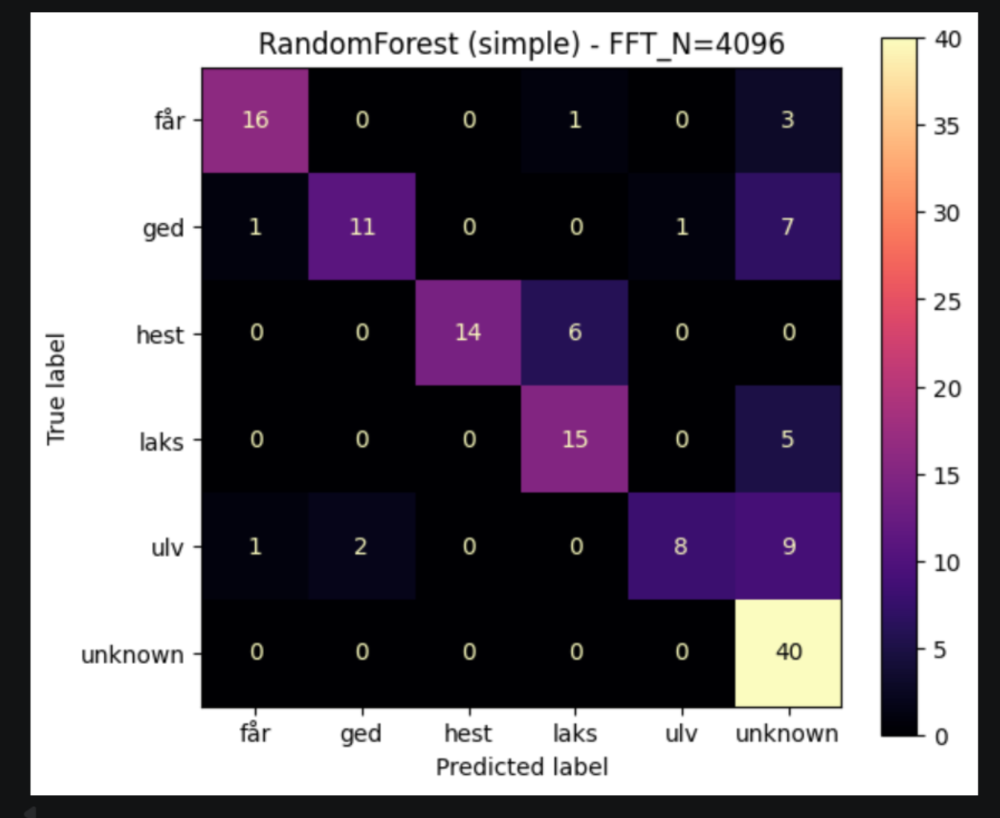

ALTSÅ MHT. RandomForest med simple features, så er det et drop på 3-4% i accuracy --> Ikke betydeligt fejl!?
Altså med forskel i filer, således (redigeret unsliced vs. uredigeret unsliced):
Hvor nedenstående billeder viser kun de filer, hvor der er forskel i længde:

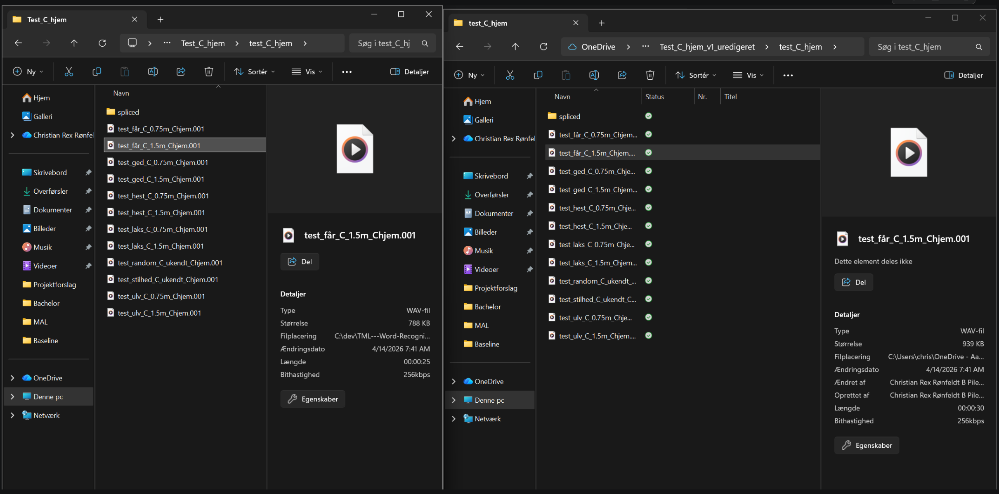

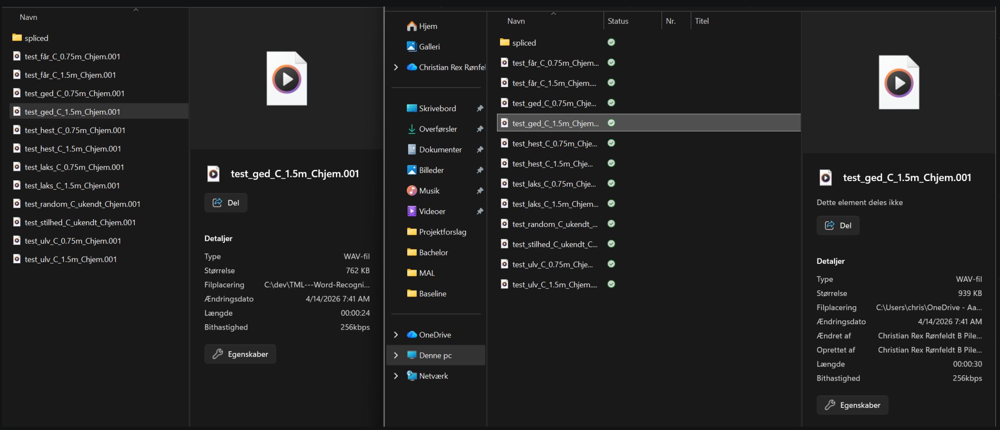

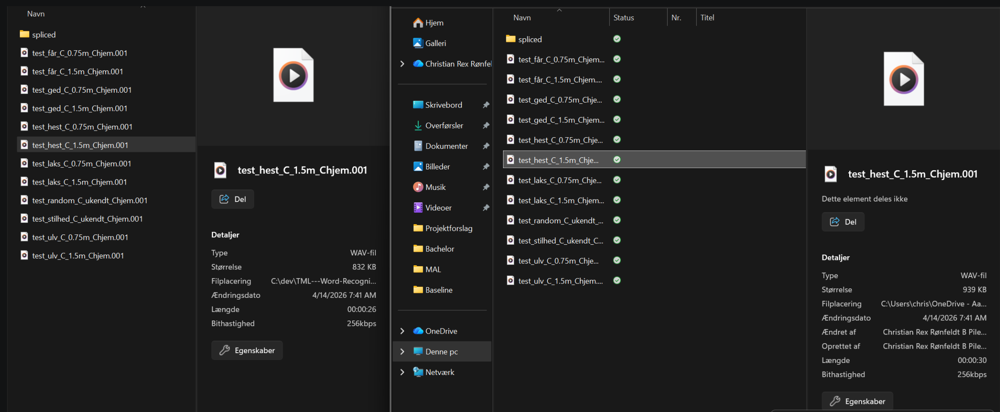

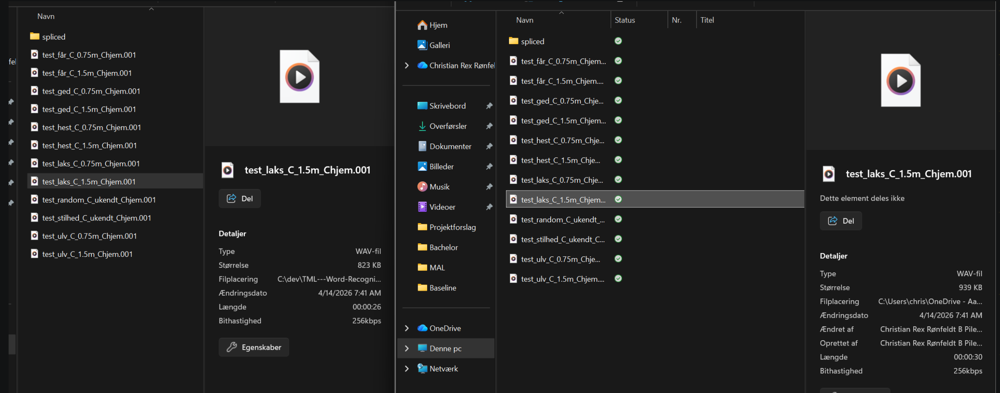

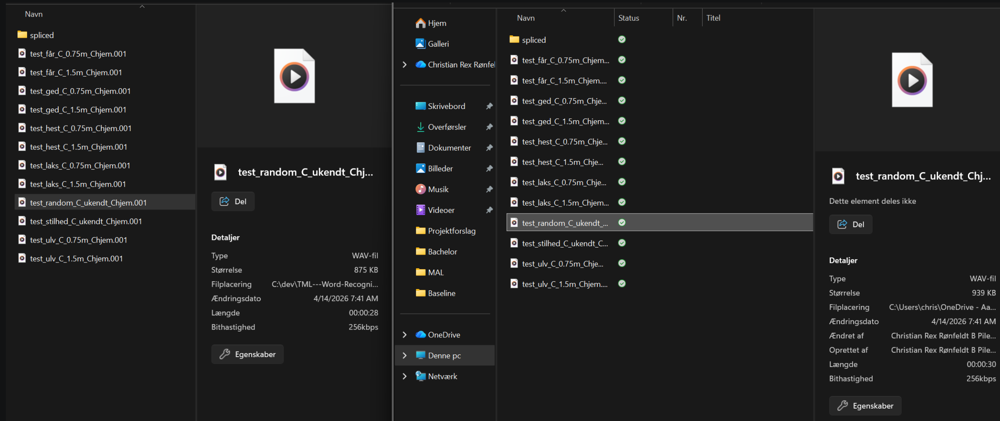

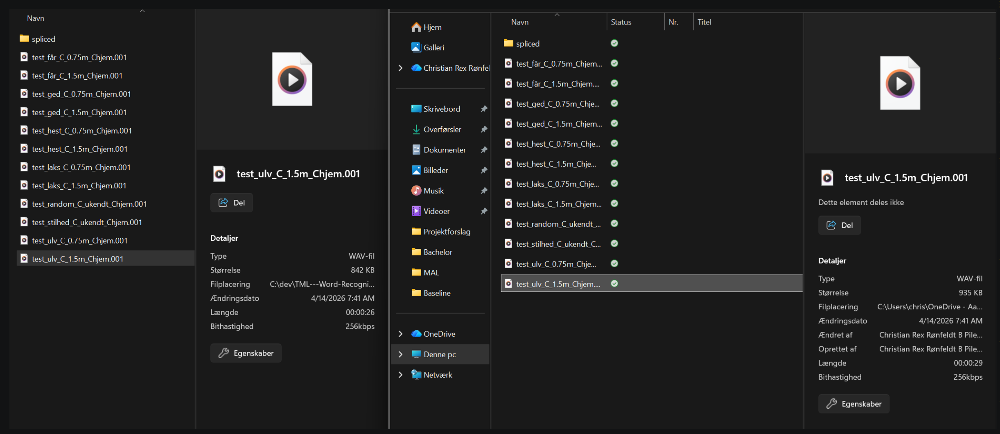

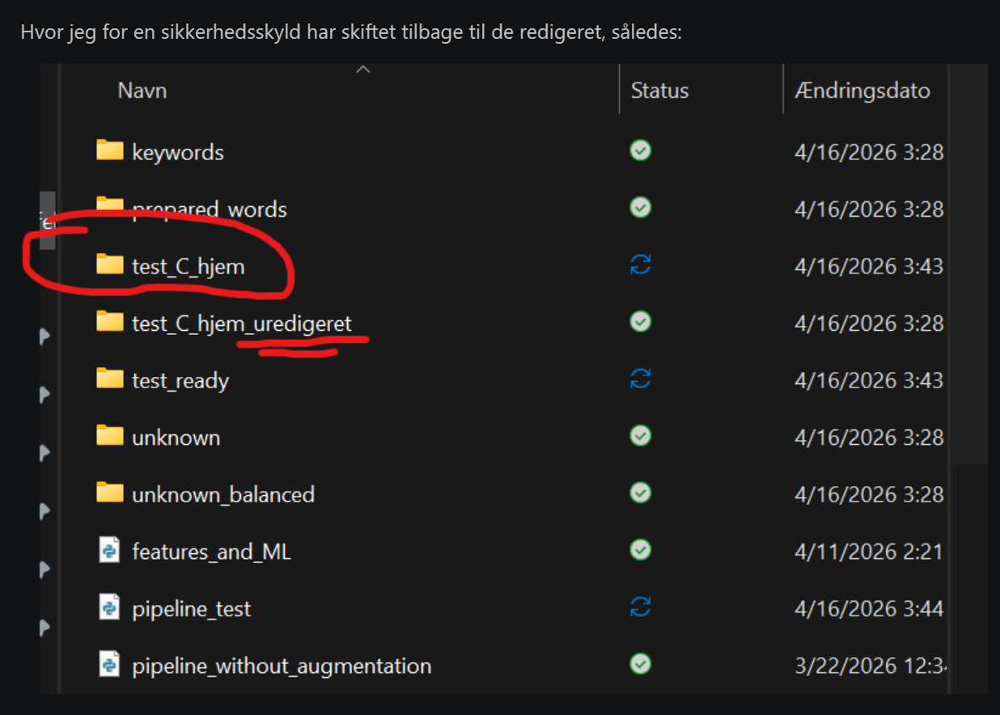

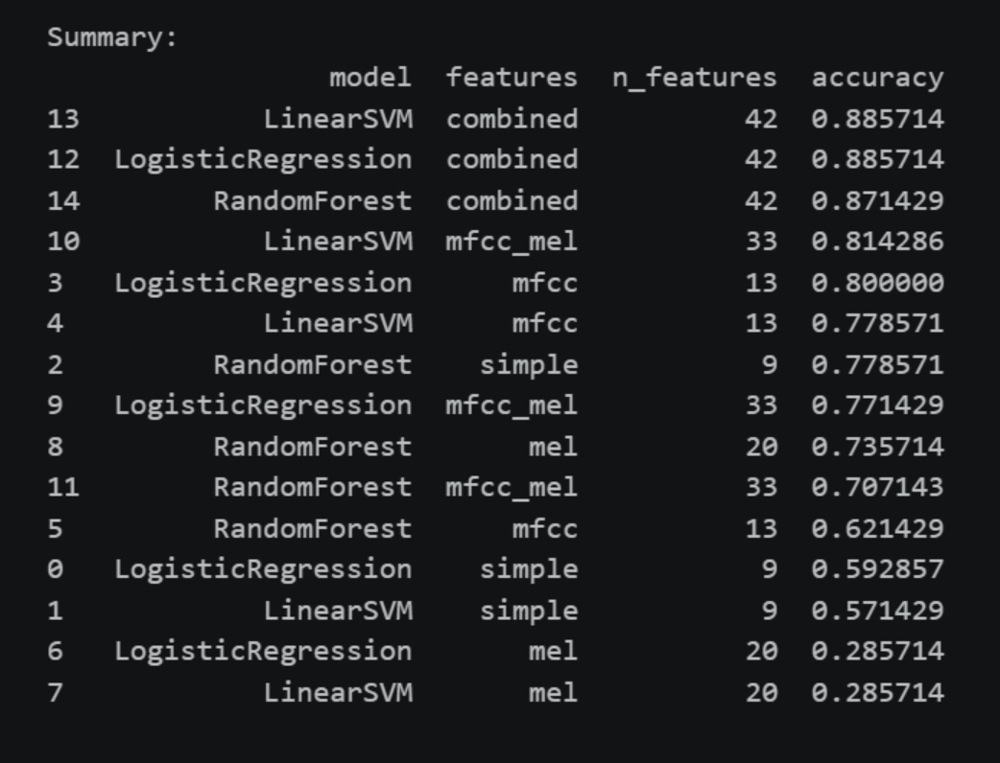

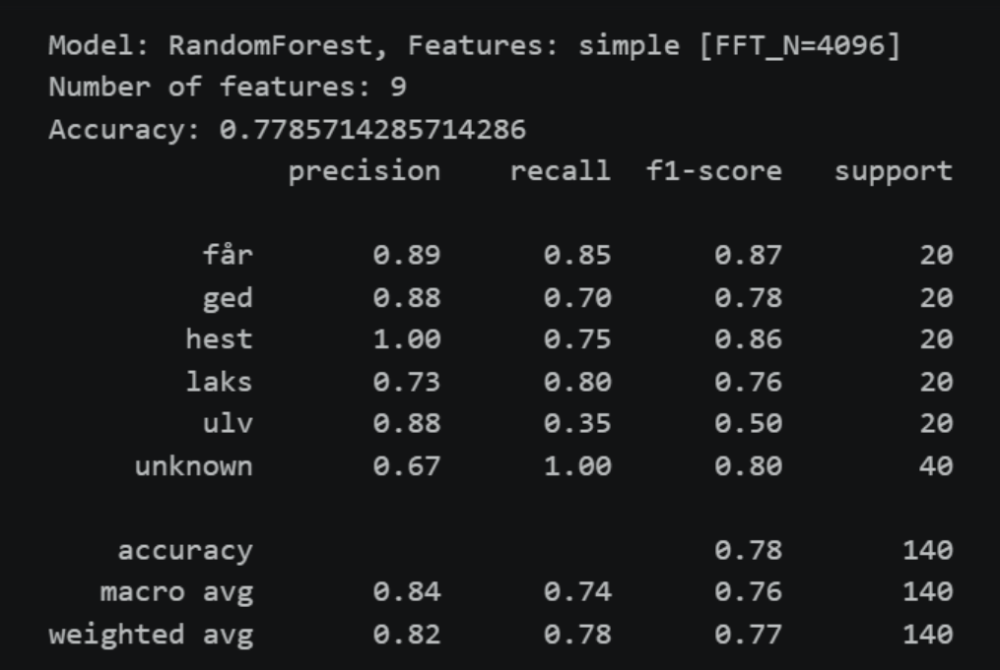

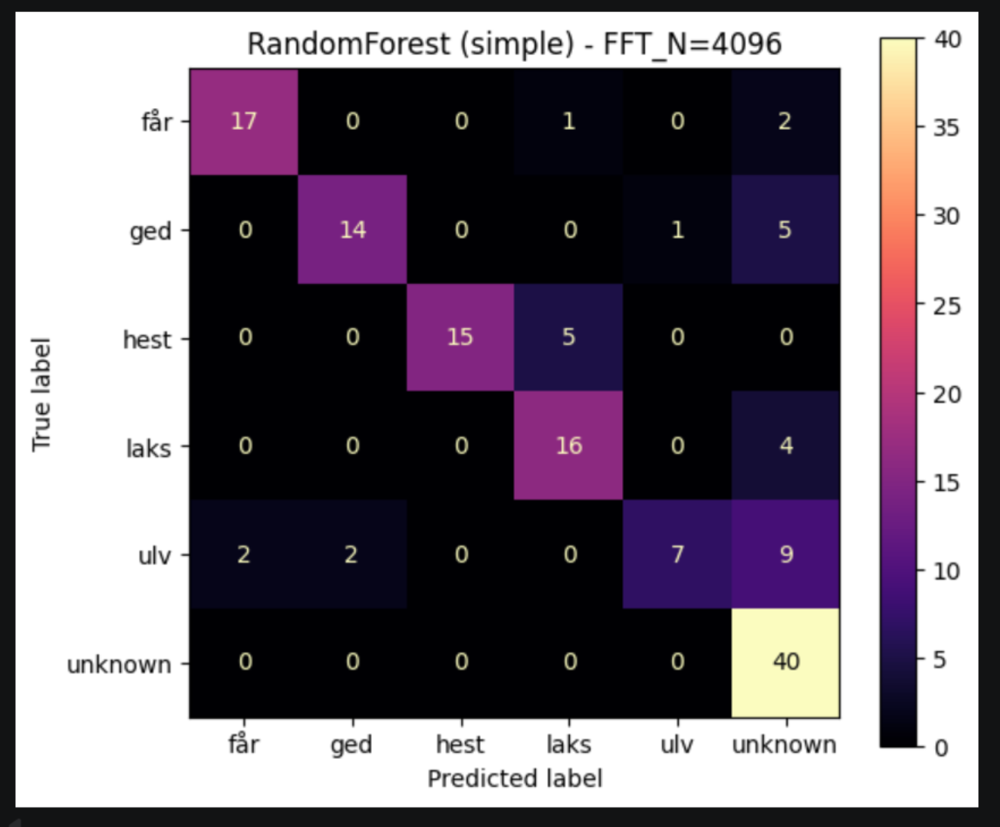



# You know what, I quit trying to make inferencing better!

Det er bedre at vi kan forklarer hvorfor inferencing ikke virker, end at prøve at fikse det. Vi skal trodsalt skrive rapport.

Men tilgengæld kan vi jo stadigvæk godt gå ud fra test datasættet og så lave grundige eksperimenter med at vælge en optimal model ud fra feature og model eksperimenter og så forklarer Pareto-Front, samt se hvordan vi implementerer features og ML modellen på Photon2. Men så at forklarer at pga. at vores model ikke er robust nok (akustisk mæssigt, man skulle have optaget mere til træning, udover de 300 samples vi har i alt, som har kombinationen: 10 gentagelser * (3 speakers * 5 ord * 2 afstande) ) så er det ikke repræsentativt for de mindste ændringer i akustikken, mm.
    - Selvom at vi suspekterede at klik lyden var en af hoved synder, så er akustikken (herunder domæneskift og manglende af akustisk variation (herunder optagelse af forskellige vinkler mod mikrofonen, støj i baggrunden, mm.)) den største hovedsynder.

Nævn altså rækkefølgen af hvordan vi implementeret inferencing, men at jeg bøvlet så meget med C++ implementeringen at jeg ville dobbelttjekke om mit testdata stadigvæk var "relativ god" på 77%. --> Byggede samme test-data struktur, i samme rum (dog med lidt baggrundsstøj, fordi der var nogle hjemme), samt overholdte strategien og generede også 140 samples til test MEN AT JEG FÅR EN DÅRLIGERE ACCURACY!
- Jeg tjekkede før og efter jeg optog at der ikke var klik støj eller lignende, så det er ikke derfor
    - Dog skulle man lave en spektrogram eller genafspilning in real time, for at være helt sikker, fordi at min optagelser ikke begyndte at klik støje alligevel --> Har ikke gemt de inferencing optagelser, ligesom jeg gjorde med TCP dataopsamlingens metoden. 
Men sammenlignede mellem redigeret og uredigeret og accuracy mellem disse to test datasæt faldt med 3-4% --> IKKE FEJLEN, SOM JEG HAVDE REGNET MED

DERMED MÅ VI KONKLUDERE AT OPTAGELSEN JEG LAVEDE FØRSTE GANG JEG VAR HJEMME HOS MIG SELV VAR ÅBENBART GODE DEN DAG, MEN AT DEN ANDEN TEST DATASÆT MED SAMME SETUP METODISK ÅBENBART GJORDE EN KÆMPE AFVIGELSE, SELVOM DET IKKE VAR KLIKSTØJ MEN MINDRE STØJ I BAGGRUNDEN. 
- HERTIL KUNNE MAN SÅ PRØVE AT OPTAGE TEST DATA I BACHELORLOKALET (HVILKET ER DET RUM, SOM TRÆNINGSDATASÆTTET ER OPTAGET I),  MEN MED MIN TIDLIGERE ANTAGELSE OM AT MIT VÆRELSE VAR AKUSTISK MINDENDE OM BACHELORLOKALET OG GAV GOD SCORE, SÅ KUNNE DER STADIGVÆK VÆRE RISIKO FOR AT VORES NYE TESTDATASÆT OGSÅ VILLE FEJLE, IFT. VORES NUVÆRENDE TRÆNINGSDATASÆT. 
- DERFOR SKAL VI HELLERE FOKUSERER PÅ AT BASERET PÅ VORES TRÆNINGS- OG TESTDATASÆT SOM GAV FORNUFTIG NOK SCORES, AT VI SÅ ALLIGEVEL PRØVER AT EKSPERIMENTERE MED MODELVALG OG FEATUREVALG MED PARETO-FRONT ANALYSER --> SAMT FORKLARER AT VI STADIGVÆK KAN KONVERTERER FRA PYTHON TIL C++ OG FÅ NOGLELUNDE SAMME CONFUSION MATRIX. 
    - DET ENESTE SOM FEJLEDE ER AT VORES TRÆNINGSDATA IKKE ER ROBUST NOK, MEN DET ER EN STOR OPGAVE AT FÅ GOD TRÆNINGSDATA PÅ PLADS, SÅ VIL VI HELLERE FOKUSERE PÅ DET VI FAKTISK KAN NÅ I KURSET

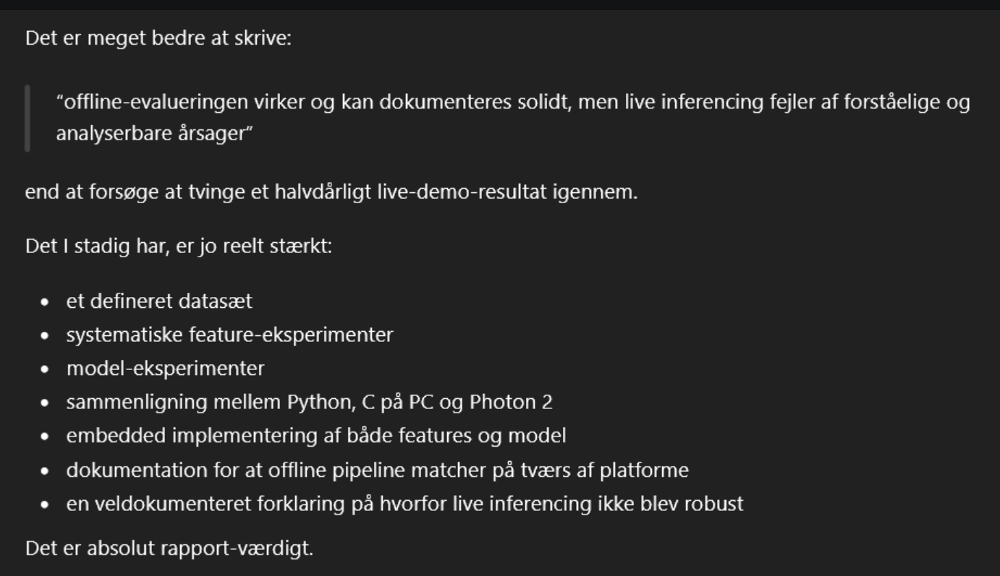

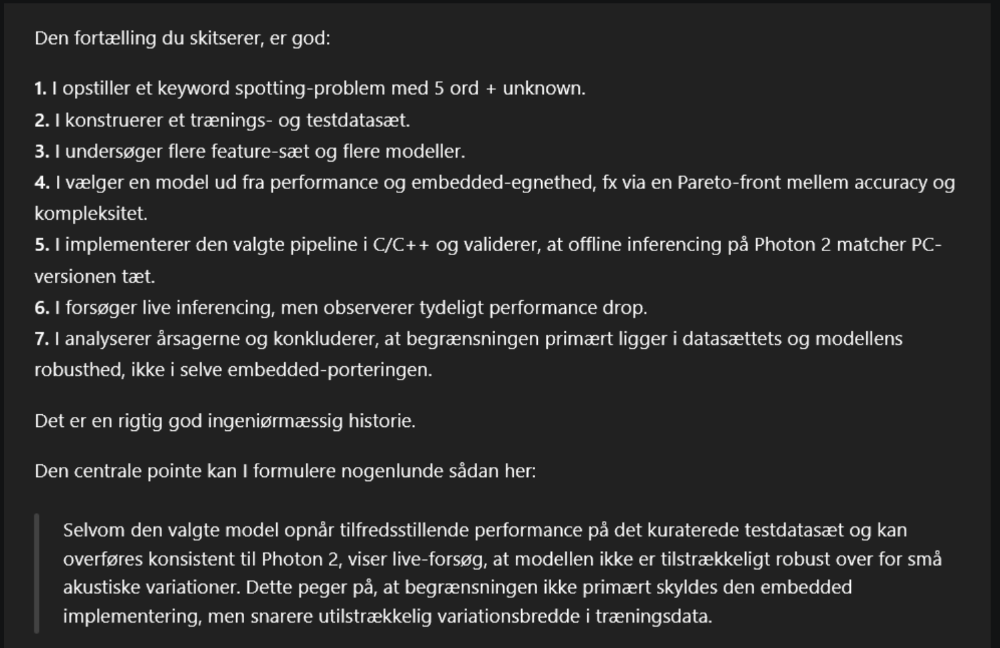

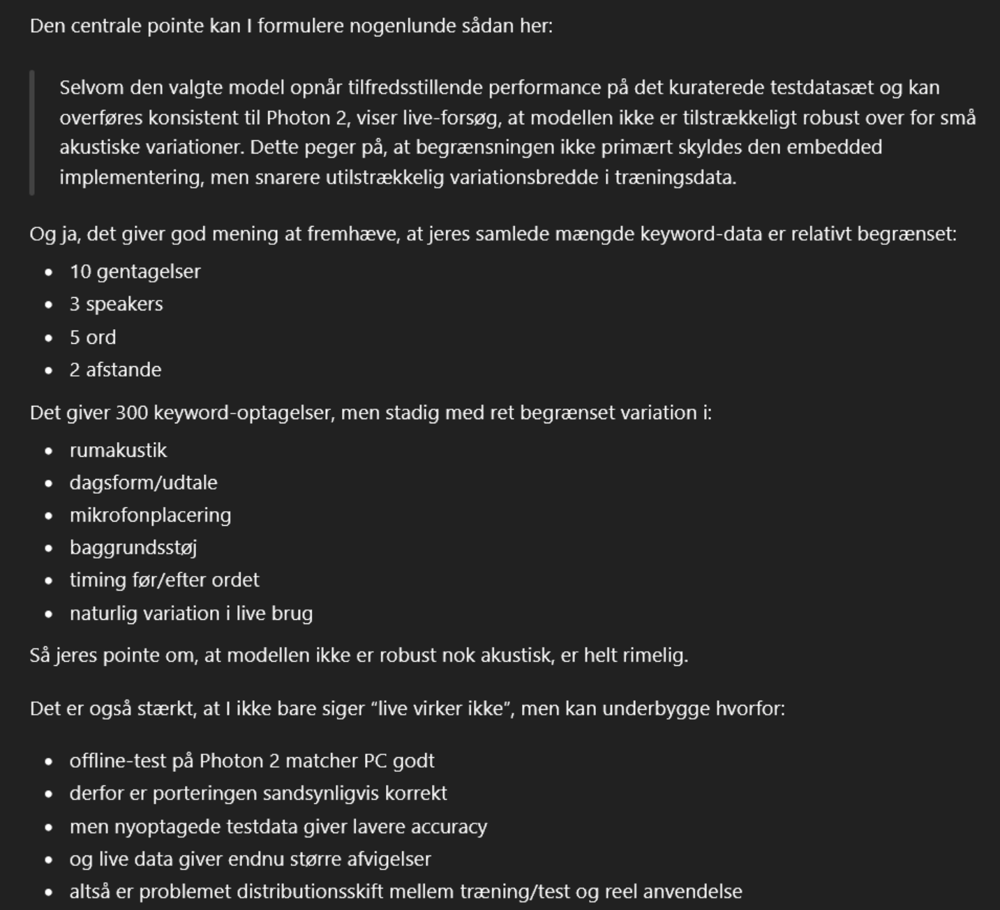

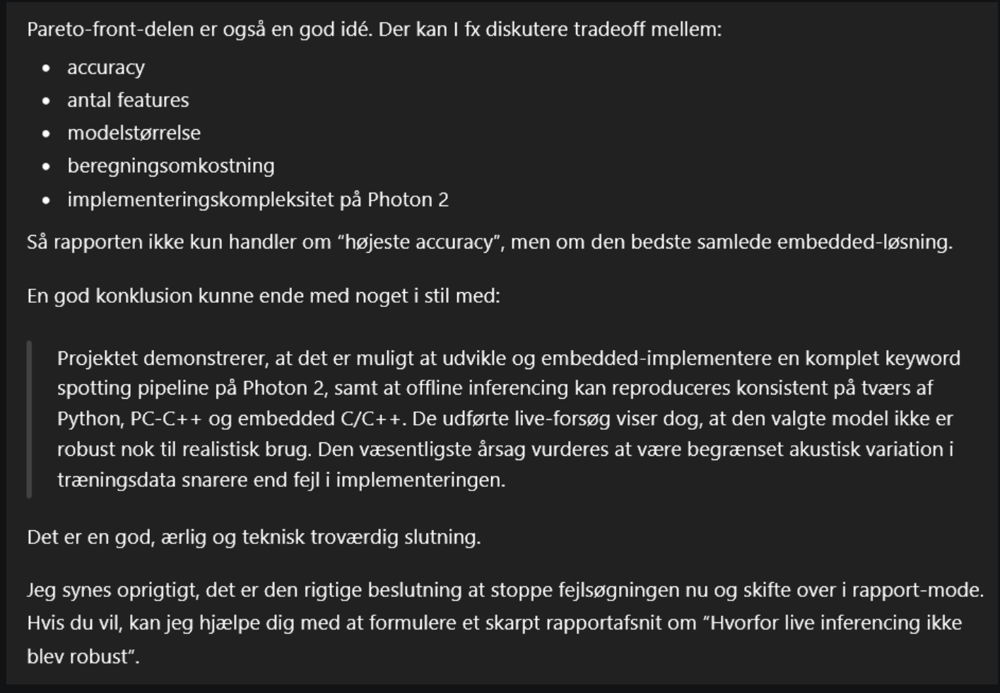

VEND DERMED DENNE HER TANKE MED ANAS OG JONATHAN I MORGEN 
- Når vi skal til at sammenligne vores valgte ML model med en DL model, så skal vi stadigvæk tage udgangspunkt i samme trænings og test datasæt --> Fordi at det er simpelthen for risikabelt at arbejde med at forberedere vores træningsdata
    - Så hvis det ikke er optimalt for DL-modellen at vi kun har 300 i træning og 140 i test, så må det være sådan. Så har vi noget vi kan diskutere om i rapporten :)

- Ift. dataopsamlingen resultaterne-afsnittet, så bare forklarer og være ærlige at vores træningsdata ikke er grundigt nok.